#CLUSTERING-Employee Segementation on absenteeism

##IMPORTING LIBRARIES

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score,silhouette_samples
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
import matplotlib.cm as cm

In [ ]:
from sklearn.cluster import KMeans, AgglomerativeClustering

##DATA PREPARATION AND PREPROCESSING

In [ ]:
#READING DATASET

df=pd.read_csv('/content/DS3_C6_S3_Clustering_AbsenteeismAtWork_Data_Project.csv',sep=';')
DDF=df.copy()
print(df.shape)
df.drop(['ID'],axis=1,inplace=True)
df.tail(2)

(740, 21)


,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
738,0,0,4,2,231,35,14,39,271.219,95,0,1,2,1,0,2,100,170,35,0
739,0,0,6,3,179,45,14,53,271.219,95,0,1,1,0,0,1,77,175,25,0


In [ ]:
#CHECKING FOR NULL VALUES AND DATA TYPES OF COLUMN
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 740 entries, 0 to 739
Data columns (total 20 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Reason for absence               740 non-null    int64  
 1   Month of absence                 740 non-null    int64  
 2   Day of the week                  740 non-null    int64  
 3   Seasons                          740 non-null    int64  
 4   Transportation expense           740 non-null    int64  
 5   Distance from Residence to Work  740 non-null    int64  
 6   Service time                     740 non-null    int64  
 7   Age                              740 non-null    int64  
 8   Work load Average/day            740 non-null    float64
 9   Hit target                       740 non-null    int64  
 10  Disciplinary failure             740 non-null    int64  
 11  Education                        740 non-null    int64  
 12  Son                   

In [ ]:
#DESCRIBING THE DATASET
df.describe()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
count,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000
mean,19.216216,6.324324,3.914865,2.544595,221.329730,29.631081,12.554054,36.450000,271.490235,94.587838,0.054054,1.291892,1.018919,0.567568,0.072973,0.745946,79.035135,172.114865,26.677027,6.924324
std,8.433406,3.436287,1.421675,1.111831,66.952223,14.836788,4.384873,6.478772,39.058116,3.779313,0.226277,0.673238,1.098489,0.495749,0.260268,1.318258,12.883211,6.034995,4.285452,13.330998
min,0.000000,0.000000,2.000000,1.000000,118.000000,5.000000,1.000000,27.000000,205.917000,81.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,56.000000,163.000000,19.000000,0.000000
25%,13.000000,3.000000,3.000000,2.000000,179.000000,16.000000,9.000000,31.000000,244.387000,93.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,69.000000,169.000000,24.000000,2.000000
50%,23.000000,6.000000,4.000000,3.000000,225.000000,26.000000,13.000000,37.000000,264.249000,95.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,83.000000,170.000000,25.000000,3.000000
75%,26.000000,9.000000,5.000000,4.000000,260.000000,50.000000,16.000000,40.000000,294.217000,97.000000,0.000000,1.000000,2.000000,1.000000,0.000000,1.000000,89.000000,172.000000,31.000000,8.000000
max,28.000000,12.000000,6.000000,4.000000,388.000000,52.000000,29.000000,58.000000,378.884000,100.000000,1.000000,4.000000,4.000000,1.000000,1.000000,8.000000,108.000000,196.000000,38.000000,120.000000


In [ ]:
df.columns

Index(['Reason for absence', 'Month of absence', 'Day of the week', 'Seasons',
       'Transportation expense', 'Distance from Residence to Work',
       'Service time', 'Age', 'Work load Average/day ', 'Hit target',
       'Disciplinary failure', 'Education', 'Son', 'Social drinker',
       'Social smoker', 'Pet', 'Weight', 'Height', 'Body mass index',
       'Absenteeism time in hours'],
      dtype='object')

In [ ]:
df[(df['Absenteeism time in hours']==0)&(df['Reason for absence']>0)]

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
134,27,1,2,2,118,10,10,37,308.593,95,0,1,0,0,0,0,83,172,28,0


we found 1 value of Absenteeism time in hours to be replaced,as it shows **Absenteeism time in hours** as 0 with **Reason for absence** as 27

In [ ]:
value=df.groupby(by=['Reason for absence'])['Absenteeism time in hours'].mean()[27]
df.loc[134,'Absenteeism time in hours']=value

In [ ]:
_df=df.copy()
#OUTLIER TREATMENT
print('ROWS AND COLUMNS BEFORE REMOVING OUTLIERS:',_df.shape)
print()
def myoutliers(df,col):
    
    Q1=np.quantile(df[col],0.25)
    Q3=np.quantile(df[col],0.75)
    
    IQR=Q3-Q1
    
    global mylist
    global my_outlier_df
    
    UF=Q3+1.5*IQR
    LF=Q1-1.5*IQR
    
    print('LOWER RANGE OF',col,'IS',LF)
    print('UPPER RANGE OF',col,'IS',UF)
    
    mylist=[x for x in df[col] if((x<LF) | (x>UF))]
    print('TOTAL OUTLIERS IN',col,'ARE',len(mylist))
    my_outlier_df=df.loc[df[col].isin(mylist)]
    
for i in df.select_dtypes('number'):
    print('I is', i)
    myoutliers(_df, i)
    Index=my_outlier_df.index
    _df=_df.drop(Index)
    print("************************************")
print()
print('ROWS AND COLUMNS AFTER REMOVING OUTLIERS:',_df.shape,'\n')

ROWS AND COLUMNS BEFORE REMOVING OUTLIERS: (740, 20)

I is Reason for absence
LOWER RANGE OF Reason for absence IS -6.5
UPPER RANGE OF Reason for absence IS 45.5
TOTAL OUTLIERS IN Reason for absence ARE 0
************************************
I is Month of absence
LOWER RANGE OF Month of absence IS -6.0
UPPER RANGE OF Month of absence IS 18.0
TOTAL OUTLIERS IN Month of absence ARE 0
************************************
I is Day of the week
LOWER RANGE OF Day of the week IS 0.0
UPPER RANGE OF Day of the week IS 8.0
TOTAL OUTLIERS IN Day of the week ARE 0
************************************
I is Seasons
LOWER RANGE OF Seasons IS -1.0
UPPER RANGE OF Seasons IS 7.0
TOTAL OUTLIERS IN Seasons ARE 0
************************************
I is Transportation expense
LOWER RANGE OF Transportation expense IS 57.5
UPPER RANGE OF Transportation expense IS 381.5
TOTAL OUTLIERS IN Transportation expense ARE 3
************************************
I is Distance from Residence to Work
LOWER RANGE OF Dist

Outliers are neglected as they are resonable

In [ ]:
df.columns

Index(['Reason for absence', 'Month of absence', 'Day of the week', 'Seasons',
       'Transportation expense', 'Distance from Residence to Work',
       'Service time', 'Age', 'Work load Average/day ', 'Hit target',
       'Disciplinary failure', 'Education', 'Son', 'Social drinker',
       'Social smoker', 'Pet', 'Weight', 'Height', 'Body mass index',
       'Absenteeism time in hours'],
      dtype='object')

In [ ]:
scaler=StandardScaler()
df_s=scaler.fit_transform(df)
df_scale=pd.DataFrame(df_s,columns=df.columns)
df_scale.head(5)

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
0,0.804938,0.196763,-0.643947,-1.390175,1.011408,0.429556,0.101770,-0.532868,-0.818212,0.638686,-0.239046,-0.433857,0.893723,0.872872,-0.280566,0.19285,0.851673,-0.019046,0.775932,-0.219764
1,-2.280124,0.196763,-0.643947,-1.390175,-1.544379,-1.121694,1.242825,2.092860,-0.818212,0.638686,4.183300,-0.433857,-0.017234,0.872872,-0.280566,-0.56624,1.473056,0.975828,1.009438,-0.520050
2,0.448970,0.196763,0.059924,-1.390175,-0.632665,1.441240,1.242825,0.239405,-0.818212,0.638686,-0.239046,-0.433857,-0.928191,0.872872,-0.280566,-0.56624,0.774000,-0.350671,1.009438,-0.369907
3,-1.449530,0.196763,0.763796,-1.390175,0.861947,-1.661258,0.329981,0.393859,-0.818212,0.638686,-0.239046,-0.433857,0.893723,0.872872,3.564226,-0.56624,-0.857131,-0.682295,-0.625100,-0.219764
4,0.448970,0.196763,0.763796,-1.390175,1.011408,0.429556,0.101770,-0.532868,-0.818212,0.638686,-0.239046,-0.433857,0.893723,0.872872,-0.280566,0.19285,0.851673,-0.019046,0.775932,-0.369907


In [ ]:
df_scale.tail(5)

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
735,-0.618937,0.196763,-0.643947,-1.390175,1.011408,0.429556,0.101770,-0.532868,-0.176427,-0.420423,-0.239046,-0.433857,0.893723,0.872872,-0.280566,0.192850,0.851673,-0.019046,0.775932,0.080522
736,-0.974905,0.196763,-0.643947,-1.390175,0.204318,-1.256585,0.329981,0.084950,-0.176427,-0.420423,-0.239046,2.538869,-0.017234,-1.145644,-0.280566,0.192850,0.696327,-0.019046,0.542427,-0.219764
737,-2.280124,-1.841698,-0.643947,-1.390175,-1.544379,-1.054248,0.101770,0.548314,-0.006949,0.109131,-0.239046,-0.433857,-0.017234,0.872872,-0.280566,5.506478,1.473056,-0.350671,1.709954,-0.520050
738,-2.280124,-1.841698,0.059924,-0.490149,0.144533,0.362110,0.329981,0.393859,-0.006949,0.109131,-0.239046,-0.433857,0.893723,0.872872,-0.280566,0.951940,1.628402,-0.350671,1.943459,-0.520050
739,-2.280124,-1.841698,1.467667,0.409877,-0.632665,1.036566,0.329981,2.556224,-0.006949,0.109131,-0.239046,-0.433857,-0.017234,-1.145644,-0.280566,0.192850,-0.158075,0.478391,-0.391595,-0.520050


##EXPLORATORY DATA ANALYSIS

In [ ]:
df.shape[1]

20

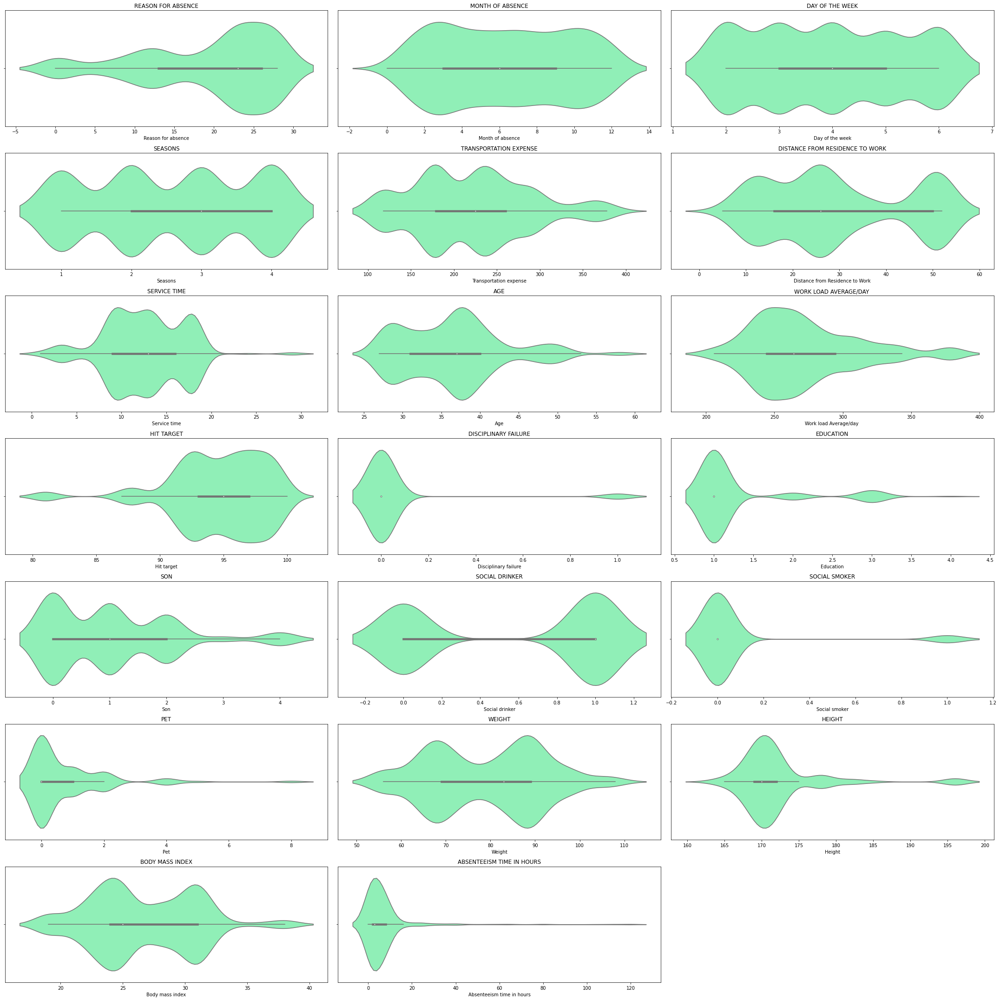

In [ ]:
n=list(enumerate(df))
plt.figure(figsize=(30,30))
for i in n:
    plt.subplot(7,3,i[0]+1)
    sns.violinplot(x=i[1],palette='rainbow',data=df)
    plt.title(i[1].upper())
plt.tight_layout()
plt.show()

**CONCLUSION from unvariate analysis:-**
According to 75 % data:-

*1)REASON FOR ABSENCE-between 13 to 26*

*2)MONTH OF ABSENCE-between 3 to 9*

*3)DAY OF THE WEEK-between 3 to 5*

*4)SEASONS-between 2 to 4*

*5)TRANSPORTATION EXPENSE-between 175 to 275*

*6)DISTANCE FROM RESIDENCE TO WORK-between 15 to 50*

*7)SERVICE TIME-between 9 to 16*

*8)AGE-between 31 to 40*

*9)WORK LOAD AVERAGE/DAY-between 240 to 290*

*10)HIT TARGET-between 93 to 97*

*11)DISCIPLINARY FAILURE -Most of them have 0*

*12)EDUCATION-Most people have 1 as education*

*13)SON-between 0 to 2*

*14)SOCIAL DRINKER- Most of them have 1*

*15)SOCIAL SMOKER-Most of them have 0*

*16)PET-between 0 to 1*

*17)WEIGHT-between 70 to 90*

*18)HEIGHT-between 168 to 173*

*19)BMI-between 24 to 32*

*20)ABSENTEEISM TIME IN HOURS-between 0 to 8*


In [ ]:
df.columns

Index(['Reason for absence', 'Month of absence', 'Day of the week', 'Seasons',
       'Transportation expense', 'Distance from Residence to Work',
       'Service time', 'Age', 'Work load Average/day ', 'Hit target',
       'Disciplinary failure', 'Education', 'Son', 'Social drinker',
       'Social smoker', 'Pet', 'Weight', 'Height', 'Body mass index',
       'Absenteeism time in hours'],
      dtype='object')

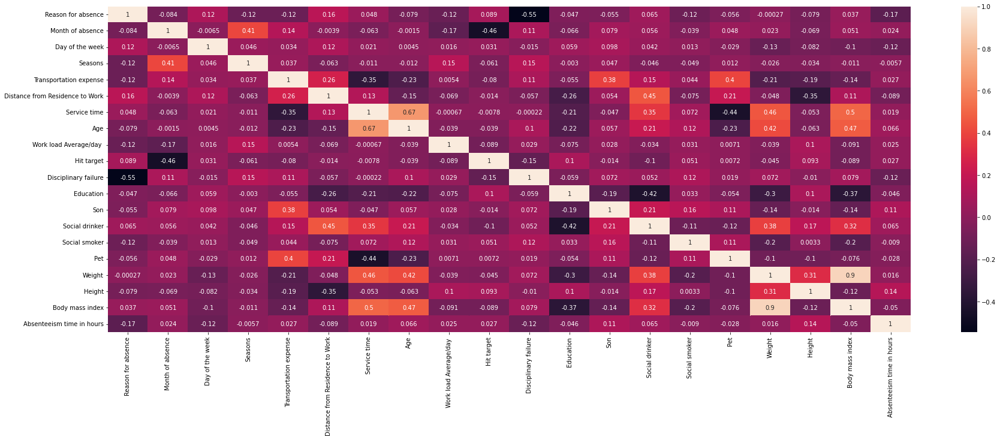

In [ ]:
#CHECKING CORRELATION BETWEEN COLUMNS
plt.figure(figsize=(30,10))
sns.heatmap(df_scale.corr(),annot=True)
plt.show()

We cannot determine any columns which have correlation with Absenteeism time in hours.

##CLUSTERING

###K-MEANS

Finding the best cluster size as 4 from silhouette and elbow method

For n_clusters = 2 The average silhouette_score is : 0.3777658795435775
For n_clusters = 3 The average silhouette_score is : 0.301069292223578
For n_clusters = 4 The average silhouette_score is : 0.3581331726979358
For n_clusters = 5 The average silhouette_score is : 0.32844399093031457
For n_clusters = 6 The average silhouette_score is : 0.35530788456196316
For n_clusters = 7 The average silhouette_score is : 0.33717149087335857
For n_clusters = 8 The average silhouette_score is : 0.34142504741870033
For n_clusters = 9 The average silhouette_score is : 0.3251994093296726


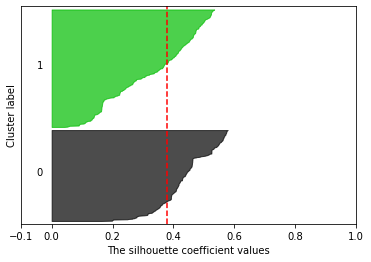

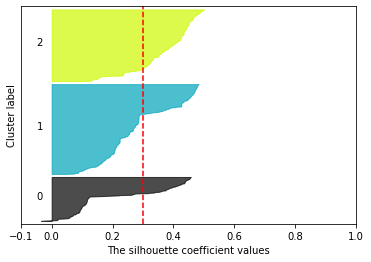

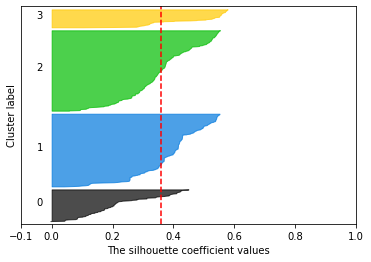

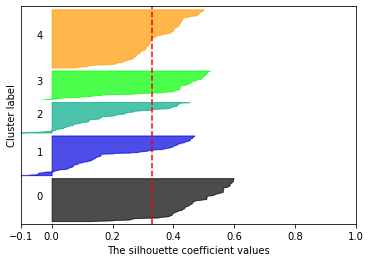

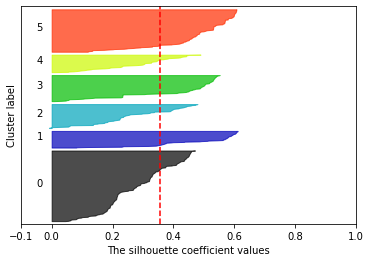

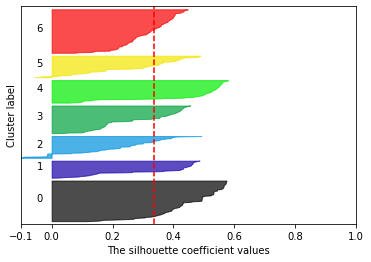

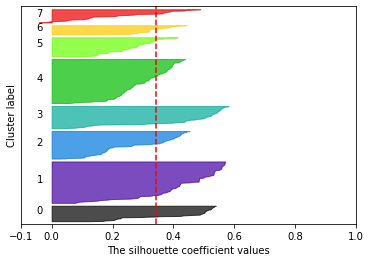

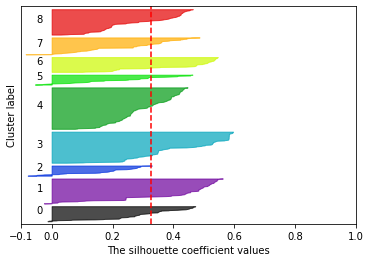

In [ ]:
for n_clusters in range(2,10):
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=50)
    cluster_labels = clusterer.fit_predict(df)

    silhouette_avg = silhouette_score(df, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

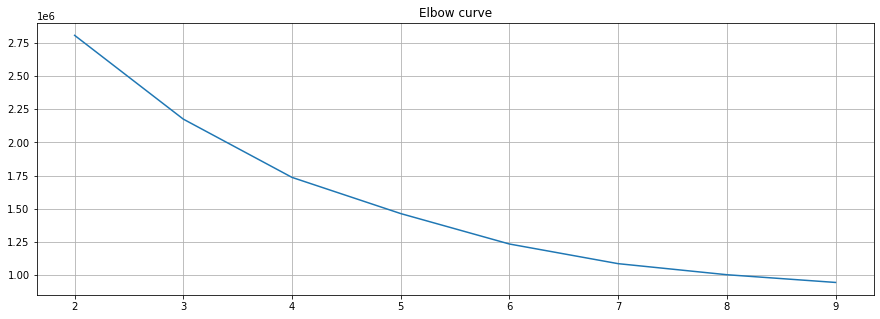

In [ ]:
distorsions = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 10), distorsions)
plt.grid(True)
plt.title('Elbow curve')
plt.show()

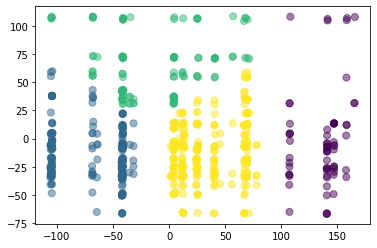

In [ ]:
steps = [('dimension_reduction', PCA()), ('kmeans', KMeans())]
component=2
pipeline = Pipeline(steps) # define the pipeline object.

pipline = pipeline.set_params(kmeans__n_clusters=4)
pipline = pipeline.set_params(dimension_reduction__n_components=component)
# print(pipeline)
X_ = pipeline.fit_predict(df)   
df_plot = pd.DataFrame(PCA().fit_transform(df)[:, :component])    
df_plot['cluster'] = X_        
# print(df_plot)
plt.scatter(df_plot[0], df_plot[1], c= df_plot['cluster'], s=50, alpha=0.5)
plt.show()

Reason for absence vs Month of absence


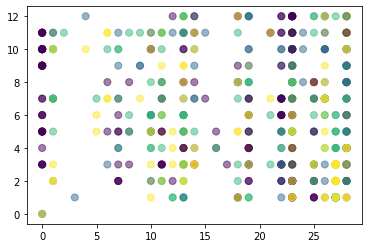

Reason for absence vs Day of the week


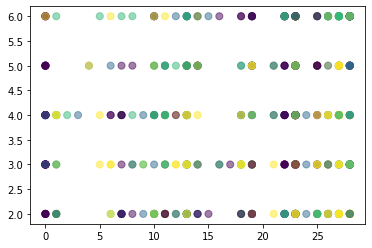

Reason for absence vs Seasons


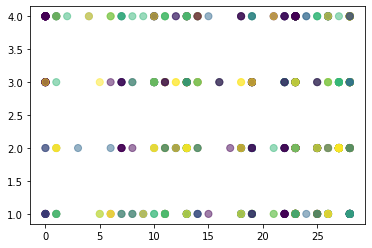

Reason for absence vs Transportation expense


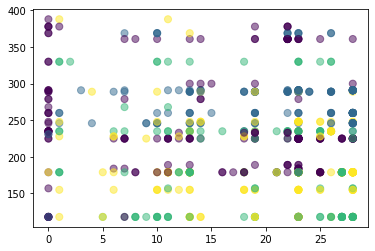

Reason for absence vs Distance from Residence to Work


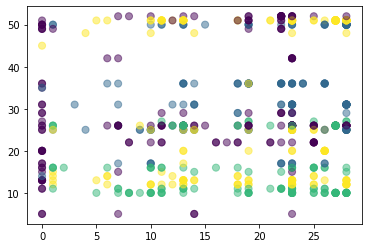

Reason for absence vs Service time


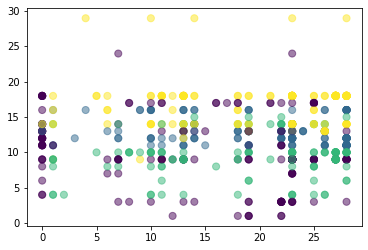

Reason for absence vs Age


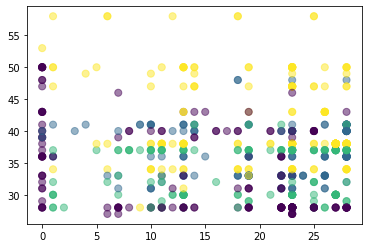

Reason for absence vs Work load Average/day 


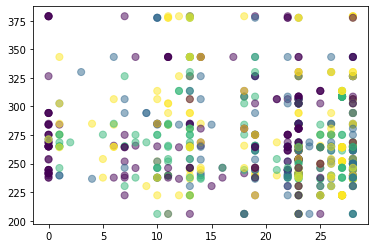

Reason for absence vs Hit target


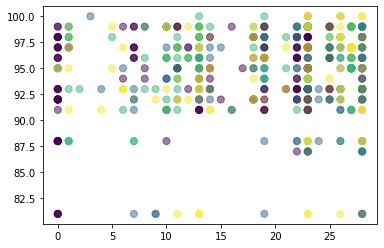

Reason for absence vs Disciplinary failure


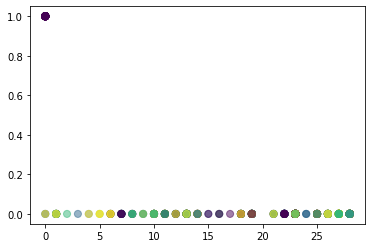

Reason for absence vs Education


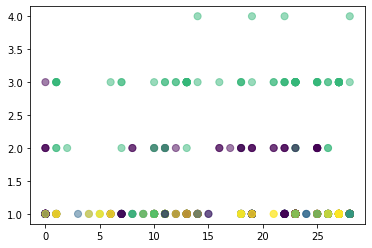

Reason for absence vs Son


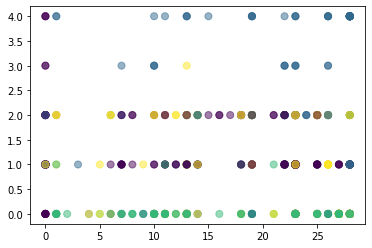

Reason for absence vs Social drinker


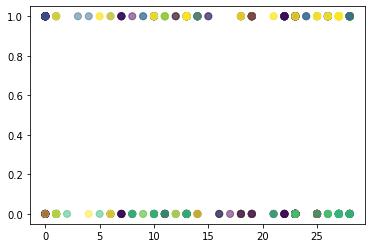

Reason for absence vs Social smoker


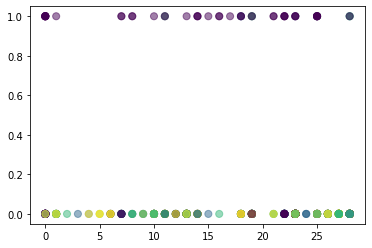

Reason for absence vs Pet


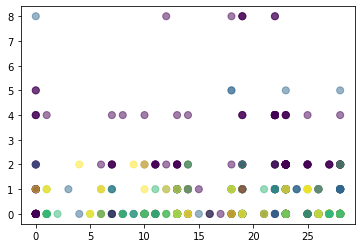

Reason for absence vs Weight


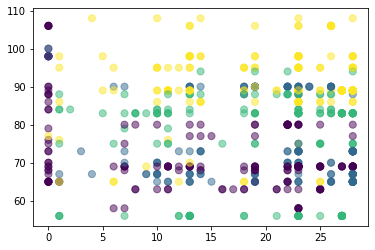

Reason for absence vs Height


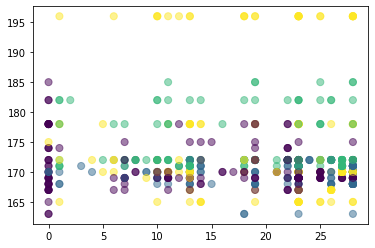

Reason for absence vs Body mass index


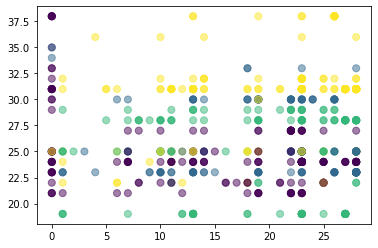

Reason for absence vs Absenteeism time in hours


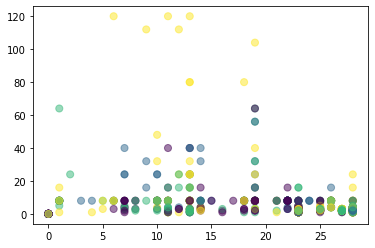

Reason for absence vs Clusters


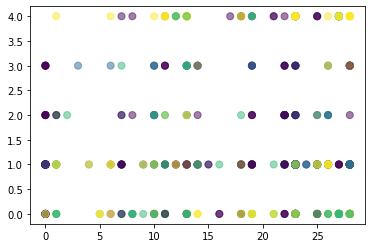

Reason for absence vs cluster


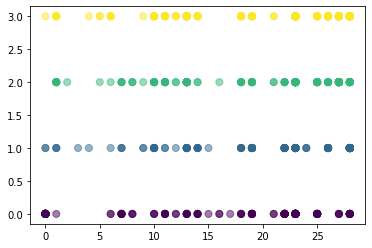

Month of absence vs Reason for absence


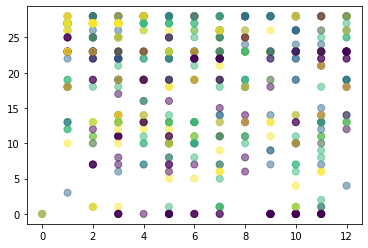

Month of absence vs Day of the week


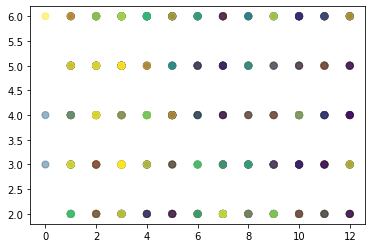

Month of absence vs Seasons


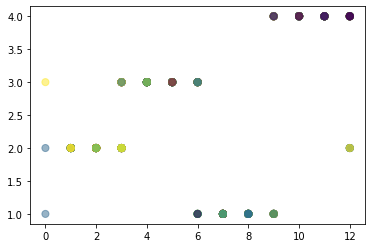

Month of absence vs Transportation expense


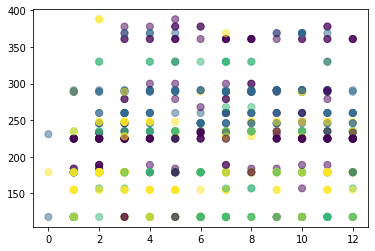

Month of absence vs Distance from Residence to Work


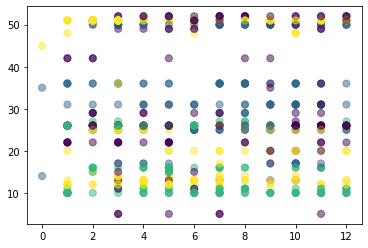

Month of absence vs Service time


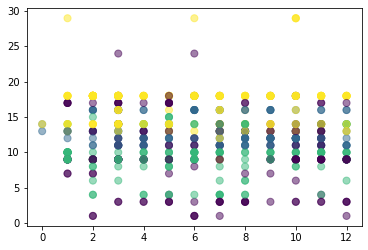

Month of absence vs Age


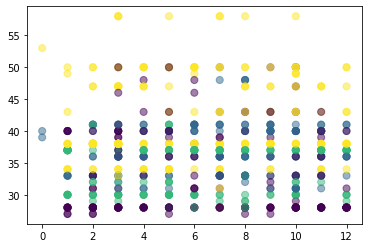

Month of absence vs Work load Average/day 


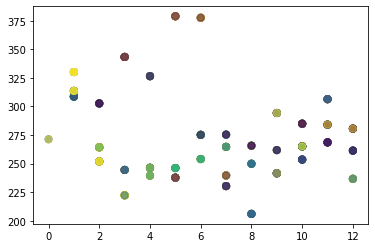

Month of absence vs Hit target


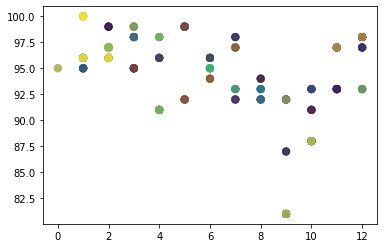

Month of absence vs Disciplinary failure


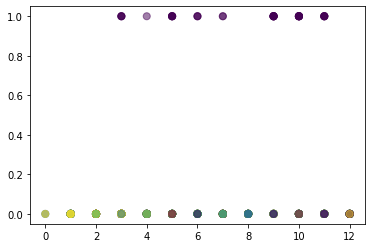

Month of absence vs Education


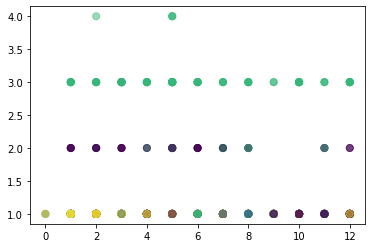

Month of absence vs Son


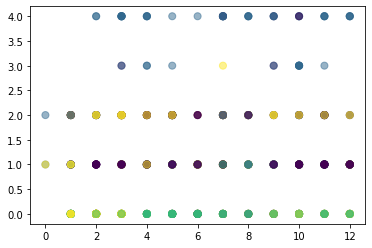

Month of absence vs Social drinker


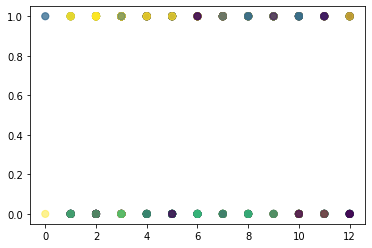

Month of absence vs Social smoker


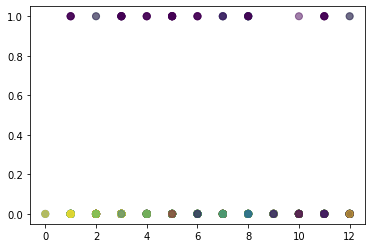

Month of absence vs Pet


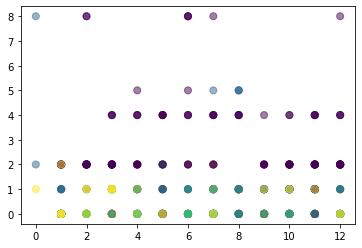

Month of absence vs Weight


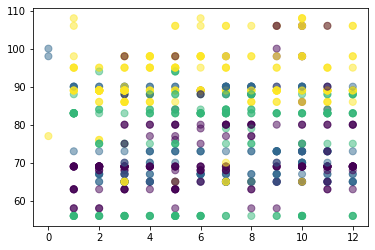

Month of absence vs Height


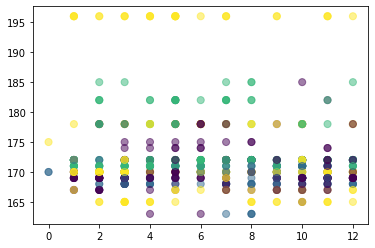

Month of absence vs Body mass index


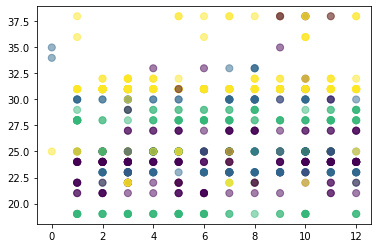

Month of absence vs Absenteeism time in hours


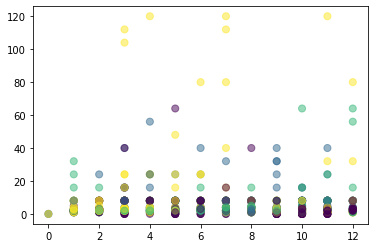

Month of absence vs Clusters


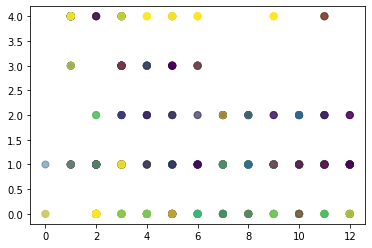

Month of absence vs cluster


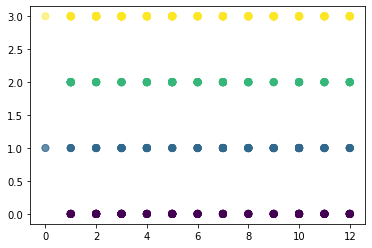

Day of the week vs Reason for absence


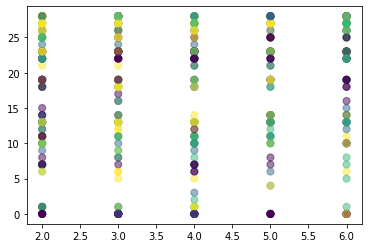

Day of the week vs Month of absence


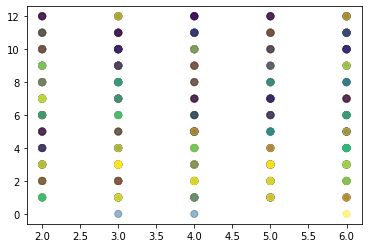

Day of the week vs Seasons


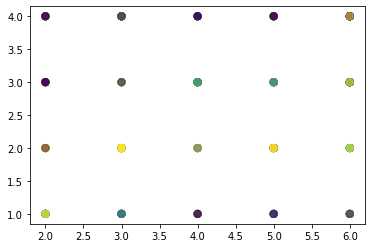

Day of the week vs Transportation expense


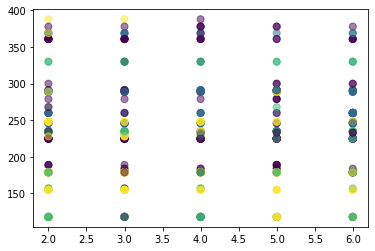

Day of the week vs Distance from Residence to Work


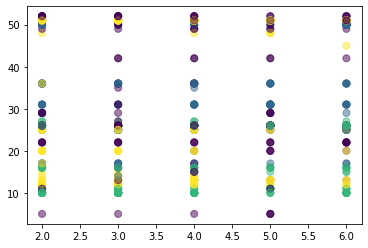

Day of the week vs Service time


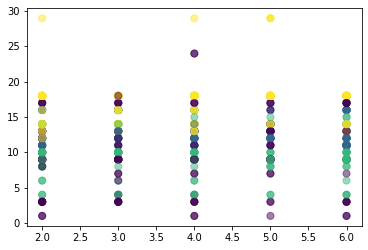

Day of the week vs Age


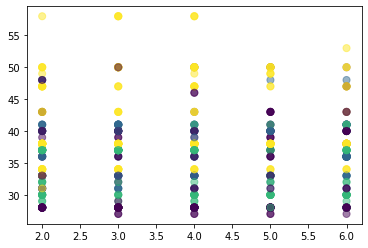

Day of the week vs Work load Average/day 


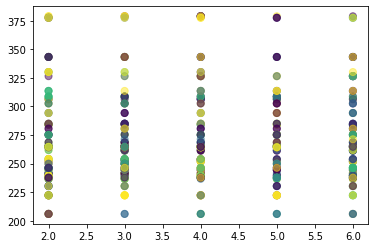

Day of the week vs Hit target


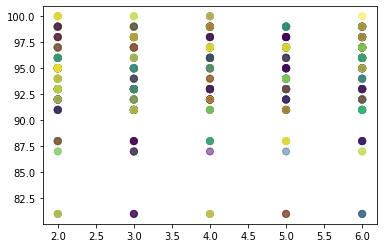

Day of the week vs Disciplinary failure


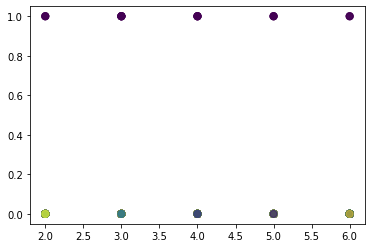

Day of the week vs Education


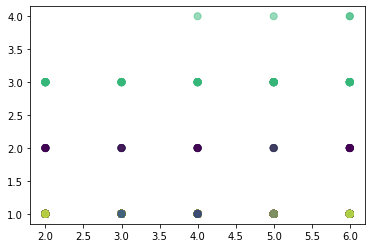

Day of the week vs Son


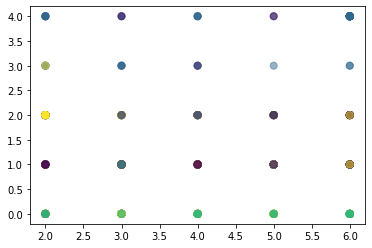

Day of the week vs Social drinker


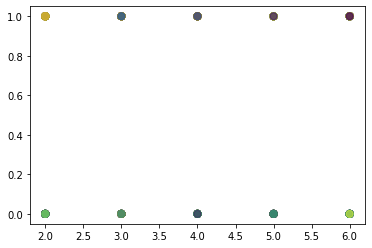

Day of the week vs Social smoker


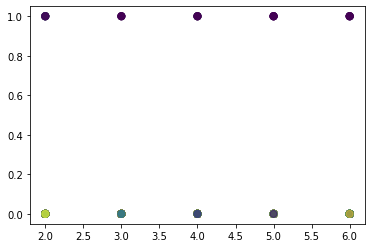

Day of the week vs Pet


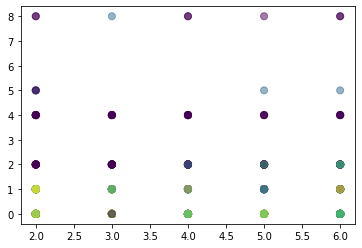

Day of the week vs Weight


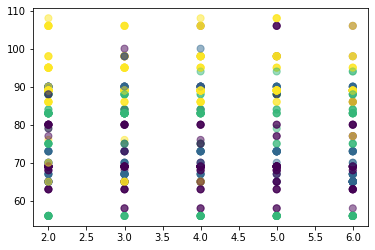

Day of the week vs Height


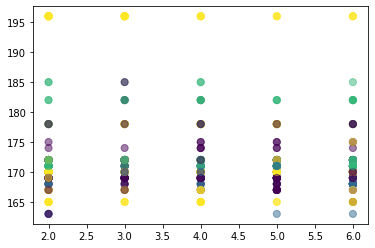

Day of the week vs Body mass index


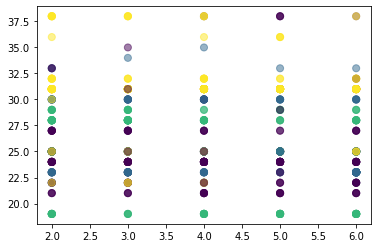

Day of the week vs Absenteeism time in hours


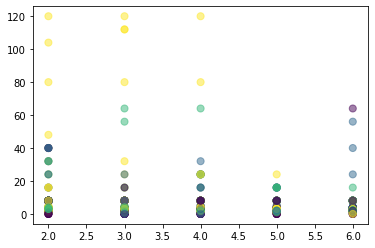

Day of the week vs Clusters


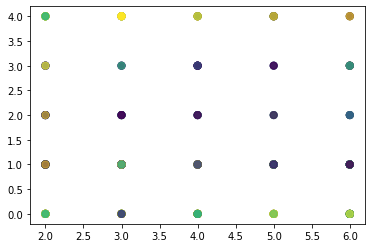

Day of the week vs cluster


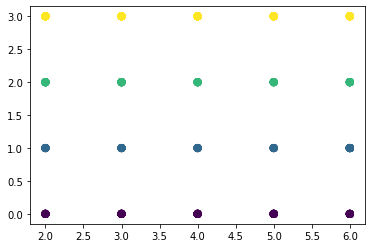

Seasons vs Reason for absence


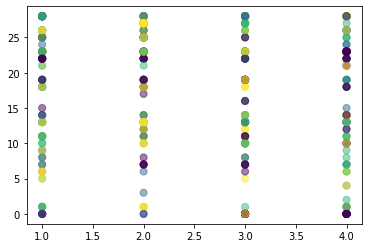

Seasons vs Month of absence


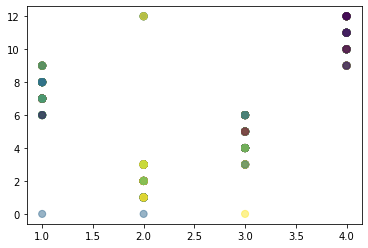

Seasons vs Day of the week


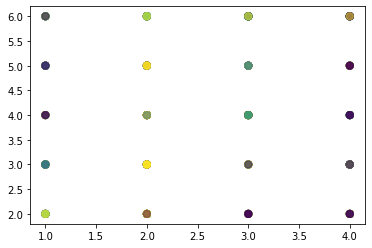

Seasons vs Transportation expense


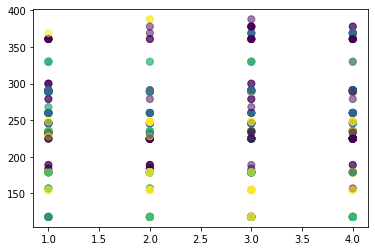

Seasons vs Distance from Residence to Work


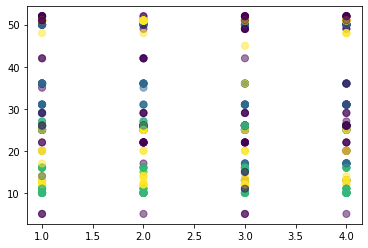

Seasons vs Service time


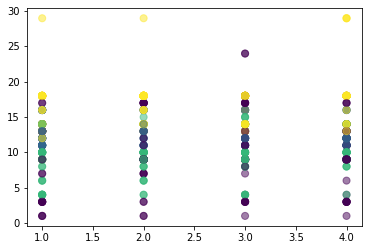

Seasons vs Age


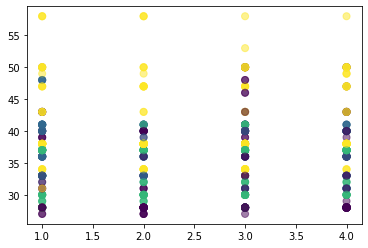

Seasons vs Work load Average/day 


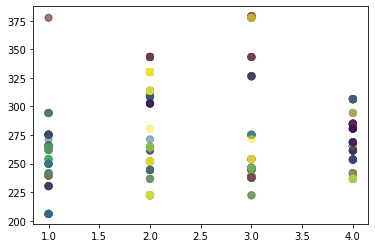

Seasons vs Hit target


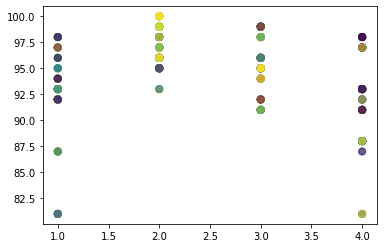

Seasons vs Disciplinary failure


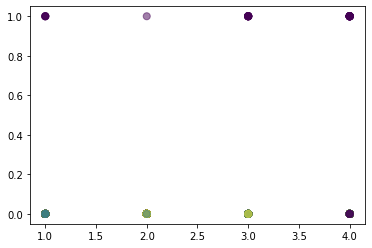

Seasons vs Education


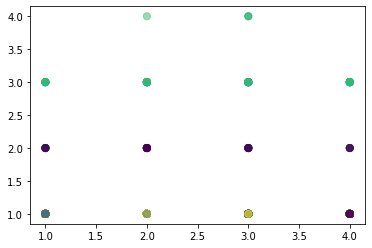

Seasons vs Son


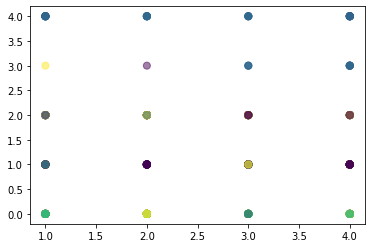

Seasons vs Social drinker


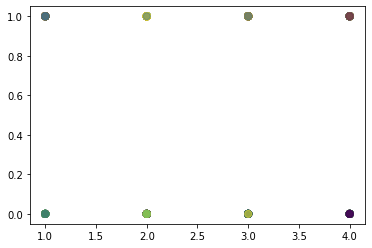

Seasons vs Social smoker


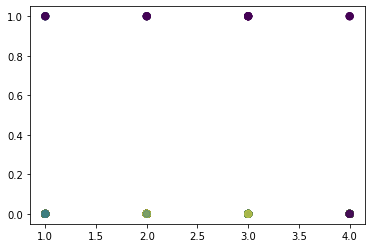

Seasons vs Pet


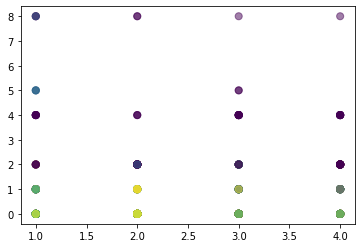

Seasons vs Weight


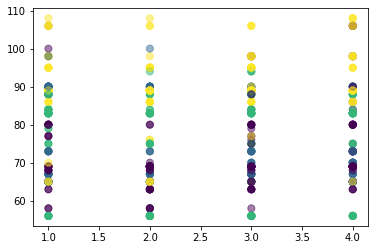

Seasons vs Height


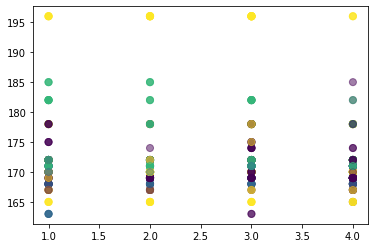

Seasons vs Body mass index


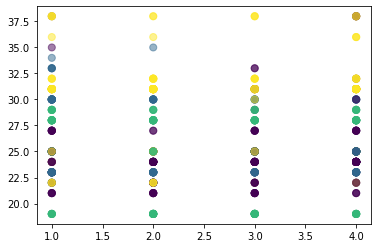

Seasons vs Absenteeism time in hours


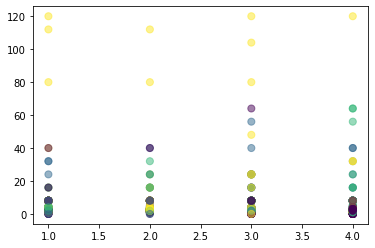

Seasons vs Clusters


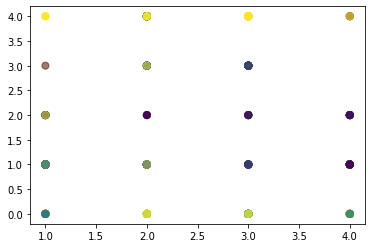

Seasons vs cluster


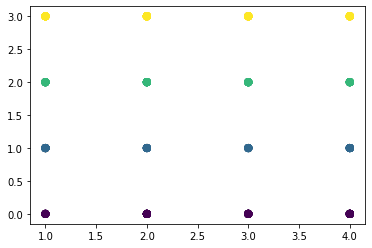

Transportation expense vs Reason for absence


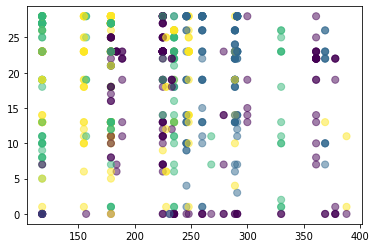

Transportation expense vs Month of absence


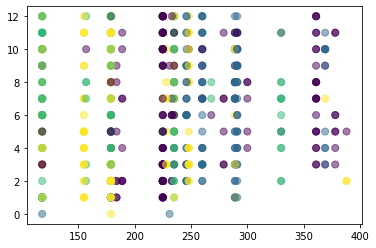

Transportation expense vs Day of the week


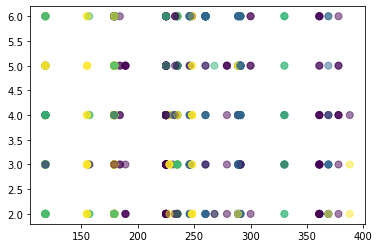

Transportation expense vs Seasons


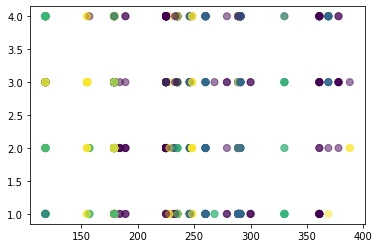

Transportation expense vs Distance from Residence to Work


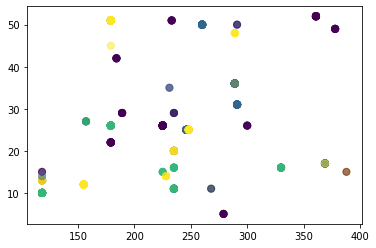

Transportation expense vs Service time


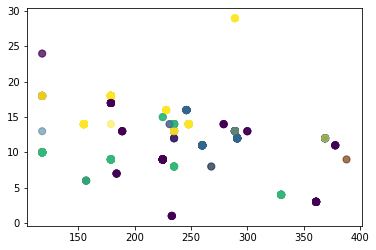

Transportation expense vs Age


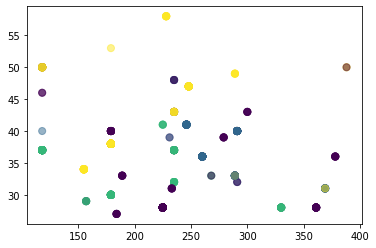

Transportation expense vs Work load Average/day 


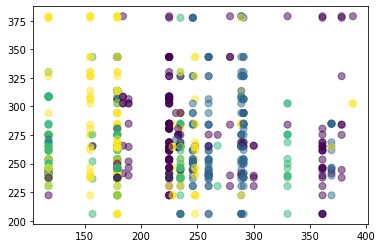

Transportation expense vs Hit target


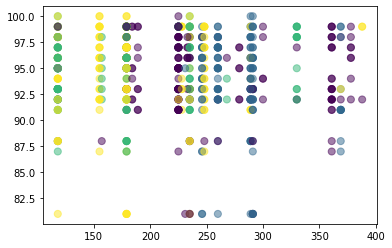

Transportation expense vs Disciplinary failure


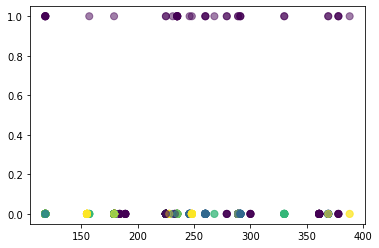

Transportation expense vs Education


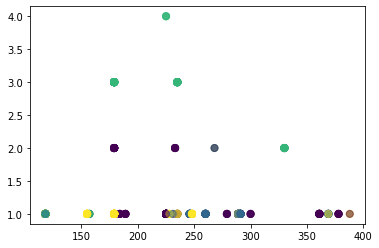

Transportation expense vs Son


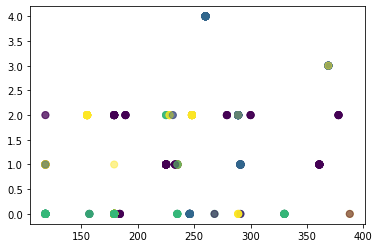

Transportation expense vs Social drinker


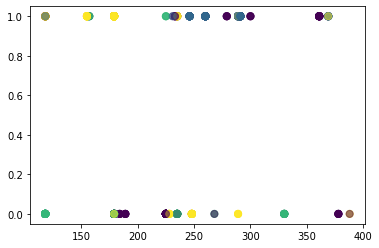

Transportation expense vs Social smoker


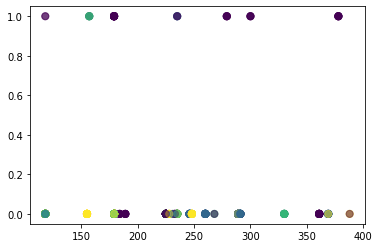

Transportation expense vs Pet


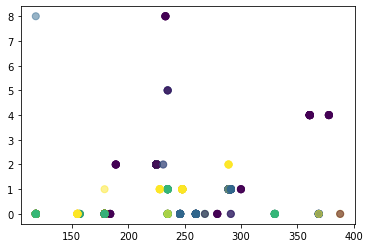

Transportation expense vs Weight


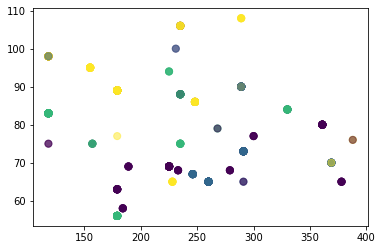

Transportation expense vs Height


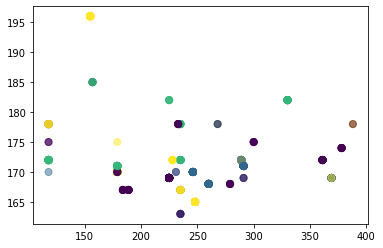

Transportation expense vs Body mass index


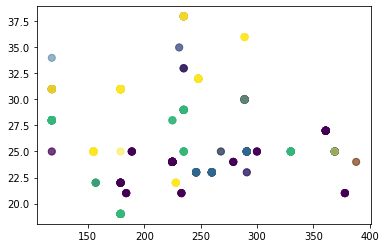

Transportation expense vs Absenteeism time in hours


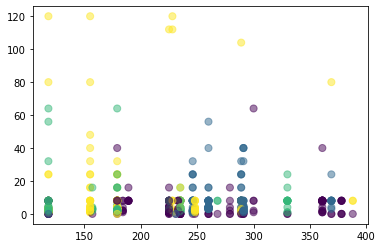

Transportation expense vs Clusters


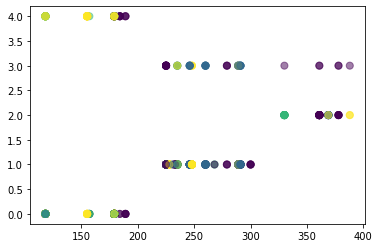

Transportation expense vs cluster


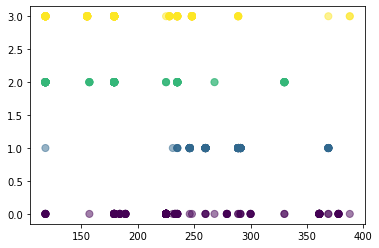

Distance from Residence to Work vs Reason for absence


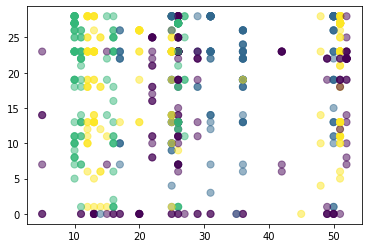

Distance from Residence to Work vs Month of absence


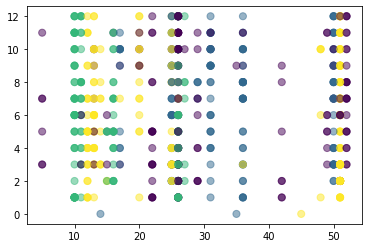

Distance from Residence to Work vs Day of the week


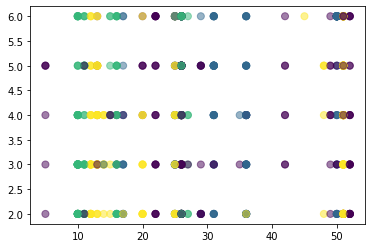

Distance from Residence to Work vs Seasons


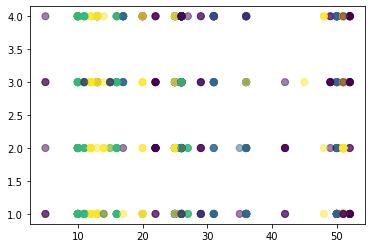

Distance from Residence to Work vs Transportation expense


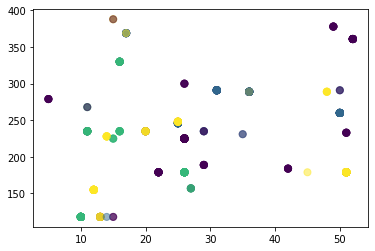

Distance from Residence to Work vs Service time


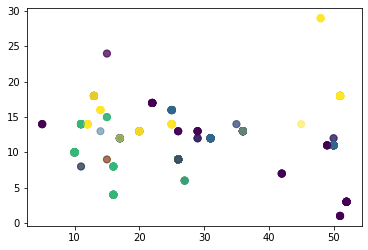

Distance from Residence to Work vs Age


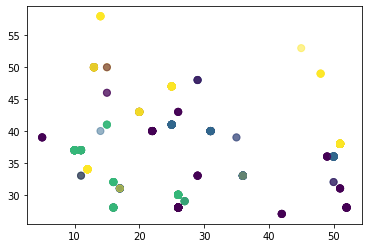

Distance from Residence to Work vs Work load Average/day 


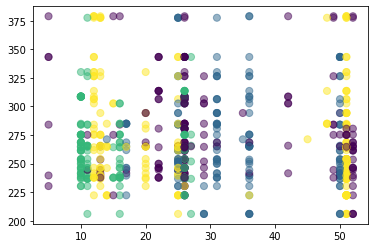

Distance from Residence to Work vs Hit target


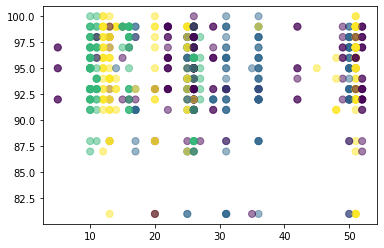

Distance from Residence to Work vs Disciplinary failure


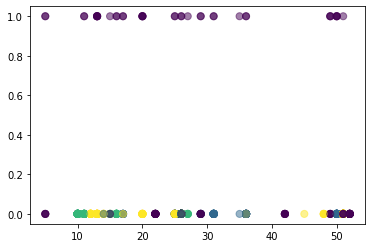

Distance from Residence to Work vs Education


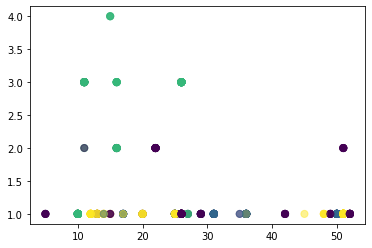

Distance from Residence to Work vs Son


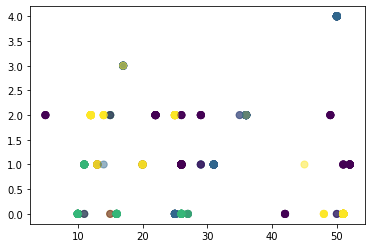

Distance from Residence to Work vs Social drinker


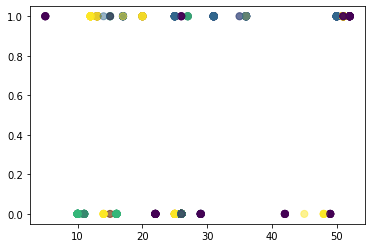

Distance from Residence to Work vs Social smoker


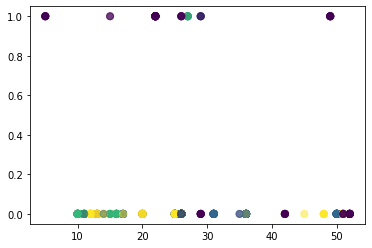

Distance from Residence to Work vs Pet


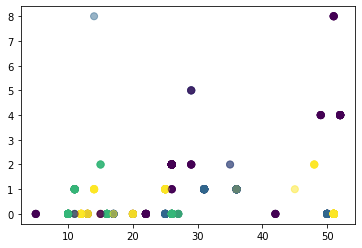

Distance from Residence to Work vs Weight


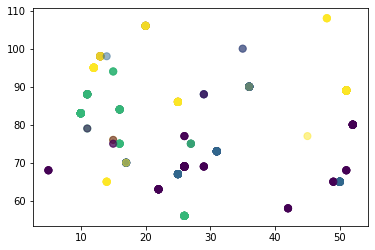

Distance from Residence to Work vs Height


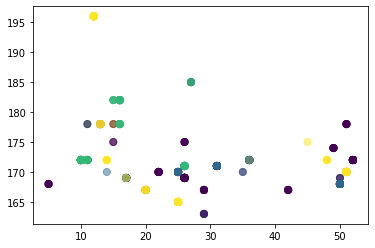

Distance from Residence to Work vs Body mass index


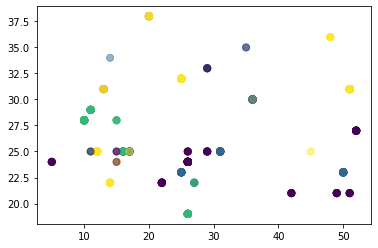

Distance from Residence to Work vs Absenteeism time in hours


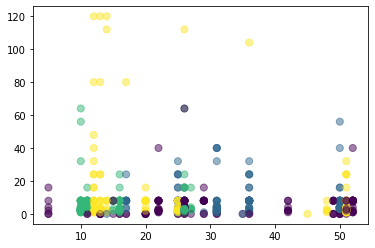

Distance from Residence to Work vs Clusters


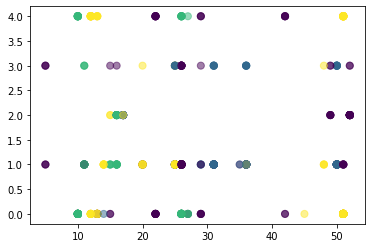

Distance from Residence to Work vs cluster


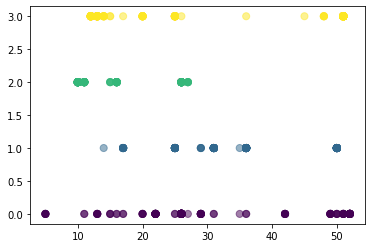

Service time vs Reason for absence


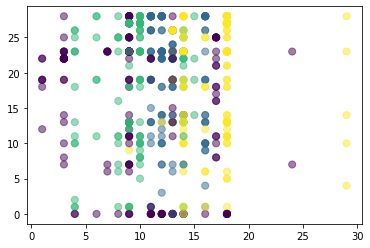

Service time vs Month of absence


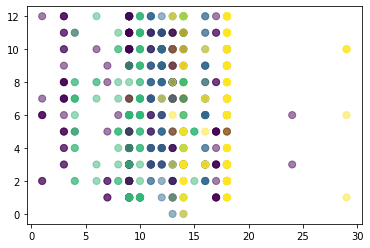

Service time vs Day of the week


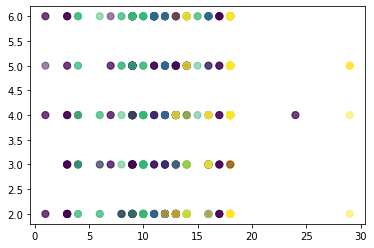

Service time vs Seasons


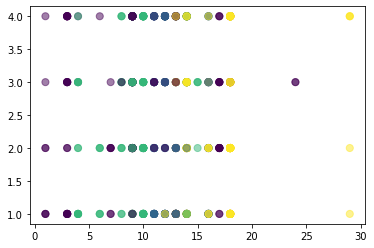

Service time vs Transportation expense


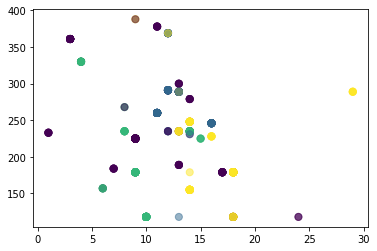

Service time vs Distance from Residence to Work


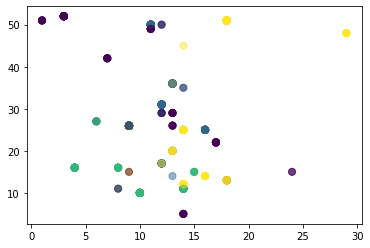

Service time vs Age


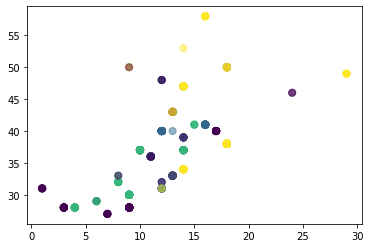

Service time vs Work load Average/day 


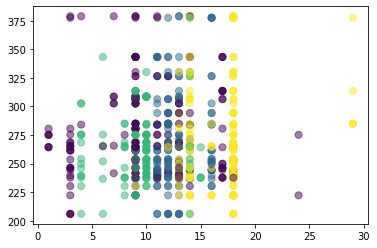

Service time vs Hit target


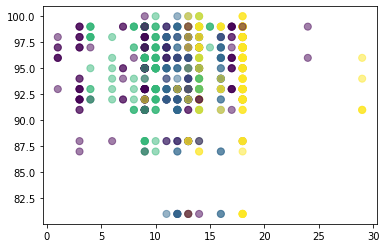

Service time vs Disciplinary failure


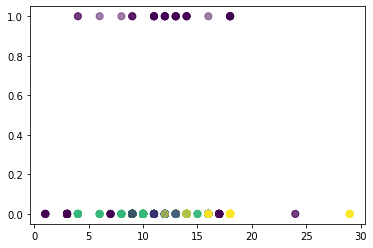

Service time vs Education


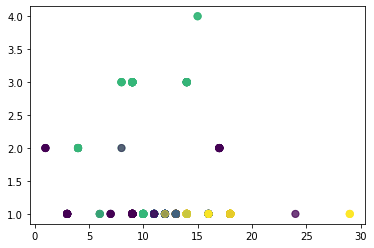

Service time vs Son


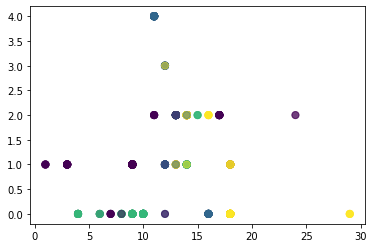

Service time vs Social drinker


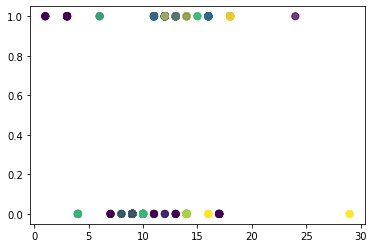

Service time vs Social smoker


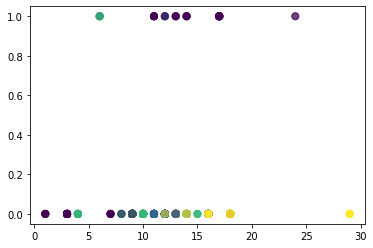

Service time vs Pet


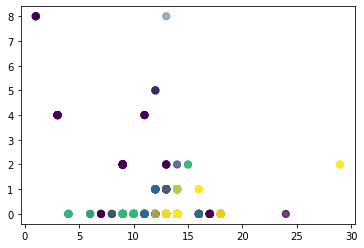

Service time vs Weight


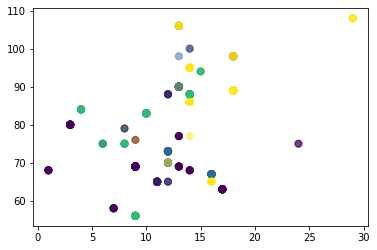

Service time vs Height


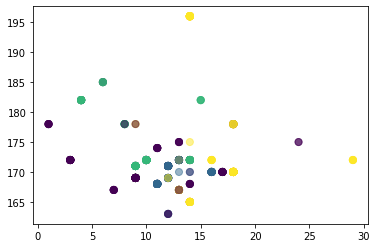

Service time vs Body mass index


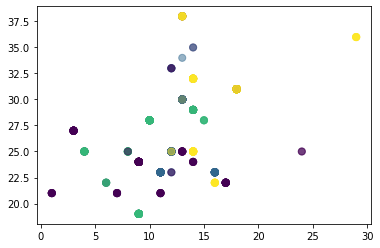

Service time vs Absenteeism time in hours


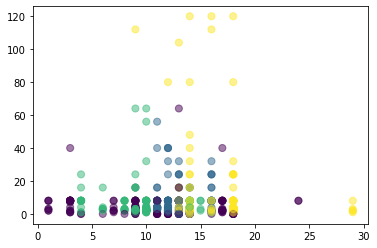

Service time vs Clusters


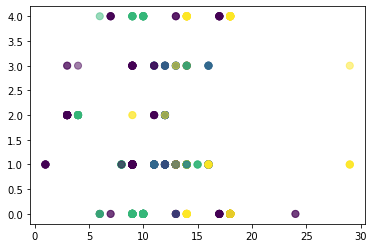

Service time vs cluster


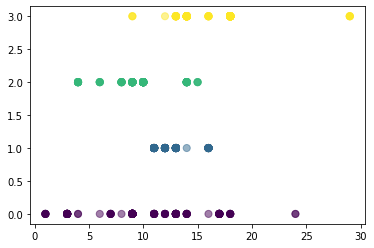

Age vs Reason for absence


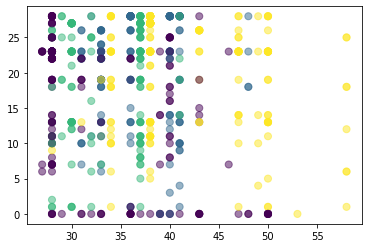

Age vs Month of absence


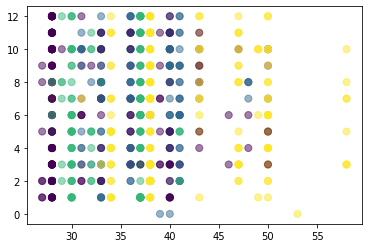

Age vs Day of the week


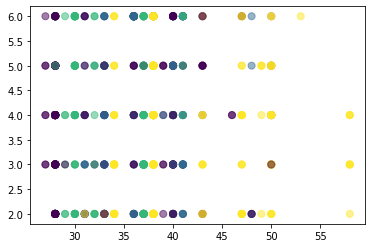

Age vs Seasons


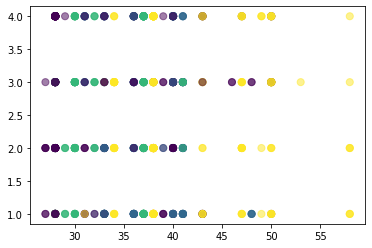

Age vs Transportation expense


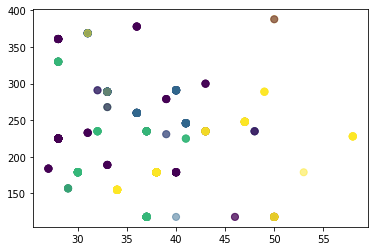

Age vs Distance from Residence to Work


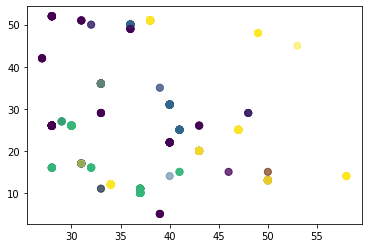

Age vs Service time


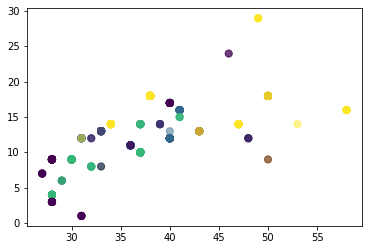

Age vs Work load Average/day 


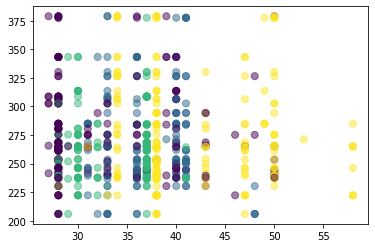

Age vs Hit target


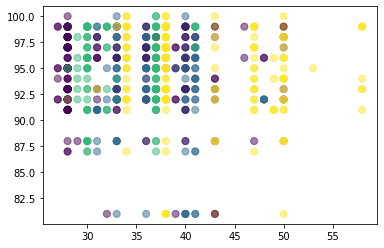

Age vs Disciplinary failure


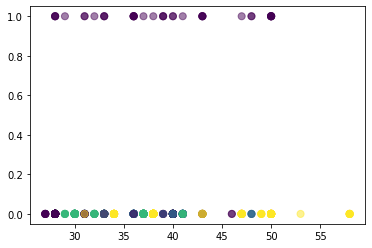

Age vs Education


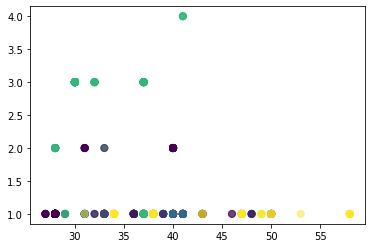

Age vs Son


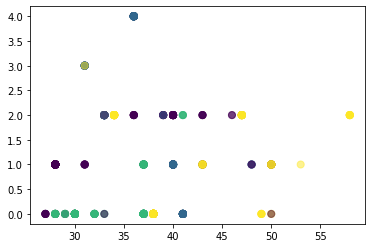

Age vs Social drinker


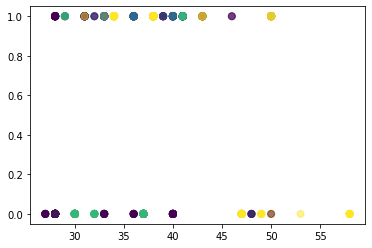

Age vs Social smoker


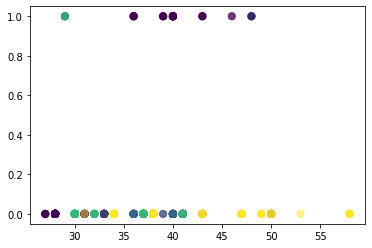

Age vs Pet


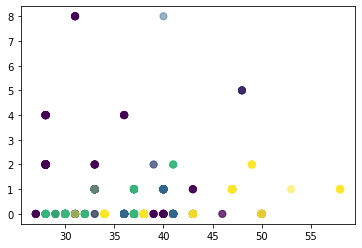

Age vs Weight


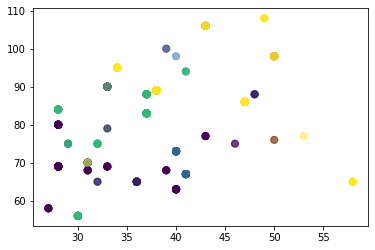

Age vs Height


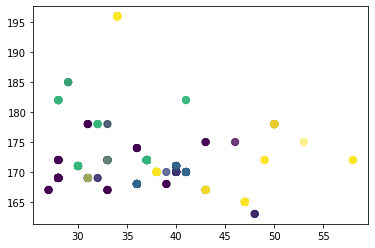

Age vs Body mass index


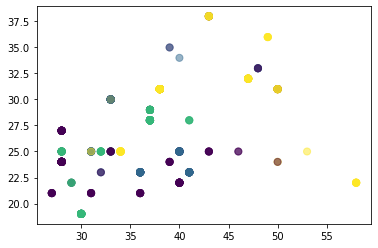

Age vs Absenteeism time in hours


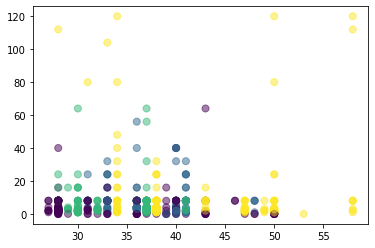

Age vs Clusters


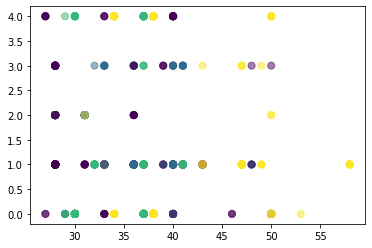

Age vs cluster


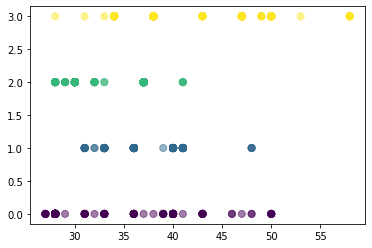

Work load Average/day  vs Reason for absence


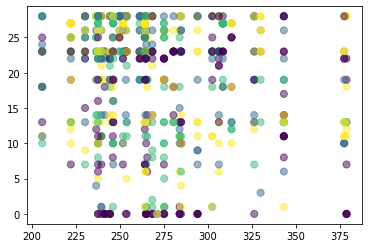

Work load Average/day  vs Month of absence


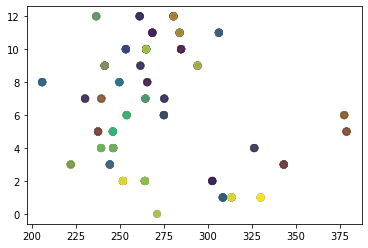

Work load Average/day  vs Day of the week


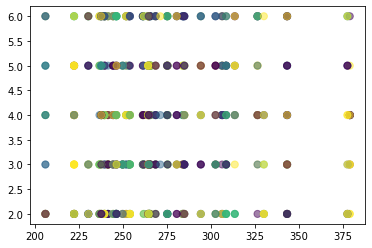

Work load Average/day  vs Seasons


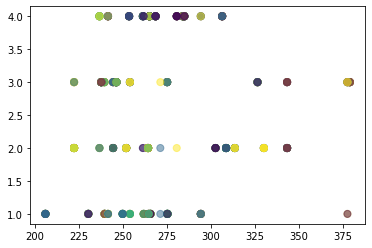

Work load Average/day  vs Transportation expense


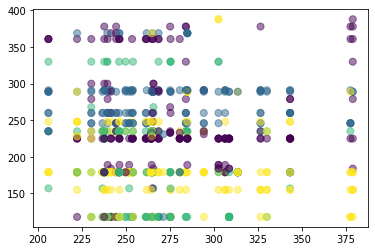

Work load Average/day  vs Distance from Residence to Work


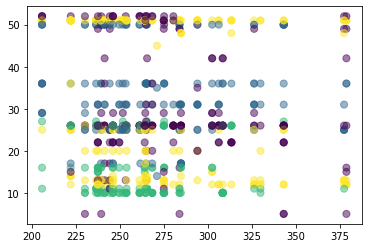

Work load Average/day  vs Service time


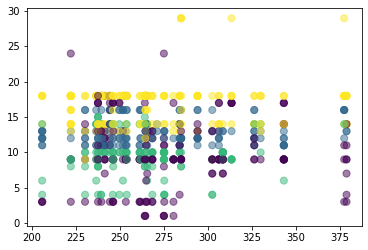

Work load Average/day  vs Age


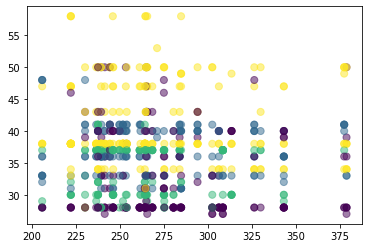

Work load Average/day  vs Hit target


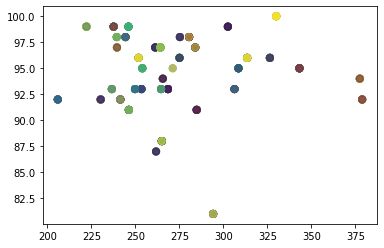

Work load Average/day  vs Disciplinary failure


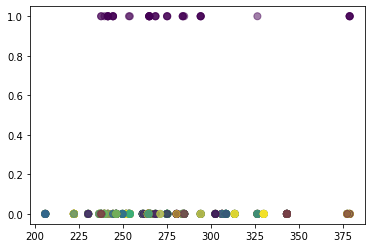

Work load Average/day  vs Education


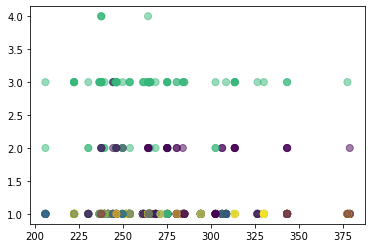

Work load Average/day  vs Son


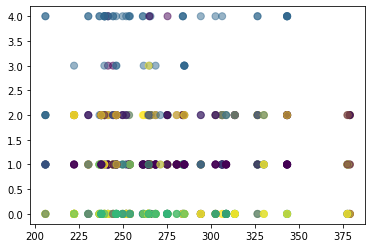

Work load Average/day  vs Social drinker


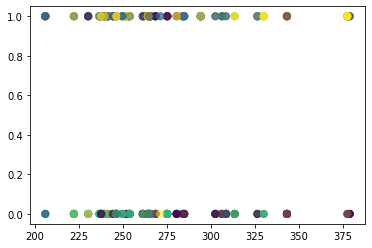

Work load Average/day  vs Social smoker


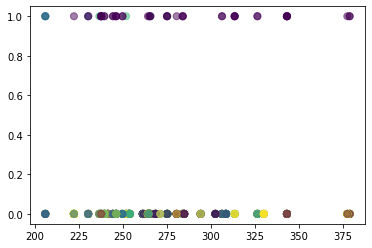

Work load Average/day  vs Pet


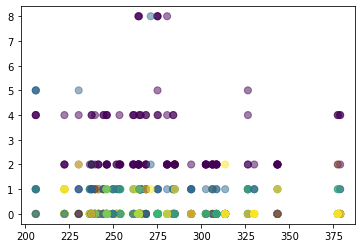

Work load Average/day  vs Weight


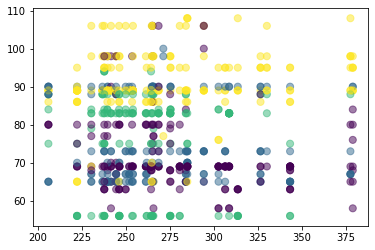

Work load Average/day  vs Height


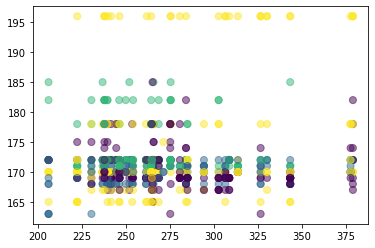

Work load Average/day  vs Body mass index


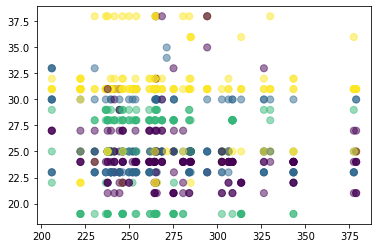

Work load Average/day  vs Absenteeism time in hours


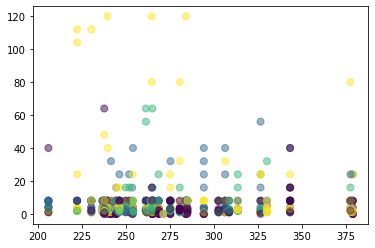

Work load Average/day  vs Clusters


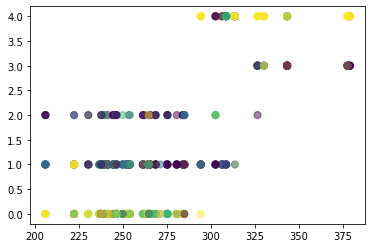

Work load Average/day  vs cluster


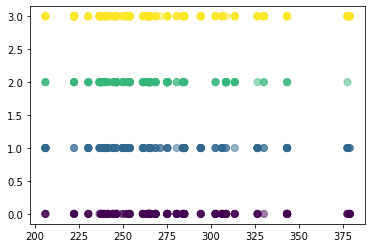

Hit target vs Reason for absence


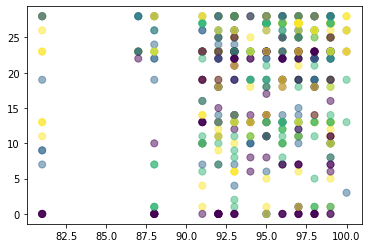

Hit target vs Month of absence


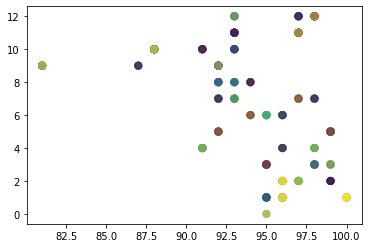

Hit target vs Day of the week


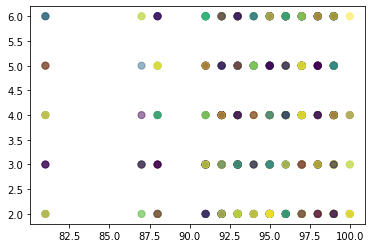

Hit target vs Seasons


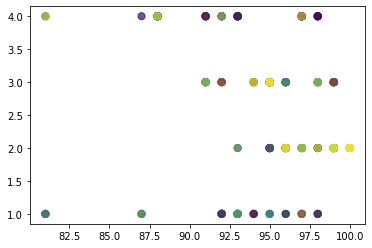

Hit target vs Transportation expense


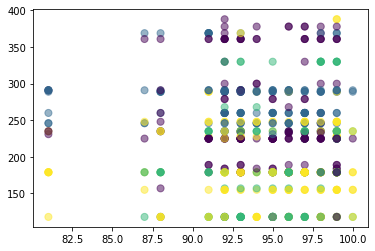

Hit target vs Distance from Residence to Work


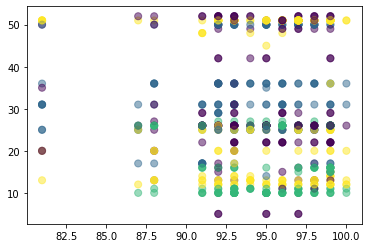

Hit target vs Service time


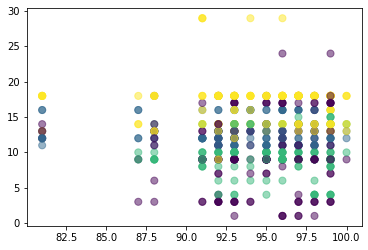

Hit target vs Age


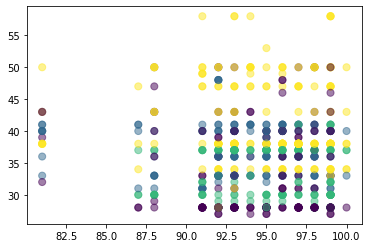

Hit target vs Work load Average/day 


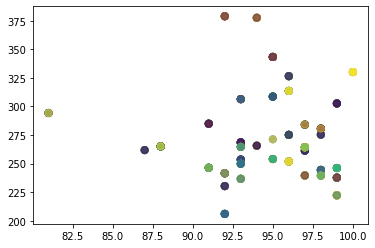

Hit target vs Disciplinary failure


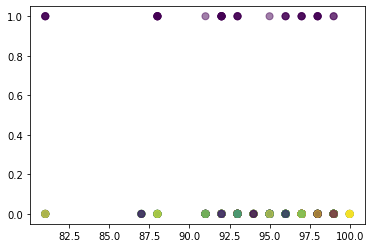

Hit target vs Education


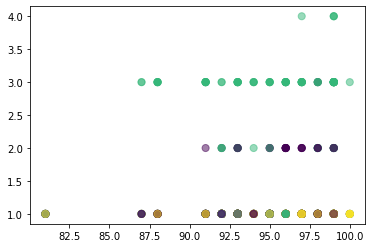

Hit target vs Son


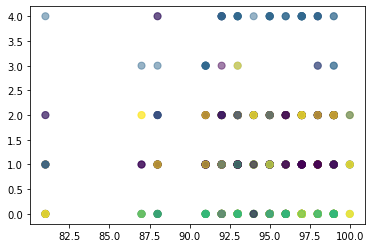

Hit target vs Social drinker


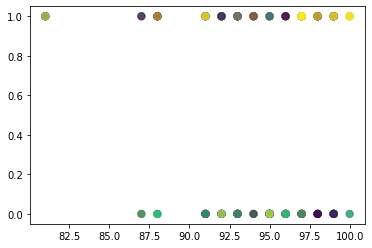

Hit target vs Social smoker


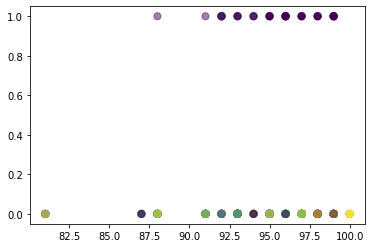

Hit target vs Pet


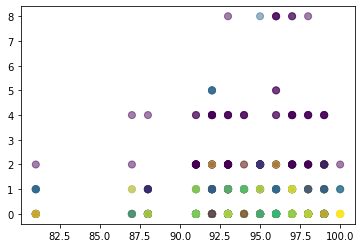

Hit target vs Weight


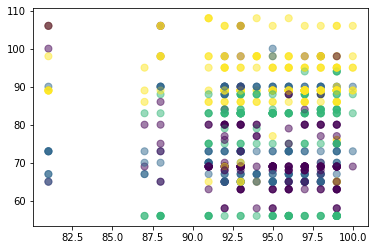

Hit target vs Height


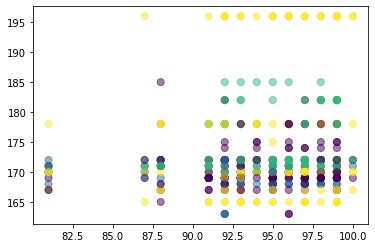

Hit target vs Body mass index


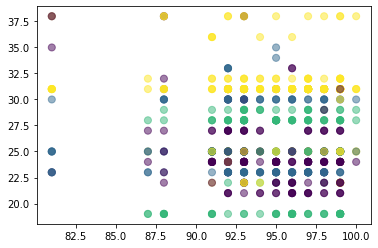

Hit target vs Absenteeism time in hours


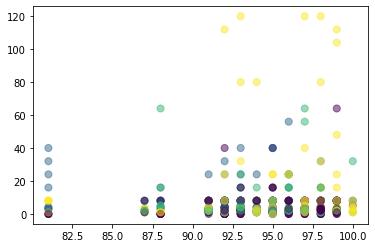

Hit target vs Clusters


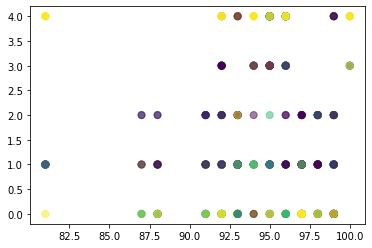

Hit target vs cluster


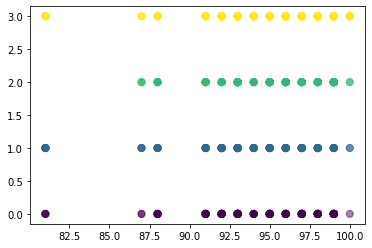

Disciplinary failure vs Reason for absence


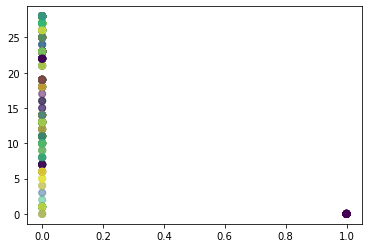

Disciplinary failure vs Month of absence


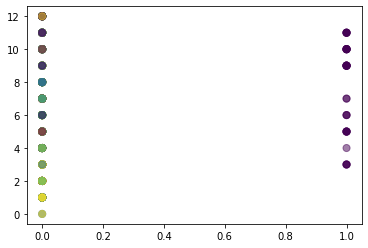

Disciplinary failure vs Day of the week


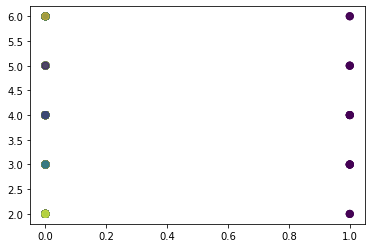

Disciplinary failure vs Seasons


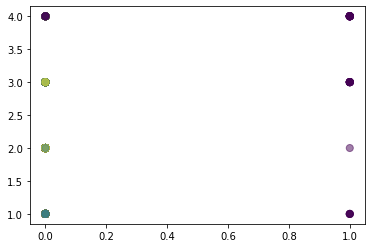

Disciplinary failure vs Transportation expense


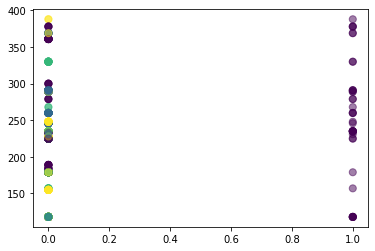

Disciplinary failure vs Distance from Residence to Work


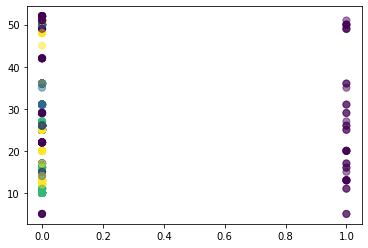

Disciplinary failure vs Service time


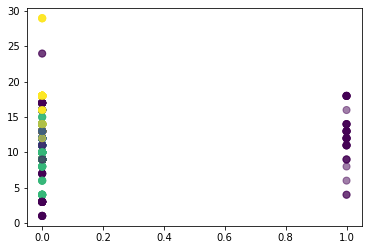

Disciplinary failure vs Age


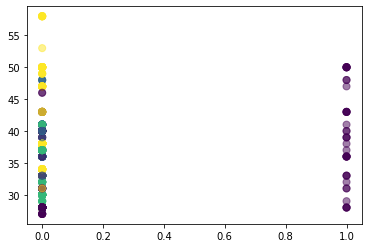

Disciplinary failure vs Work load Average/day 


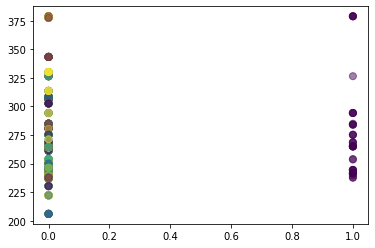

Disciplinary failure vs Hit target


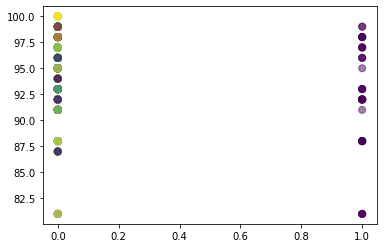

Disciplinary failure vs Education


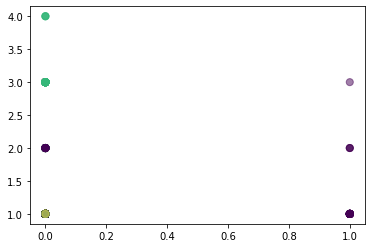

Disciplinary failure vs Son


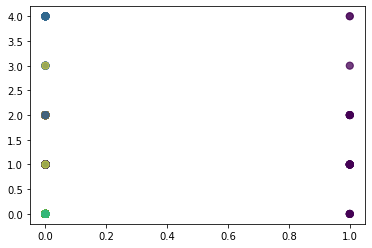

Disciplinary failure vs Social drinker


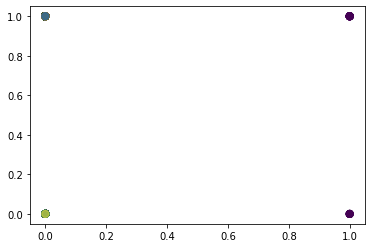

Disciplinary failure vs Social smoker


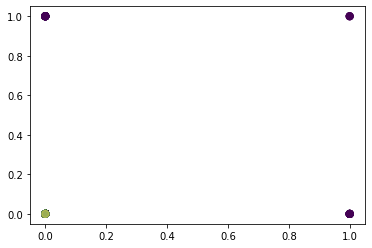

Disciplinary failure vs Pet


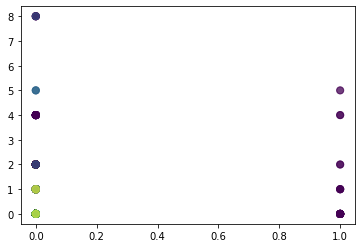

Disciplinary failure vs Weight


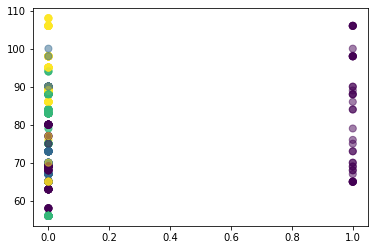

Disciplinary failure vs Height


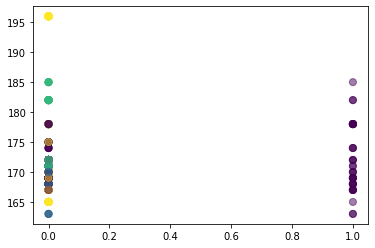

Disciplinary failure vs Body mass index


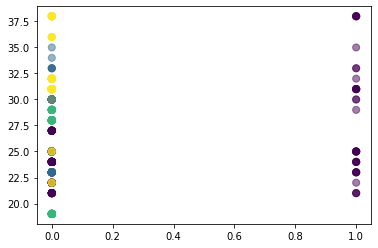

Disciplinary failure vs Absenteeism time in hours


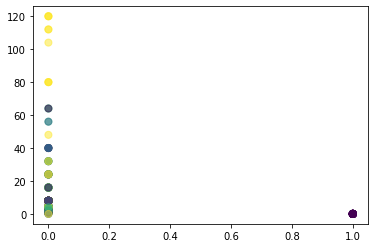

Disciplinary failure vs Clusters


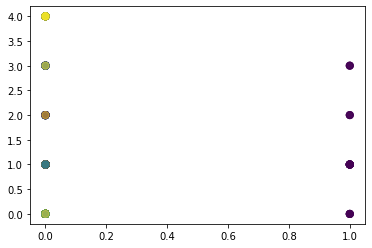

Disciplinary failure vs cluster


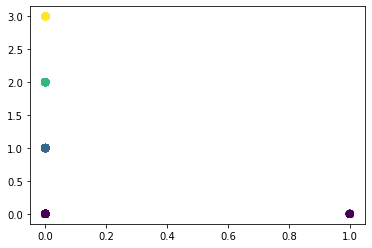

Education vs Reason for absence


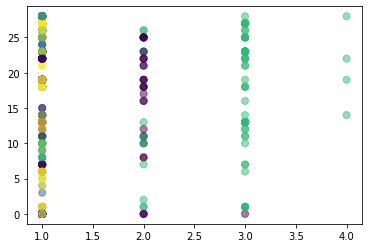

Education vs Month of absence


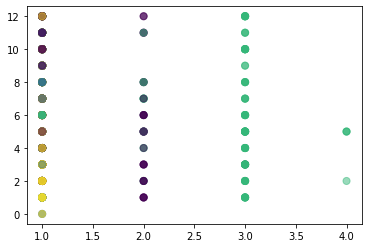

Education vs Day of the week


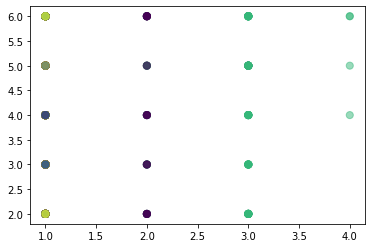

Education vs Seasons


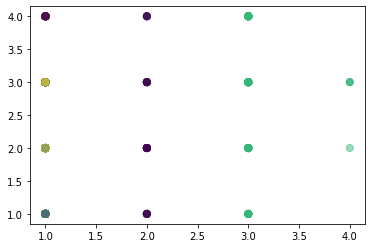

Education vs Transportation expense


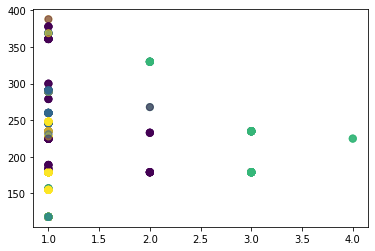

Education vs Distance from Residence to Work


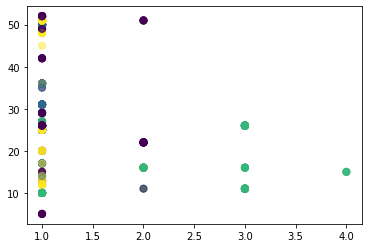

Education vs Service time


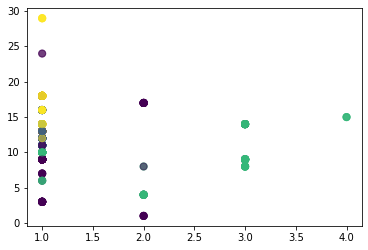

Education vs Age


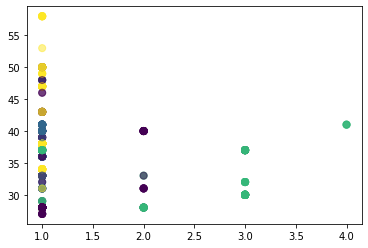

Education vs Work load Average/day 


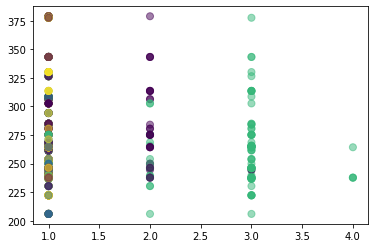

Education vs Hit target


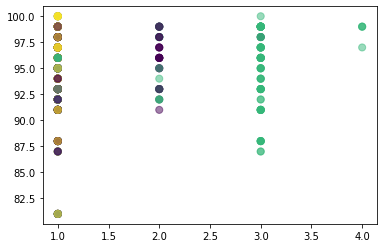

Education vs Disciplinary failure


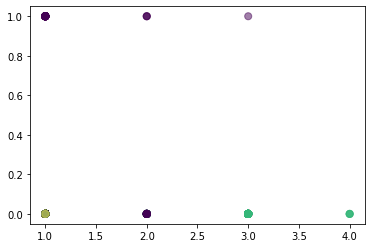

Education vs Son


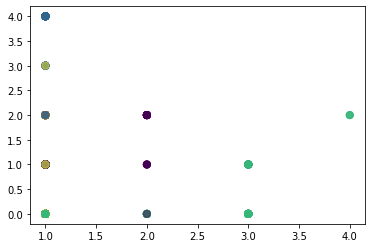

Education vs Social drinker


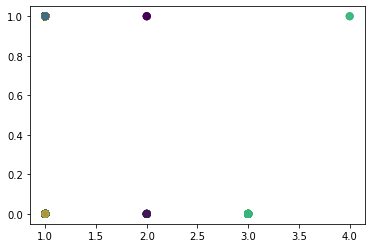

Education vs Social smoker


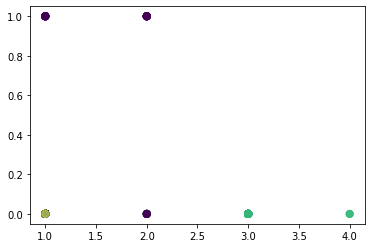

Education vs Pet


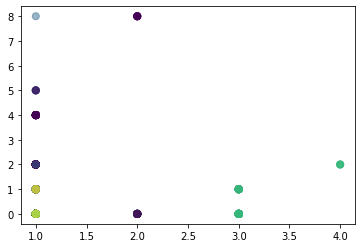

Education vs Weight


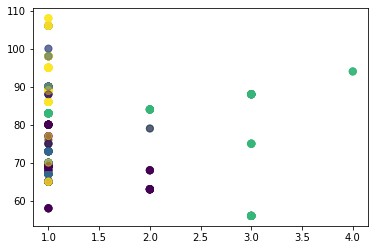

Education vs Height


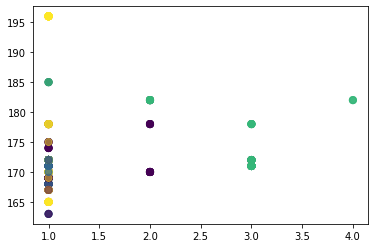

Education vs Body mass index


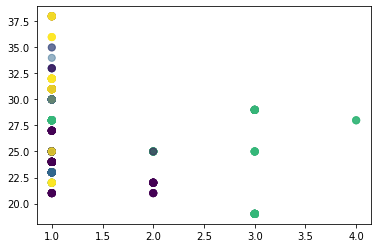

Education vs Absenteeism time in hours


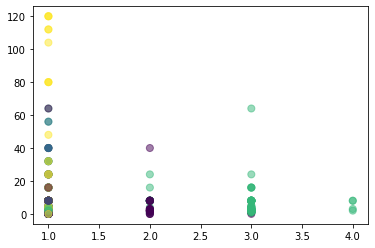

Education vs Clusters


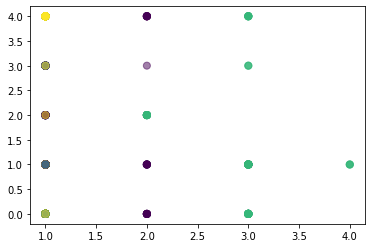

Education vs cluster


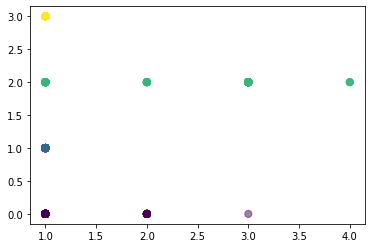

Son vs Reason for absence


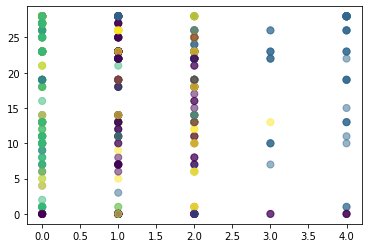

Son vs Month of absence


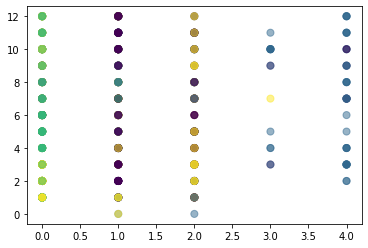

Son vs Day of the week


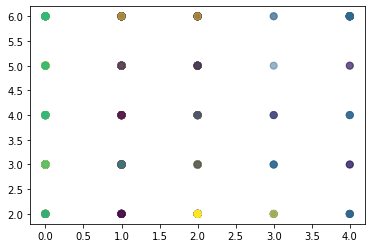

Son vs Seasons


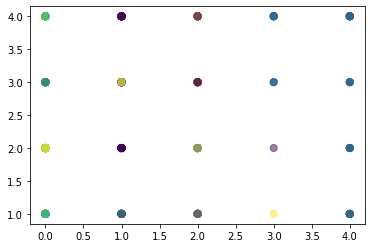

Son vs Transportation expense


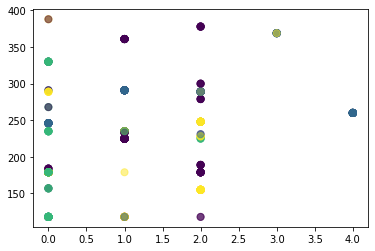

Son vs Distance from Residence to Work


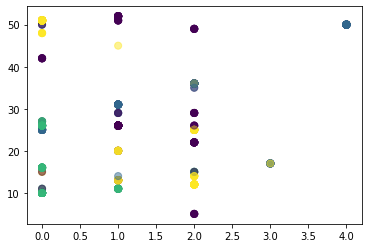

Son vs Service time


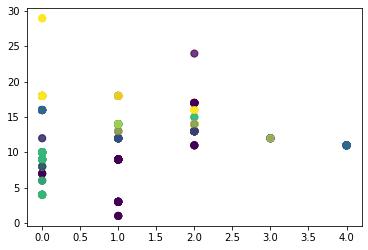

Son vs Age


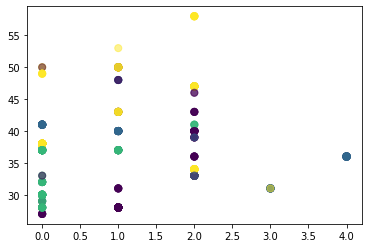

Son vs Work load Average/day 


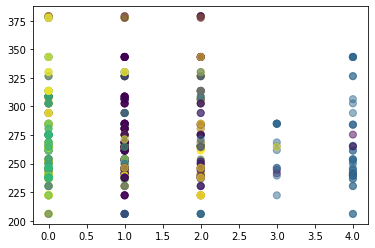

Son vs Hit target


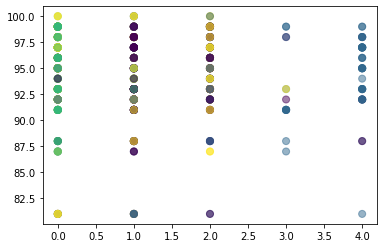

Son vs Disciplinary failure


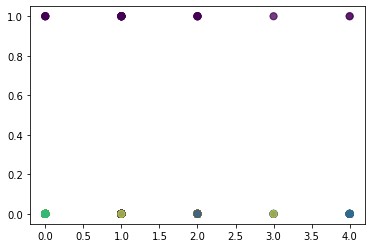

Son vs Education


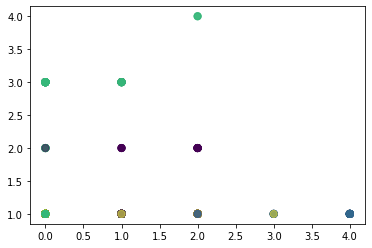

Son vs Social drinker


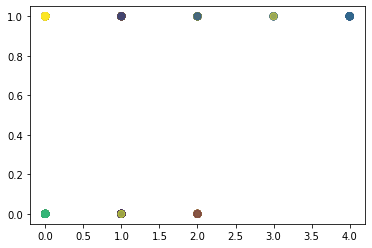

Son vs Social smoker


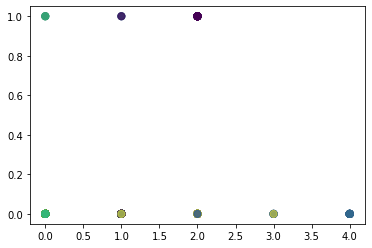

Son vs Pet


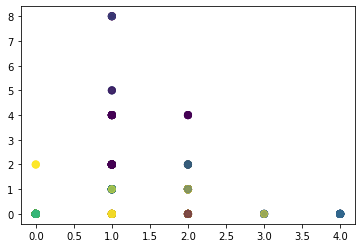

Son vs Weight


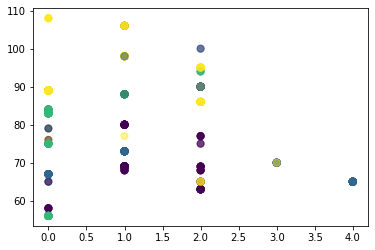

Son vs Height


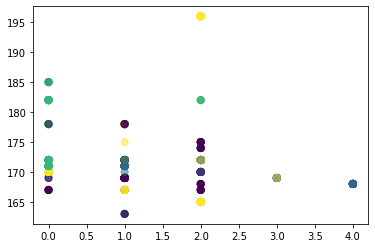

Son vs Body mass index


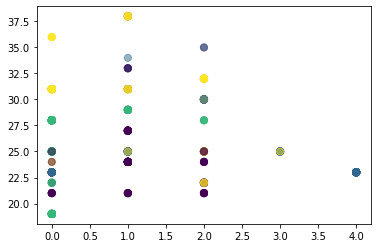

Son vs Absenteeism time in hours


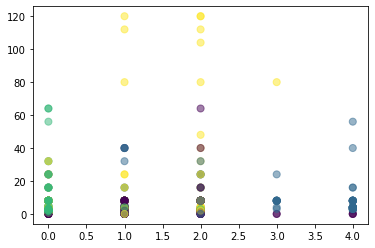

Son vs Clusters


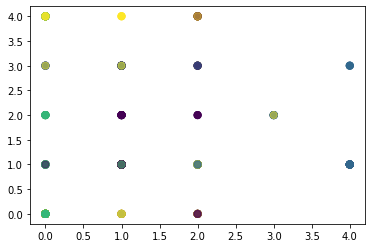

Son vs cluster


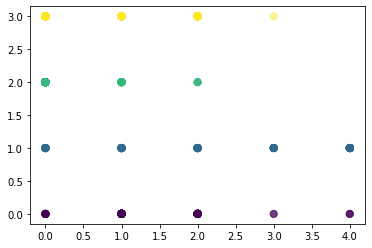

Social drinker vs Reason for absence


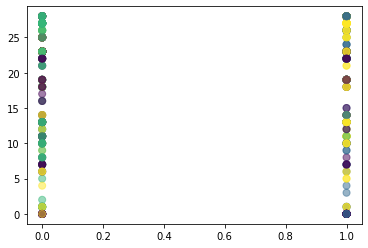

Social drinker vs Month of absence


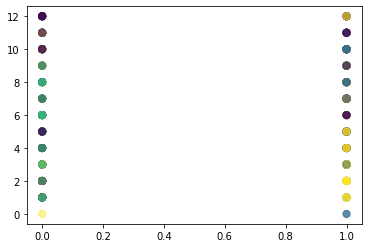

Social drinker vs Day of the week


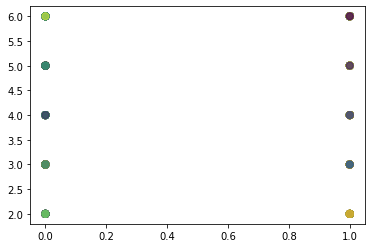

Social drinker vs Seasons


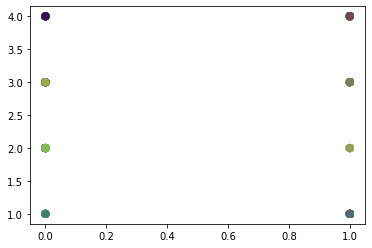

Social drinker vs Transportation expense


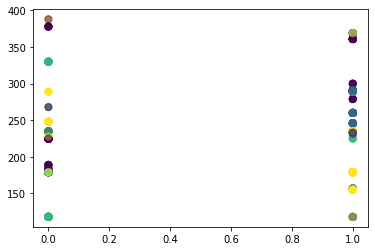

Social drinker vs Distance from Residence to Work


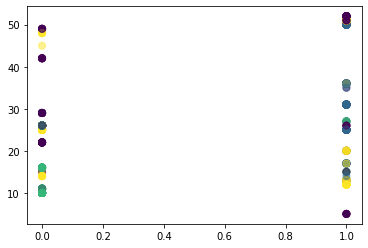

Social drinker vs Service time


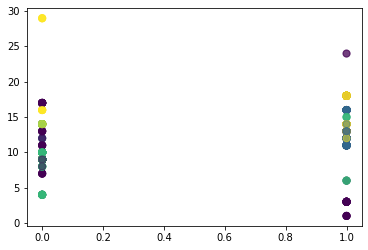

Social drinker vs Age


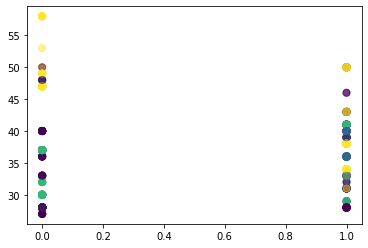

Social drinker vs Work load Average/day 


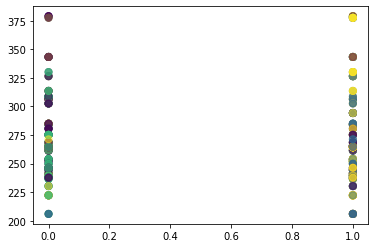

Social drinker vs Hit target


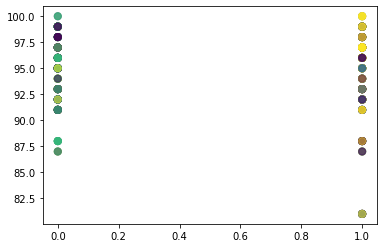

Social drinker vs Disciplinary failure


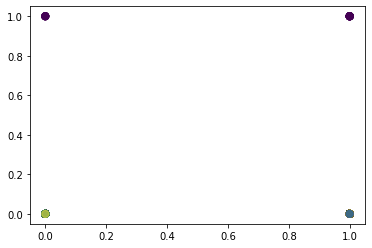

Social drinker vs Education


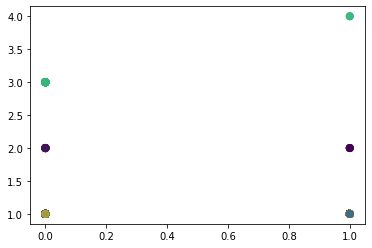

Social drinker vs Son


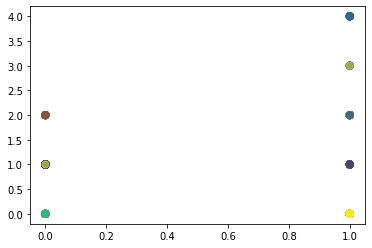

Social drinker vs Social smoker


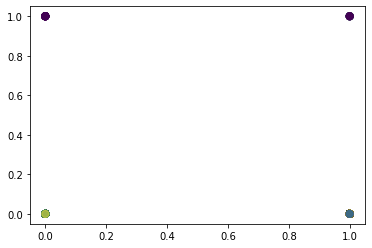

Social drinker vs Pet


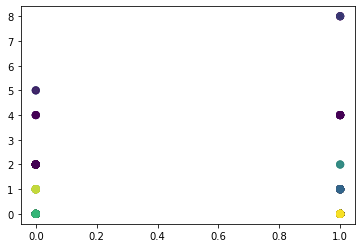

Social drinker vs Weight


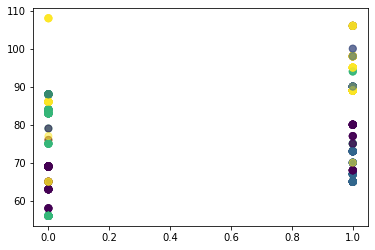

Social drinker vs Height


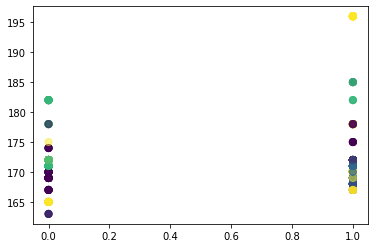

Social drinker vs Body mass index


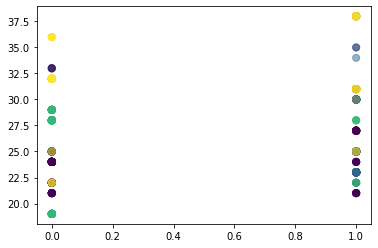

Social drinker vs Absenteeism time in hours


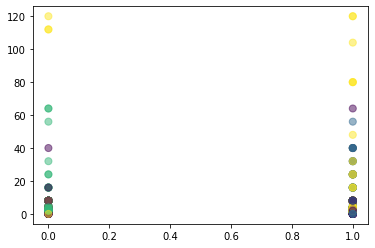

Social drinker vs Clusters


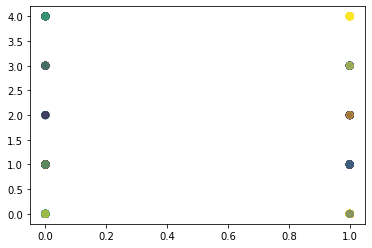

Social drinker vs cluster


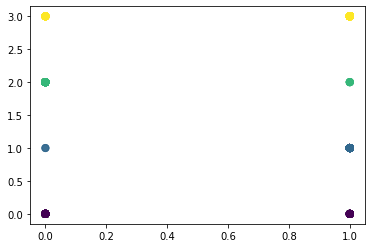

Social smoker vs Reason for absence


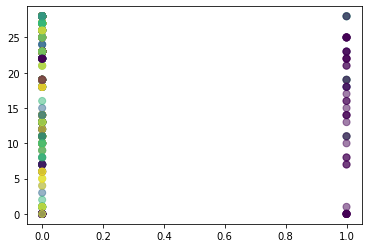

Social smoker vs Month of absence


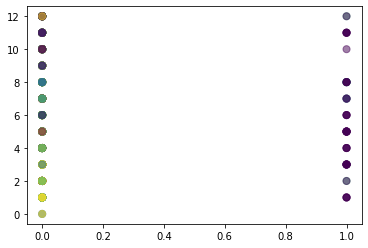

Social smoker vs Day of the week


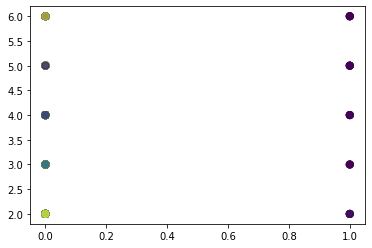

Social smoker vs Seasons


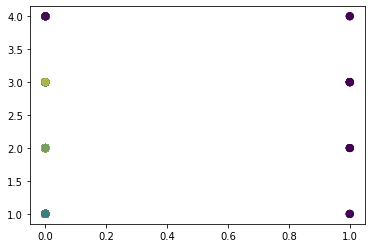

Social smoker vs Transportation expense


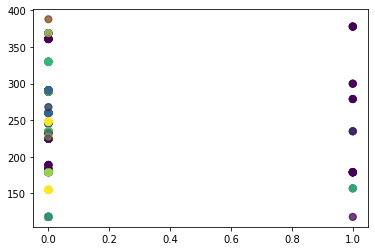

Social smoker vs Distance from Residence to Work


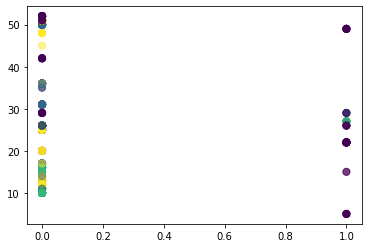

Social smoker vs Service time


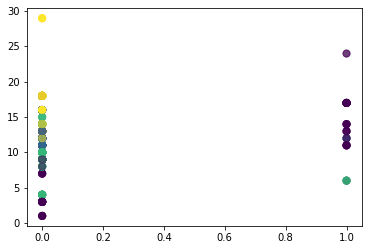

Social smoker vs Age


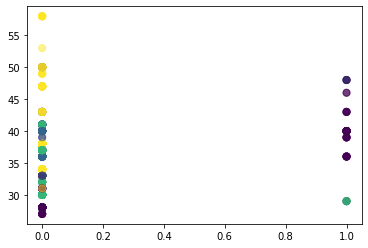

Social smoker vs Work load Average/day 


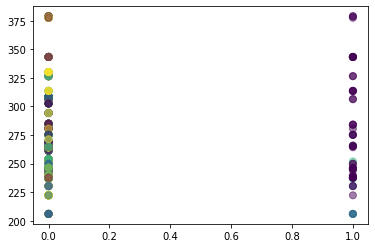

Social smoker vs Hit target


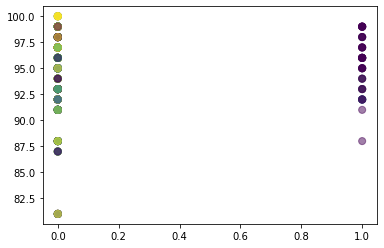

Social smoker vs Disciplinary failure


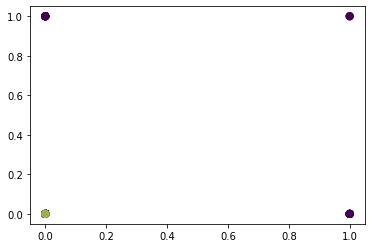

Social smoker vs Education


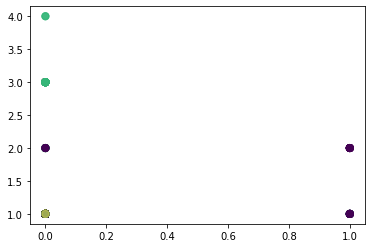

Social smoker vs Son


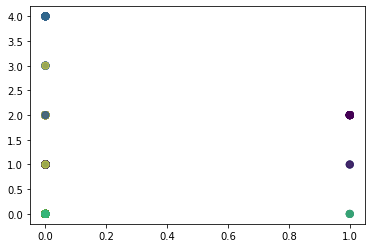

Social smoker vs Social drinker


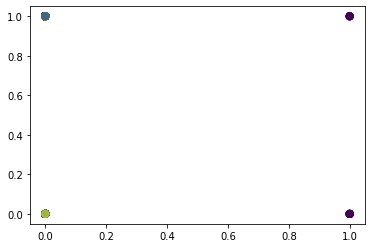

Social smoker vs Pet


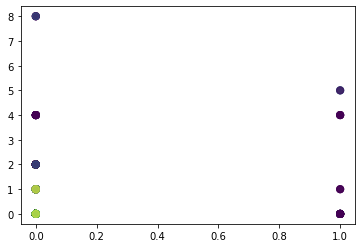

Social smoker vs Weight


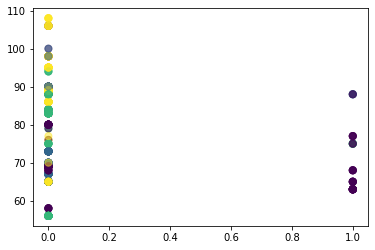

Social smoker vs Height


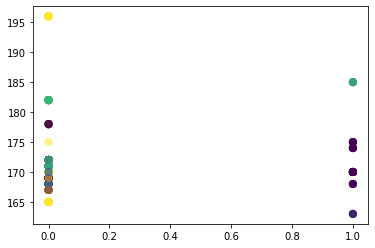

Social smoker vs Body mass index


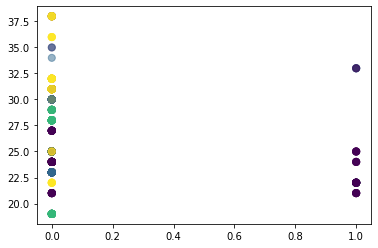

Social smoker vs Absenteeism time in hours


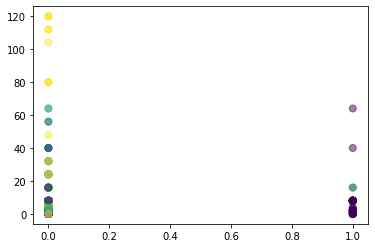

Social smoker vs Clusters


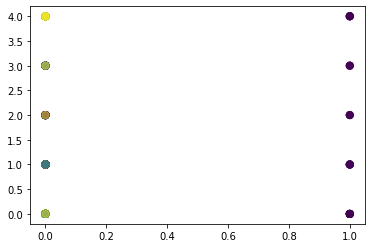

Social smoker vs cluster


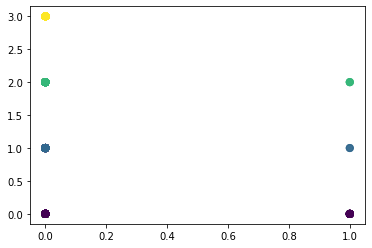

Pet vs Reason for absence


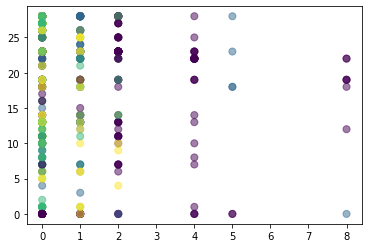

Pet vs Month of absence


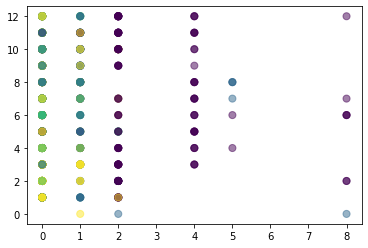

Pet vs Day of the week


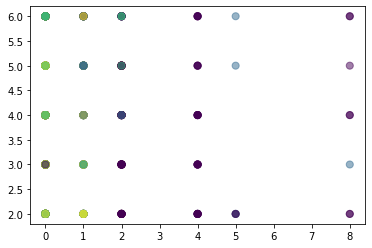

Pet vs Seasons


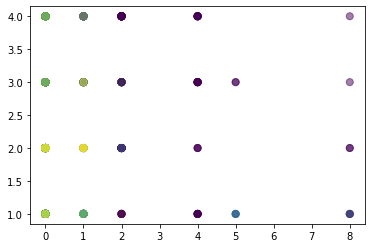

Pet vs Transportation expense


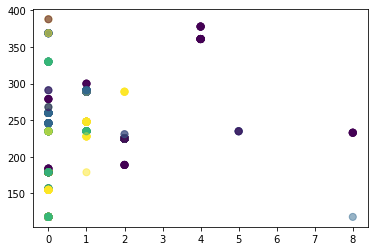

Pet vs Distance from Residence to Work


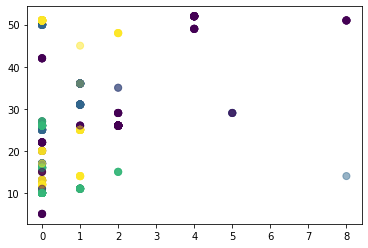

Pet vs Service time


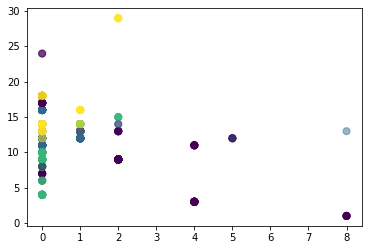

Pet vs Age


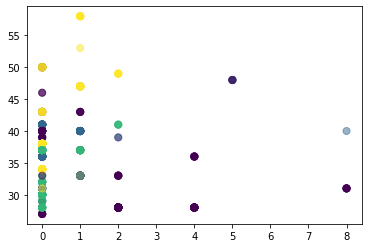

Pet vs Work load Average/day 


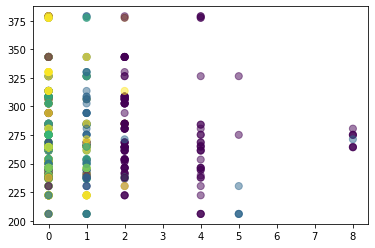

Pet vs Hit target


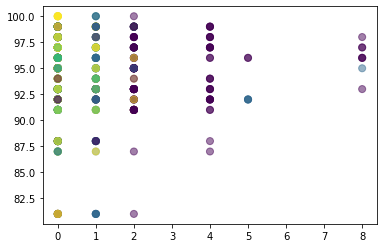

Pet vs Disciplinary failure


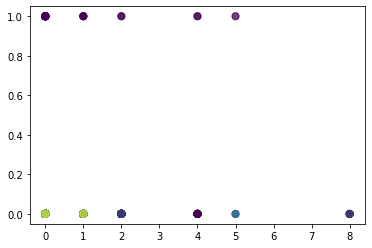

Pet vs Education


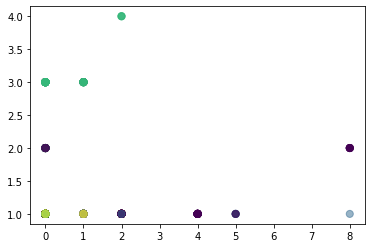

Pet vs Son


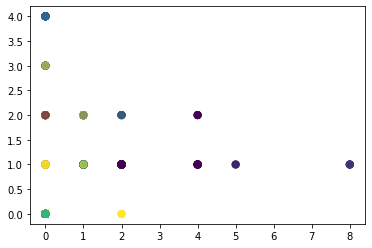

Pet vs Social drinker


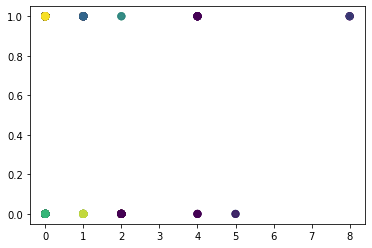

Pet vs Social smoker


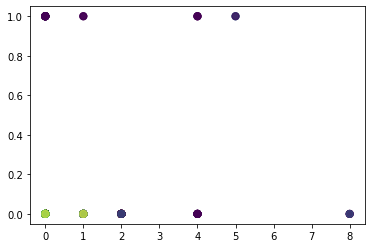

Pet vs Weight


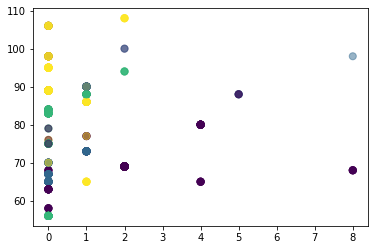

Pet vs Height


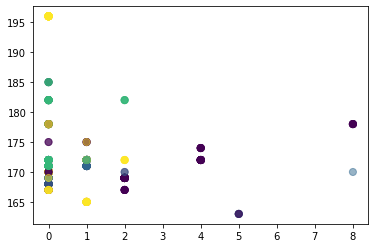

Pet vs Body mass index


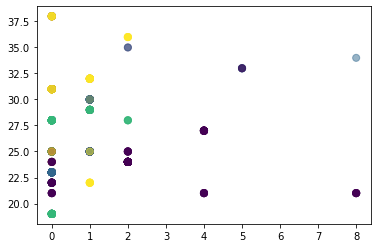

Pet vs Absenteeism time in hours


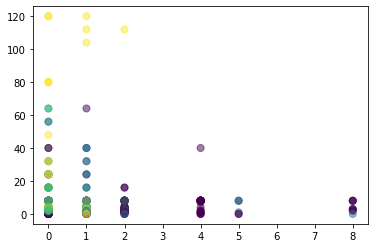

Pet vs Clusters


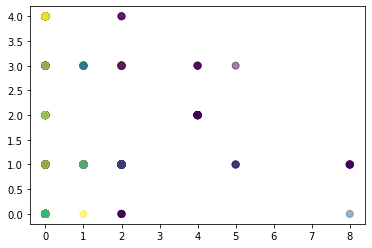

Pet vs cluster


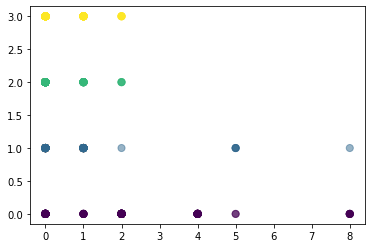

Weight vs Reason for absence


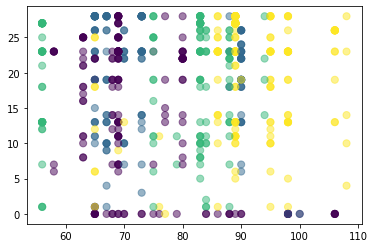

Weight vs Month of absence


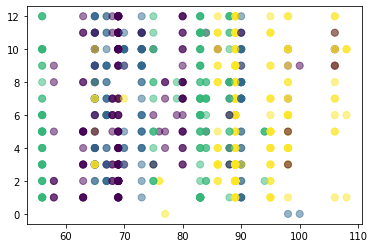

Weight vs Day of the week


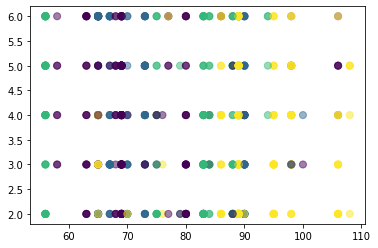

Weight vs Seasons


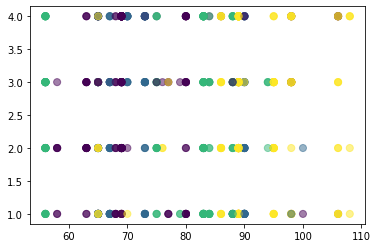

Weight vs Transportation expense


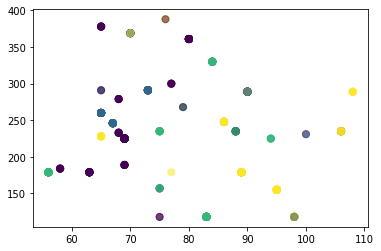

Weight vs Distance from Residence to Work


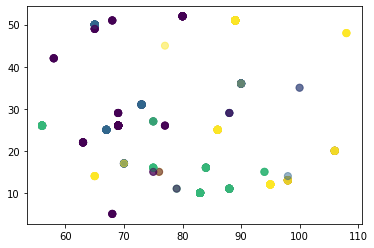

Weight vs Service time


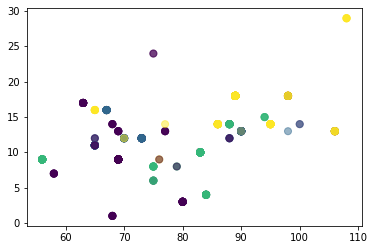

Weight vs Age


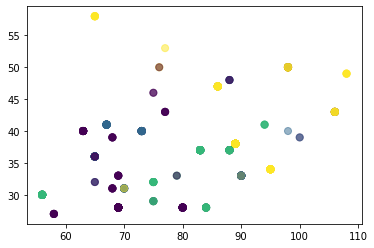

Weight vs Work load Average/day 


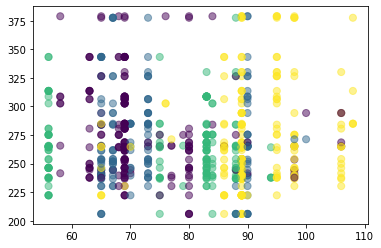

Weight vs Hit target


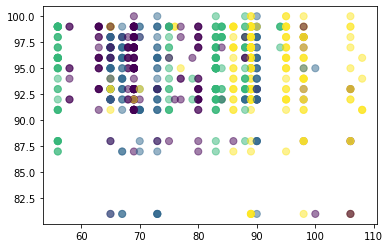

Weight vs Disciplinary failure


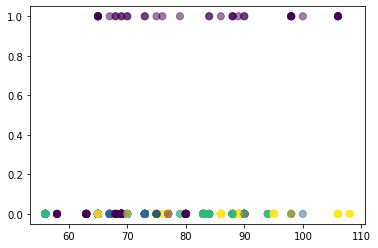

Weight vs Education


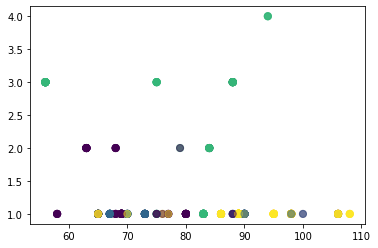

Weight vs Son


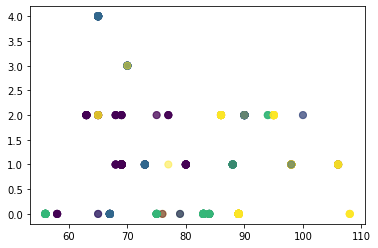

Weight vs Social drinker


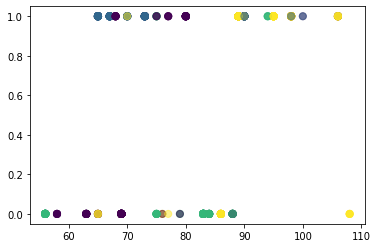

Weight vs Social smoker


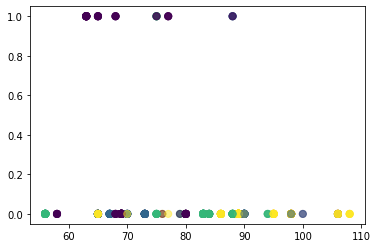

Weight vs Pet


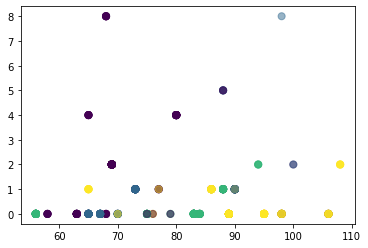

Weight vs Height


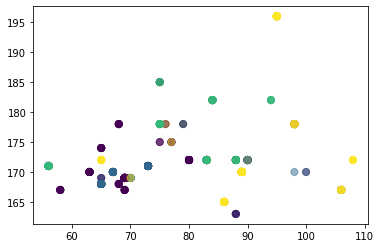

Weight vs Body mass index


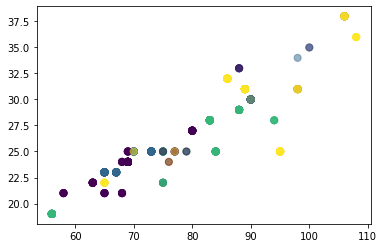

Weight vs Absenteeism time in hours


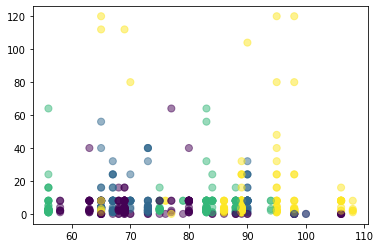

Weight vs Clusters


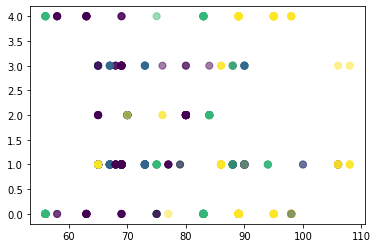

Weight vs cluster


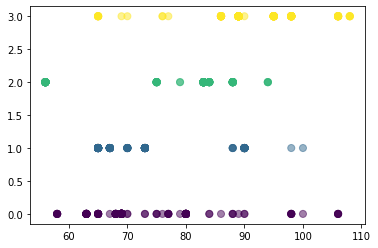

Height vs Reason for absence


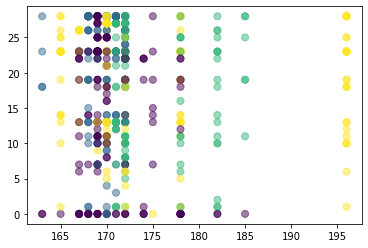

Height vs Month of absence


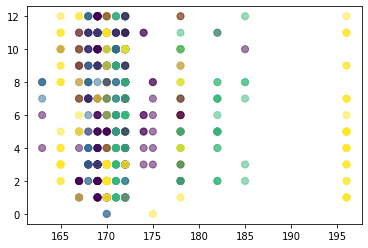

Height vs Day of the week


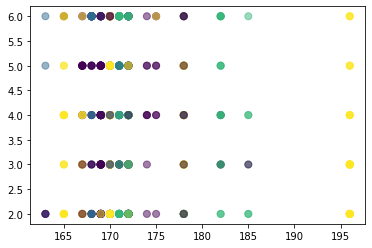

Height vs Seasons


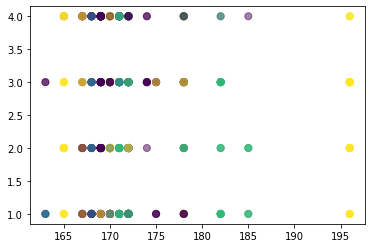

Height vs Transportation expense


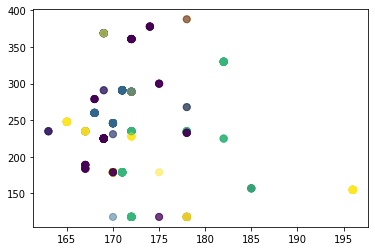

Height vs Distance from Residence to Work


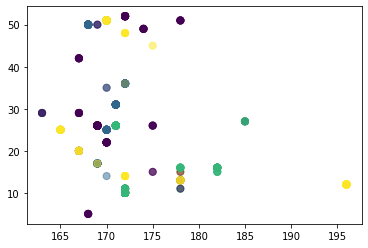

Height vs Service time


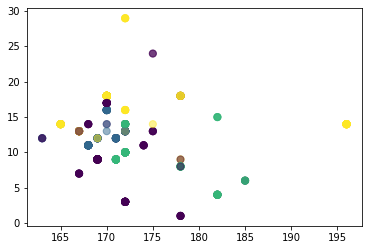

Height vs Age


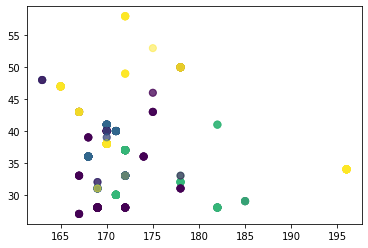

Height vs Work load Average/day 


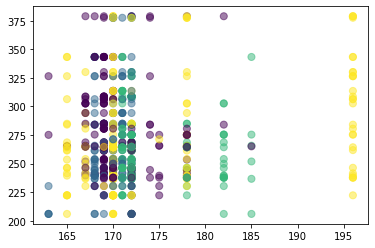

Height vs Hit target


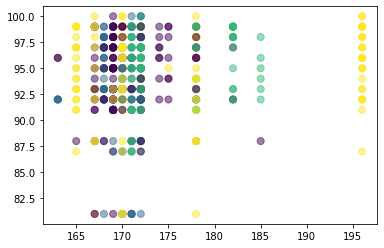

Height vs Disciplinary failure


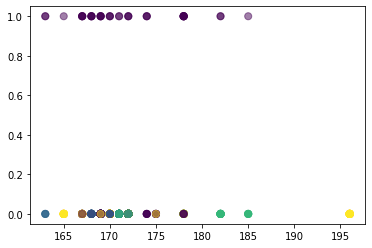

Height vs Education


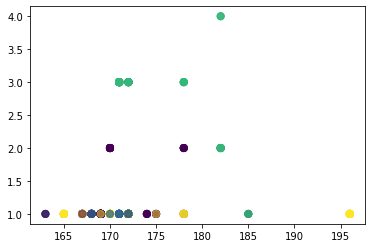

Height vs Son


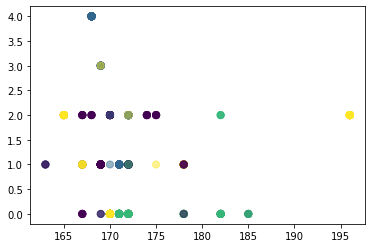

Height vs Social drinker


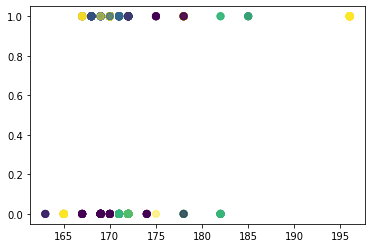

Height vs Social smoker


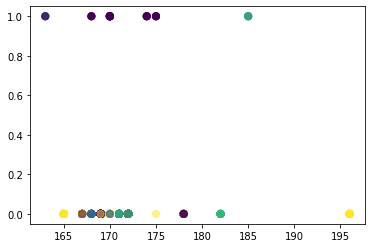

Height vs Pet


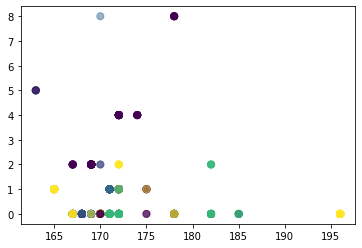

Height vs Weight


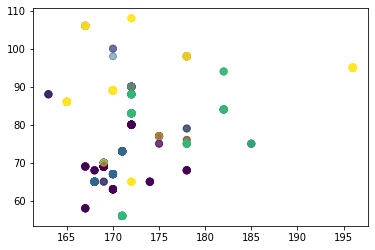

Height vs Body mass index


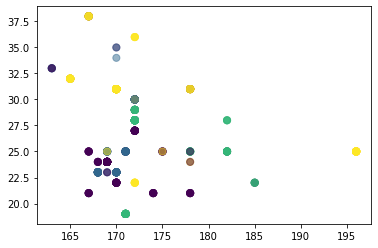

Height vs Absenteeism time in hours


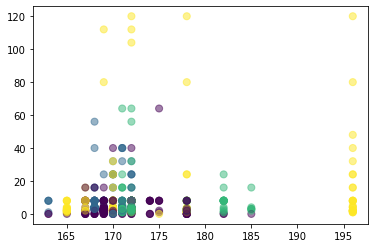

Height vs Clusters


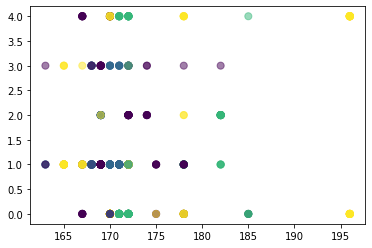

Height vs cluster


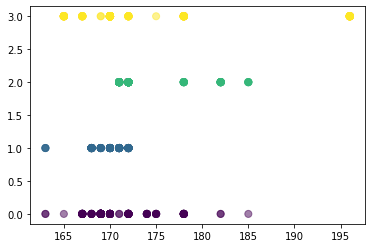

Body mass index vs Reason for absence


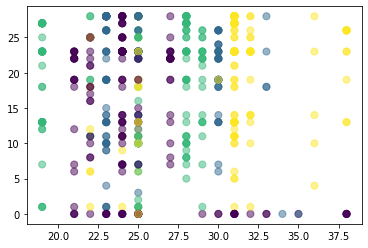

Body mass index vs Month of absence


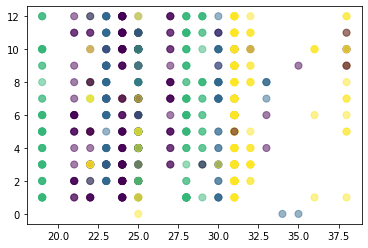

Body mass index vs Day of the week


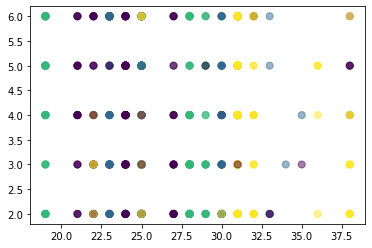

Body mass index vs Seasons


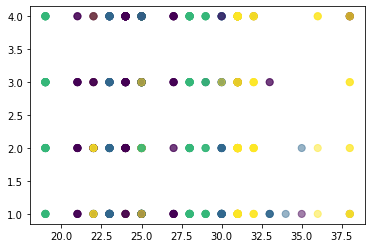

Body mass index vs Transportation expense


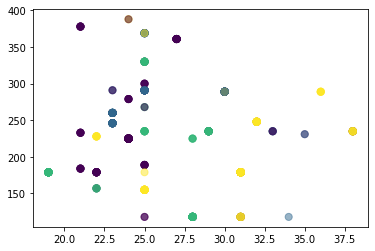

Body mass index vs Distance from Residence to Work


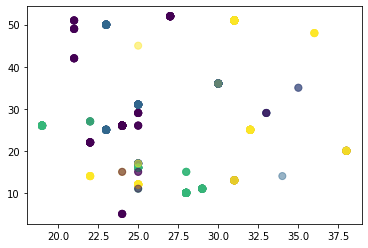

Body mass index vs Service time


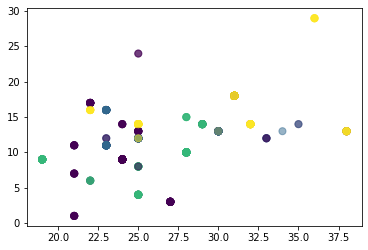

Body mass index vs Age


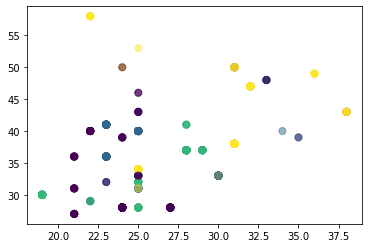

Body mass index vs Work load Average/day 


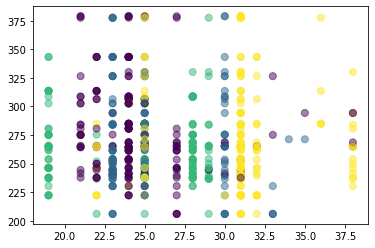

Body mass index vs Hit target


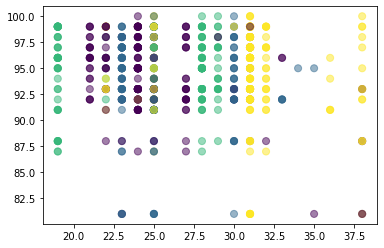

Body mass index vs Disciplinary failure


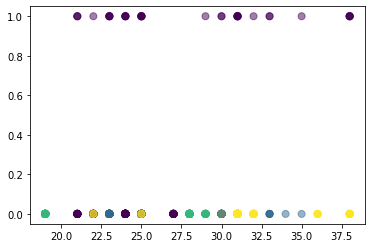

Body mass index vs Education


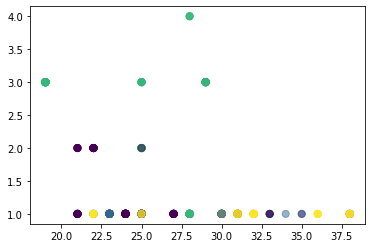

Body mass index vs Son


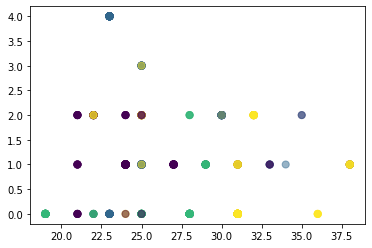

Body mass index vs Social drinker


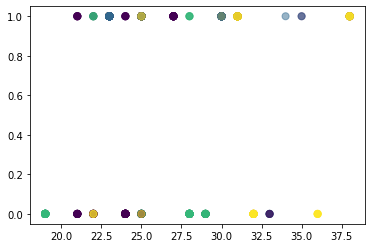

Body mass index vs Social smoker


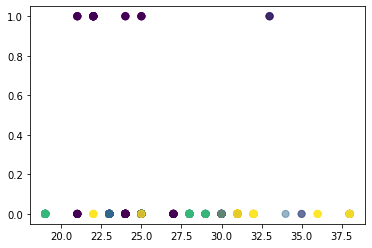

Body mass index vs Pet


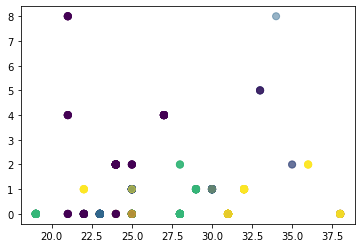

Body mass index vs Weight


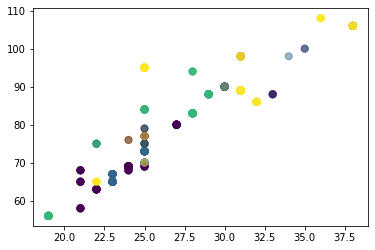

Body mass index vs Height


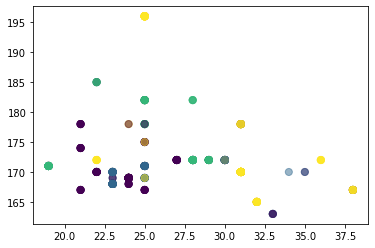

Body mass index vs Absenteeism time in hours


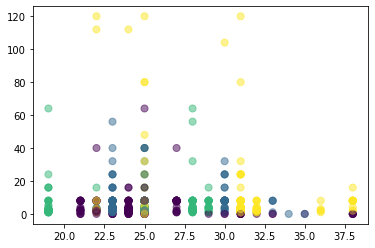

Body mass index vs Clusters


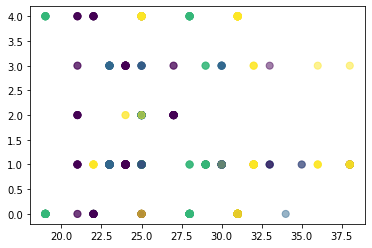

Body mass index vs cluster


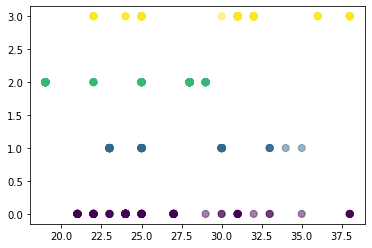

Absenteeism time in hours vs Reason for absence


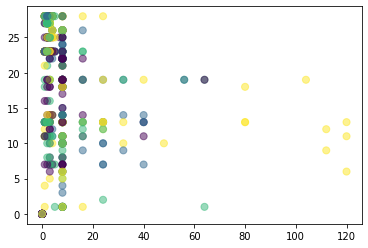

Absenteeism time in hours vs Month of absence


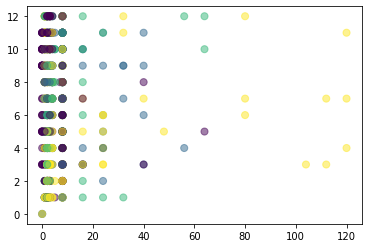

Absenteeism time in hours vs Day of the week


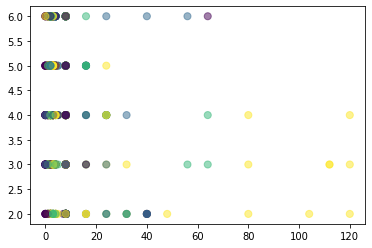

Absenteeism time in hours vs Seasons


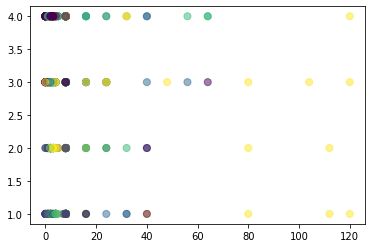

Absenteeism time in hours vs Transportation expense


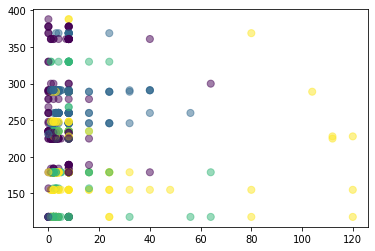

Absenteeism time in hours vs Distance from Residence to Work


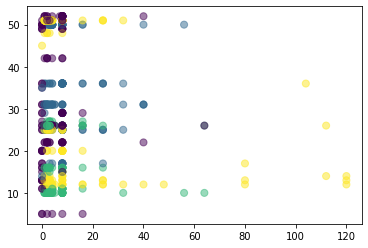

Absenteeism time in hours vs Service time


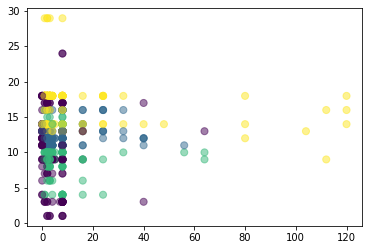

Absenteeism time in hours vs Age


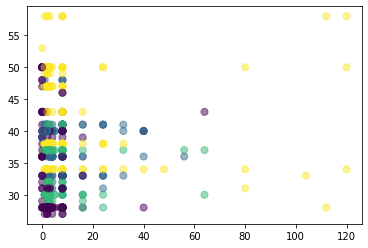

Absenteeism time in hours vs Work load Average/day 


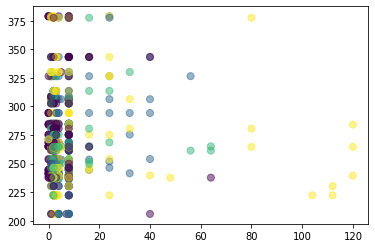

Absenteeism time in hours vs Hit target


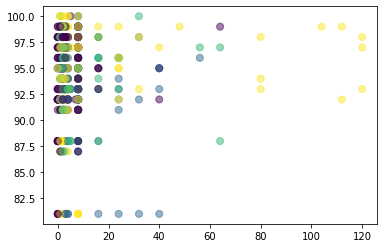

Absenteeism time in hours vs Disciplinary failure


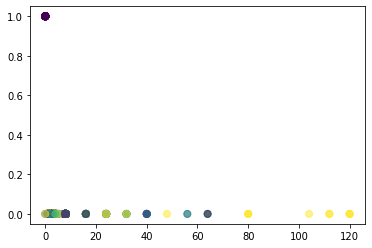

Absenteeism time in hours vs Education


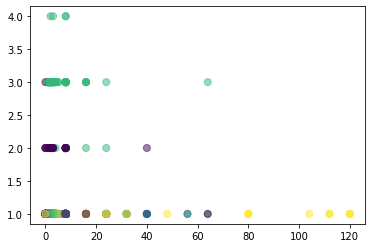

Absenteeism time in hours vs Son


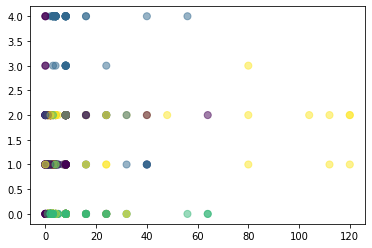

Absenteeism time in hours vs Social drinker


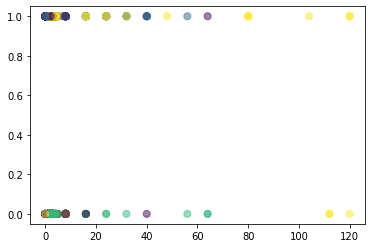

Absenteeism time in hours vs Social smoker


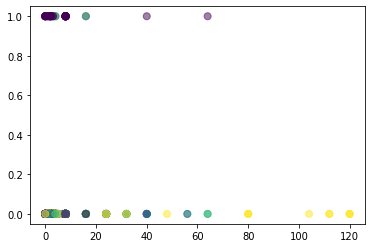

Absenteeism time in hours vs Pet


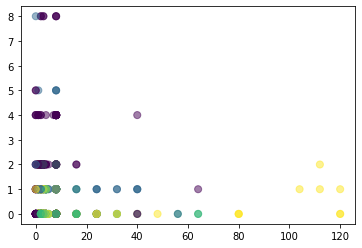

Absenteeism time in hours vs Weight


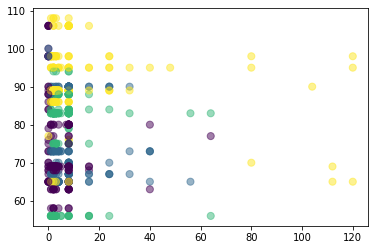

Absenteeism time in hours vs Height


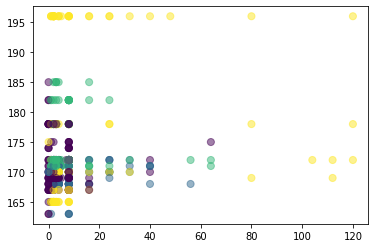

Absenteeism time in hours vs Body mass index


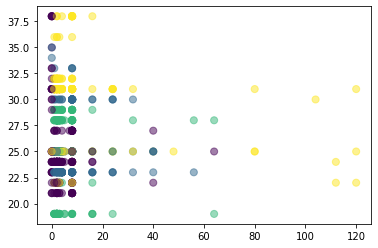

Absenteeism time in hours vs Clusters


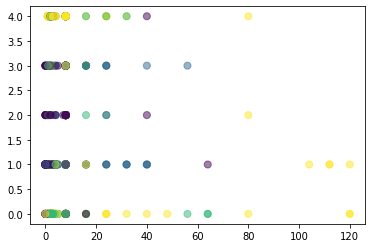

Absenteeism time in hours vs cluster


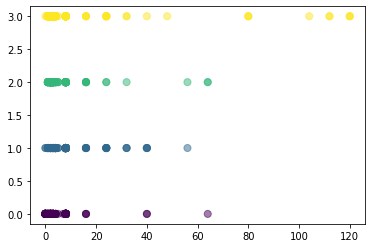

Clusters vs Reason for absence


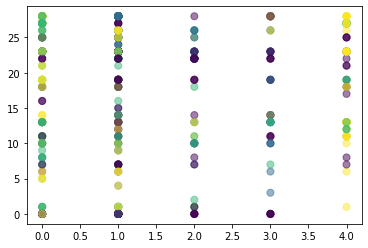

Clusters vs Month of absence


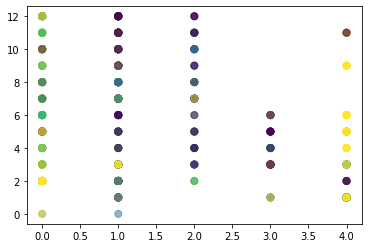

Clusters vs Day of the week


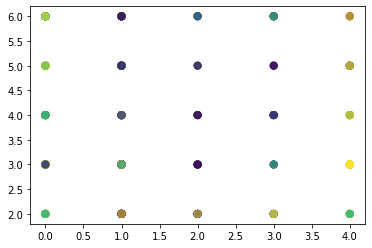

Clusters vs Seasons


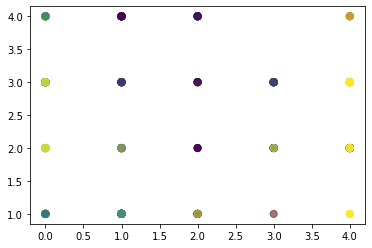

Clusters vs Transportation expense


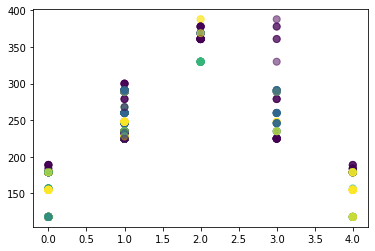

Clusters vs Distance from Residence to Work


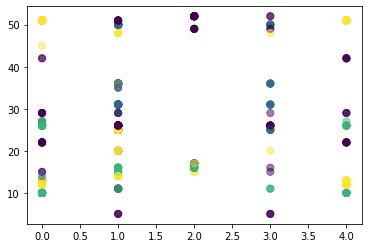

Clusters vs Service time


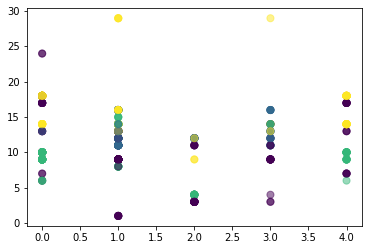

Clusters vs Age


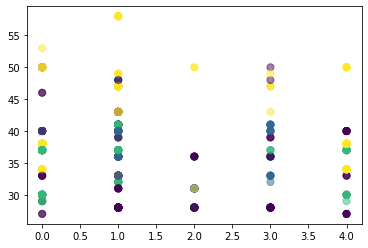

Clusters vs Work load Average/day 


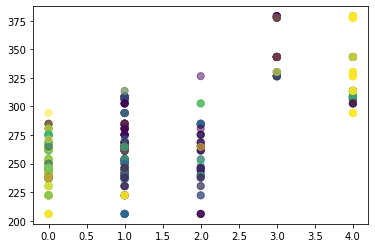

Clusters vs Hit target


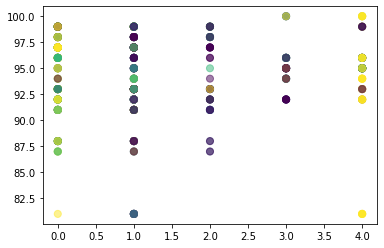

Clusters vs Disciplinary failure


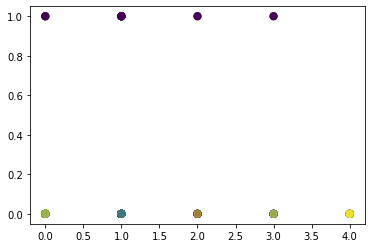

Clusters vs Education


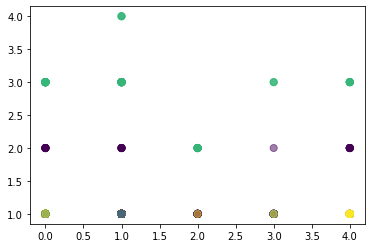

Clusters vs Son


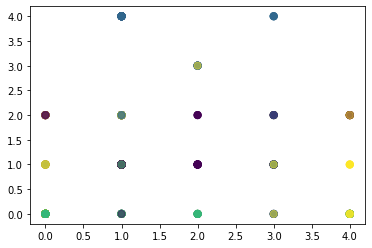

Clusters vs Social drinker


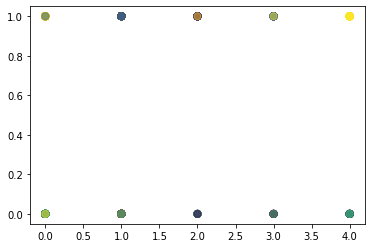

Clusters vs Social smoker


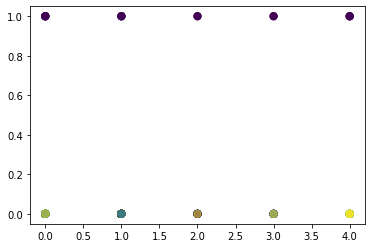

Clusters vs Pet


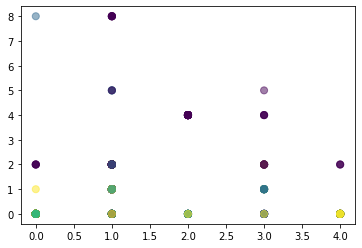

Clusters vs Weight


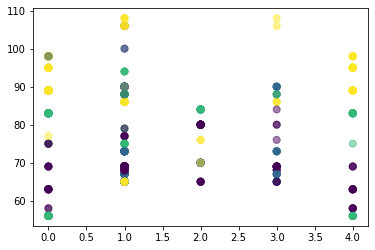

Clusters vs Height


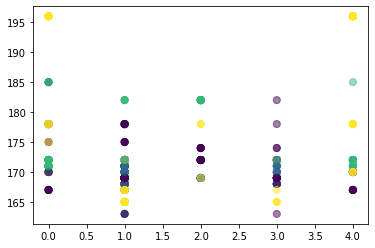

Clusters vs Body mass index


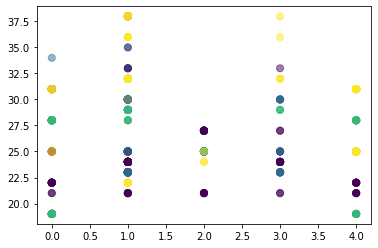

Clusters vs Absenteeism time in hours


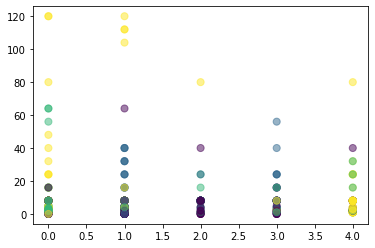

Clusters vs cluster


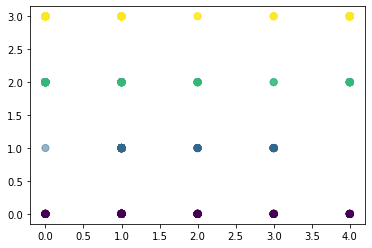

cluster vs Reason for absence


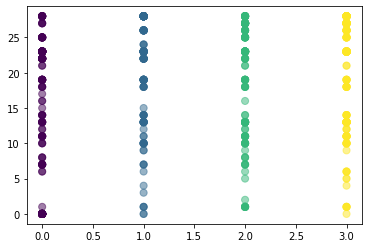

cluster vs Month of absence


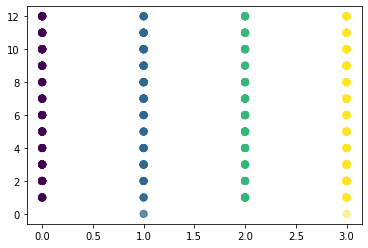

cluster vs Day of the week


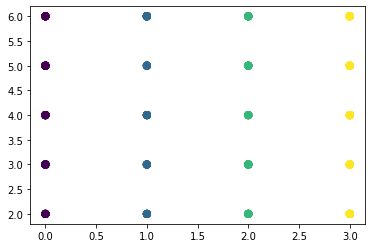

cluster vs Seasons


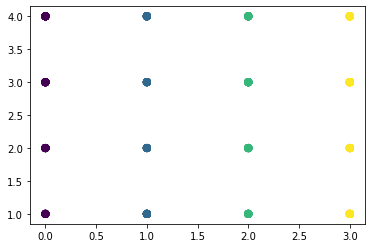

cluster vs Transportation expense


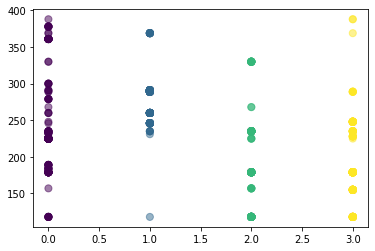

cluster vs Distance from Residence to Work


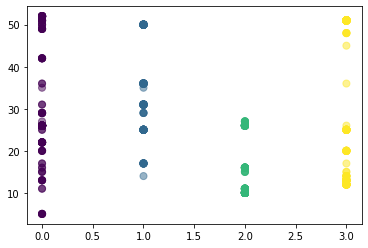

cluster vs Service time


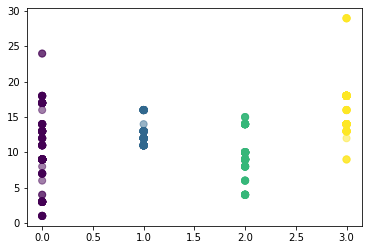

cluster vs Age


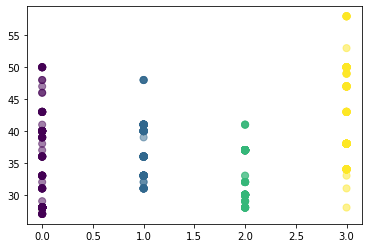

cluster vs Work load Average/day 


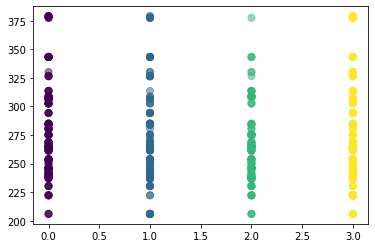

cluster vs Hit target


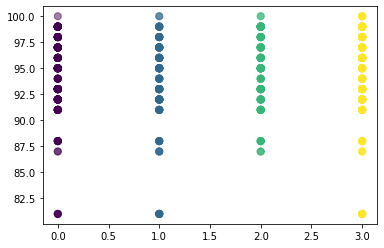

cluster vs Disciplinary failure


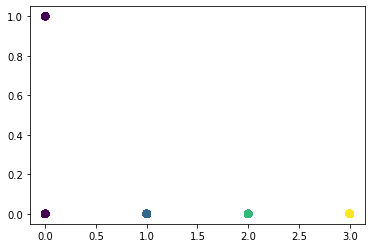

cluster vs Education


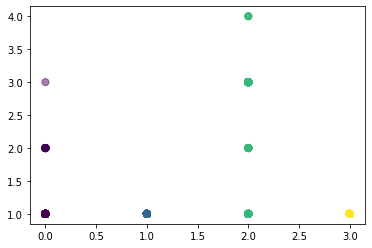

cluster vs Son


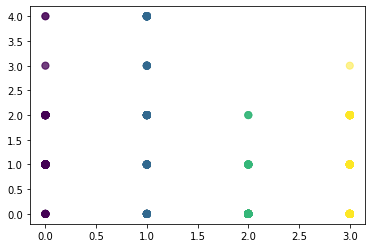

cluster vs Social drinker


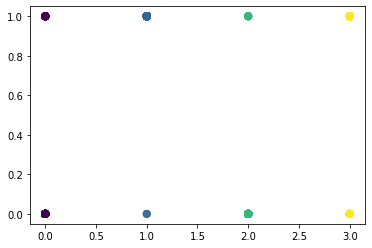

cluster vs Social smoker


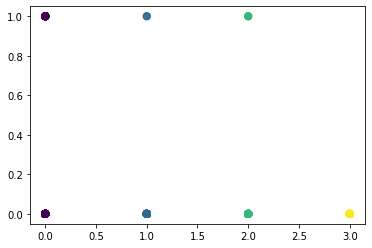

cluster vs Pet


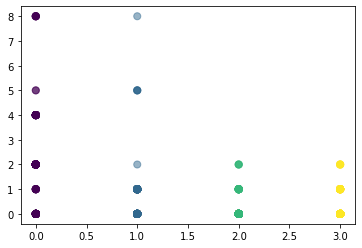

cluster vs Weight


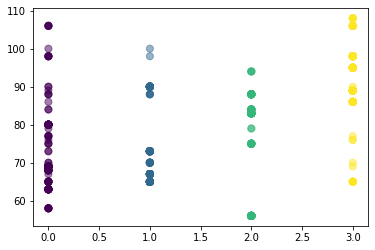

cluster vs Height


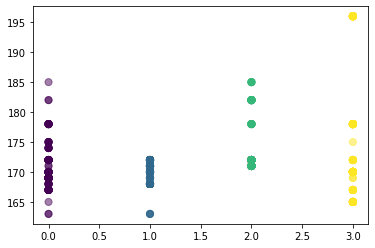

cluster vs Body mass index


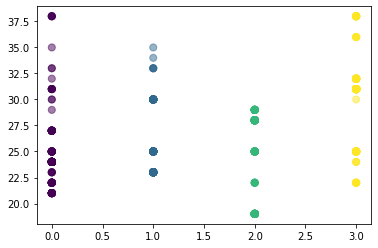

cluster vs Absenteeism time in hours


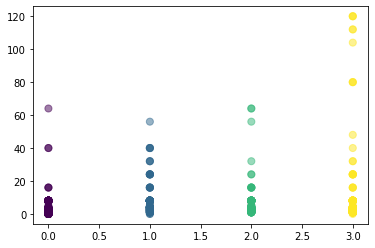

cluster vs Clusters


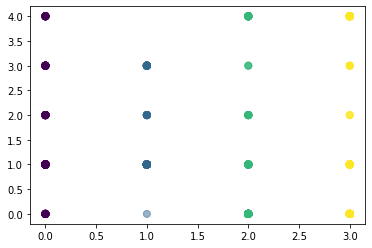

In [ ]:
for i in df.columns:
  for j in df.columns:
    if i!=j:
      print(i ,'vs' ,j)
      plt.scatter(df[i], df[j], c= df_plot['cluster'], s=50, alpha=0.5)
      plt.show()

In [ ]:
df.columns

Index(['Reason for absence', 'Month of absence', 'Day of the week', 'Seasons',
       'Transportation expense', 'Distance from Residence to Work',
       'Service time', 'Age', 'Work load Average/day ', 'Hit target',
       'Disciplinary failure', 'Education', 'Son', 'Social drinker',
       'Social smoker', 'Pet', 'Weight', 'Height', 'Body mass index',
       'Absenteeism time in hours'],
      dtype='object')

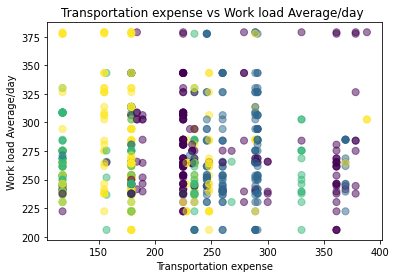

In [ ]:
plt.scatter(df['Transportation expense'],df['Work load Average/day '], c= df['cluster'], s=50, alpha=0.5)
plt.ylabel('Work load Average/day')
plt.xlabel('Transportation expense')
plt.title('Transportation expense vs Work load Average/day ')
plt.show()

as we compare graphs from pca we found that these two features have importance in employee absenteeism Work load Average/day and Transportation expense

###HIERARCHICAL

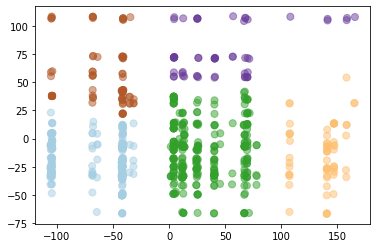

In [ ]:
steps = [('dimension_reduction', PCA()), ('agglo', AgglomerativeClustering())]
component=2
pipeline = Pipeline(steps) # define the pipeline object.

pipline = pipeline.set_params(agglo__linkage='ward')
pipline = pipeline.set_params(agglo__n_clusters=5)
pipline = pipeline.set_params(dimension_reduction__n_components=component)
# print(pipeline)
X_ = pipeline.fit_predict(df)   
df_plot1 = pd.DataFrame(PCA().fit_transform(df)[:, :component])    
df_plot1['cluster'] = X_        
# print(df_plot)
plt.scatter(df_plot1[0], df_plot1[1], c= df_plot1['cluster'], s=50, alpha=0.5, cmap='Paired')
plt.show()

Reason for absence vs Month of absence


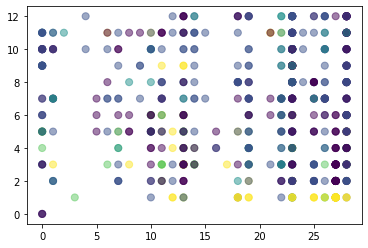

Reason for absence vs Day of the week


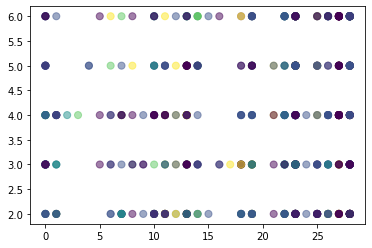

Reason for absence vs Seasons


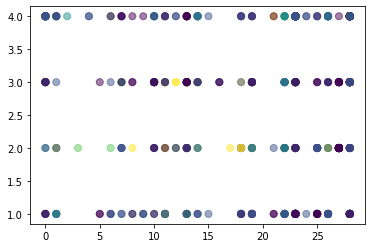

Reason for absence vs Transportation expense


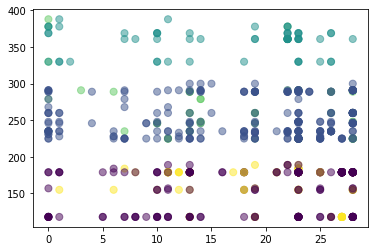

Reason for absence vs Distance from Residence to Work


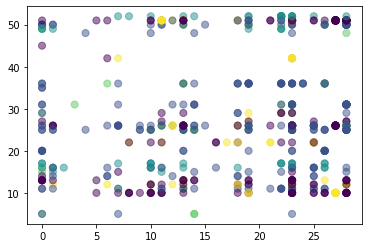

Reason for absence vs Service time


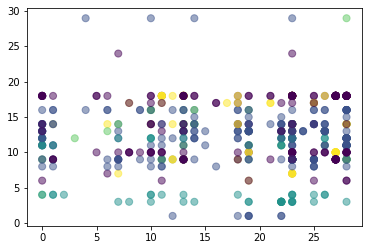

Reason for absence vs Age


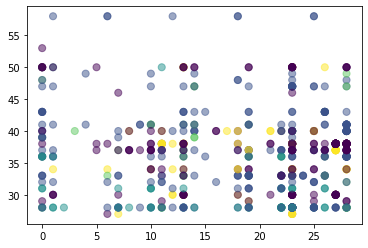

Reason for absence vs Work load Average/day 


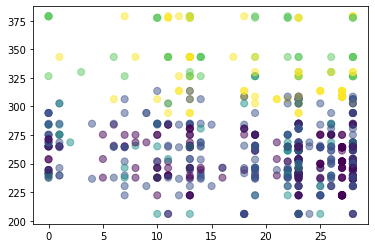

Reason for absence vs Hit target


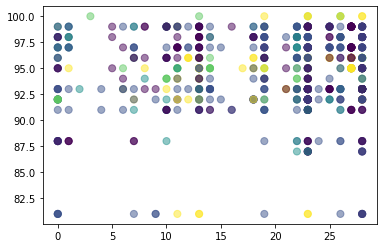

Reason for absence vs Disciplinary failure


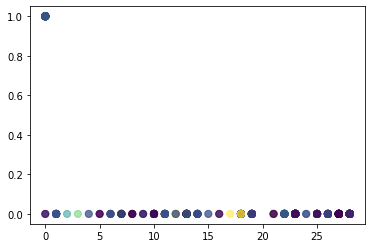

Reason for absence vs Education


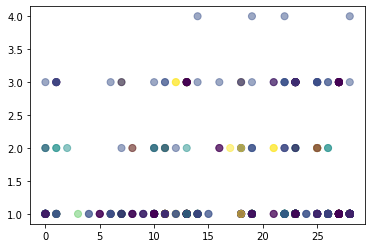

Reason for absence vs Son


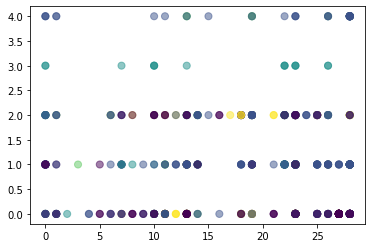

Reason for absence vs Social drinker


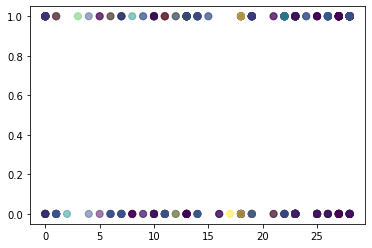

Reason for absence vs Social smoker


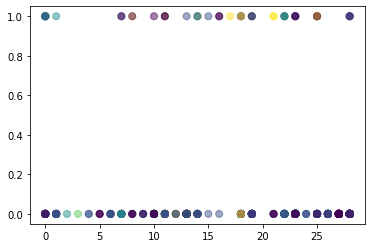

Reason for absence vs Pet


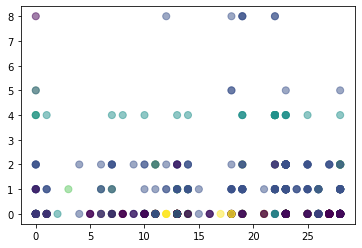

Reason for absence vs Weight


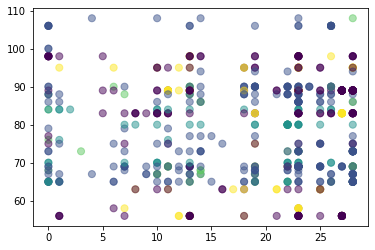

Reason for absence vs Height


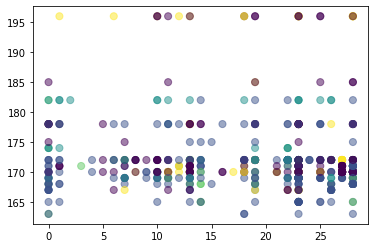

Reason for absence vs Body mass index


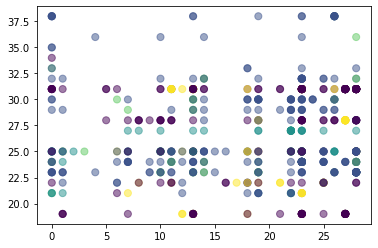

Reason for absence vs Absenteeism time in hours


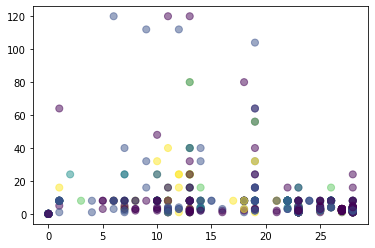

Month of absence vs Reason for absence


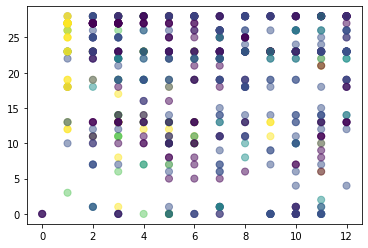

Month of absence vs Day of the week


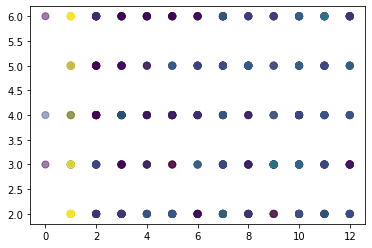

Month of absence vs Seasons


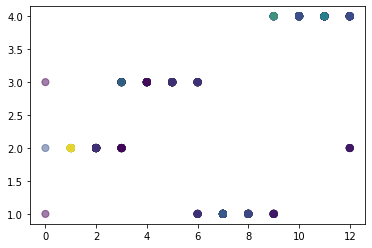

Month of absence vs Transportation expense


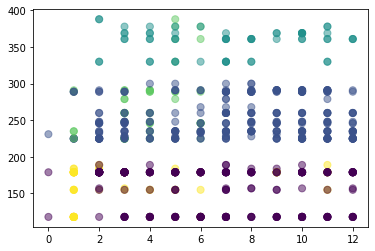

Month of absence vs Distance from Residence to Work


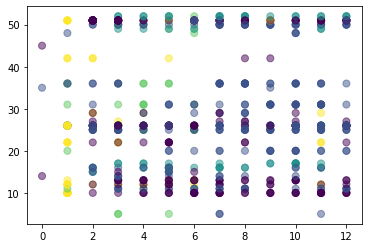

Month of absence vs Service time


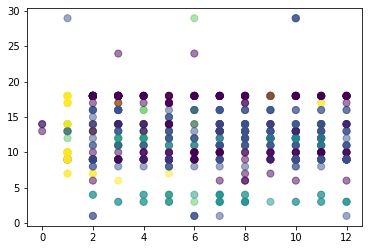

Month of absence vs Age


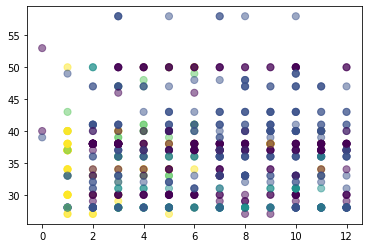

Month of absence vs Work load Average/day 


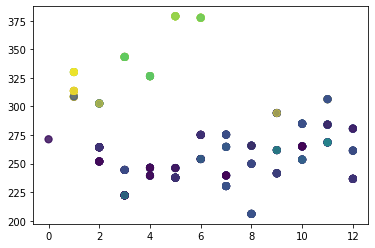

Month of absence vs Hit target


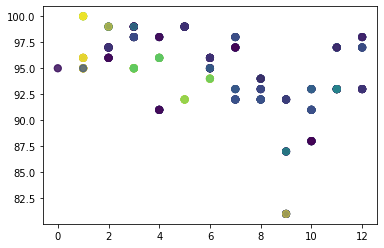

Month of absence vs Disciplinary failure


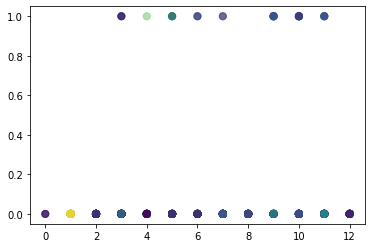

Month of absence vs Education


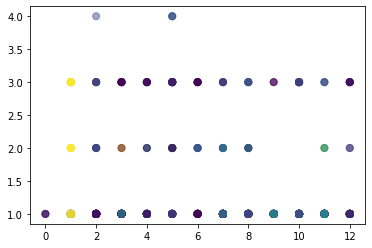

Month of absence vs Son


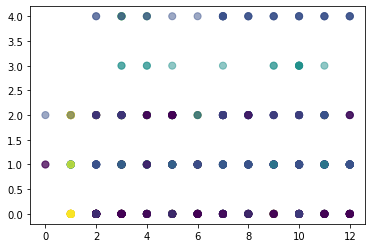

Month of absence vs Social drinker


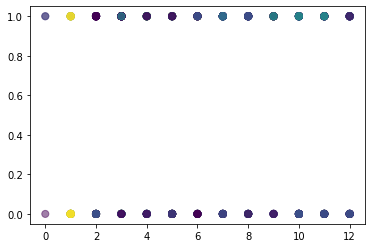

Month of absence vs Social smoker


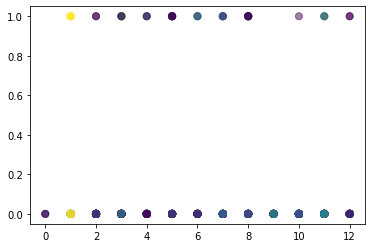

Month of absence vs Pet


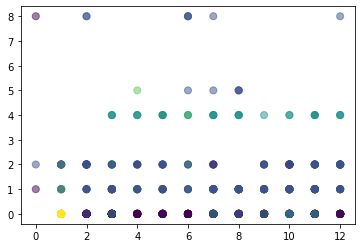

Month of absence vs Weight


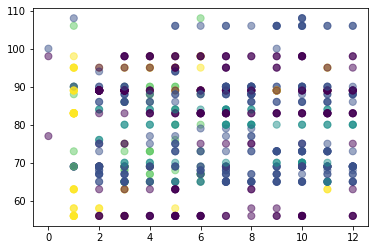

Month of absence vs Height


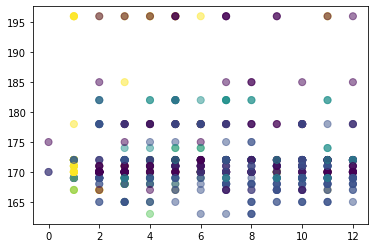

Month of absence vs Body mass index


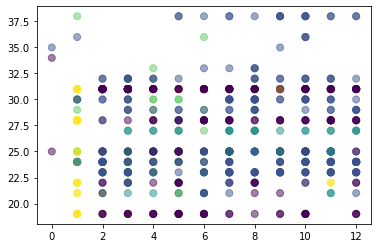

Month of absence vs Absenteeism time in hours


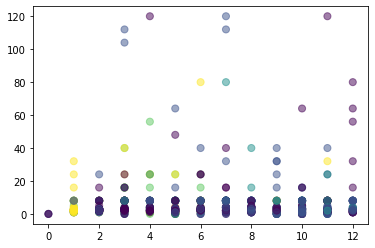

Day of the week vs Reason for absence


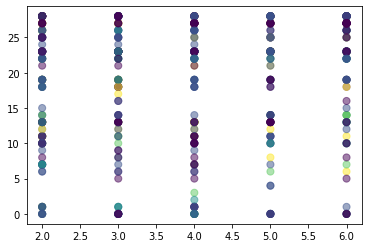

Day of the week vs Month of absence


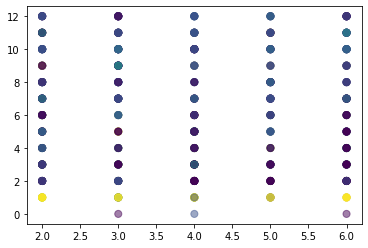

Day of the week vs Seasons


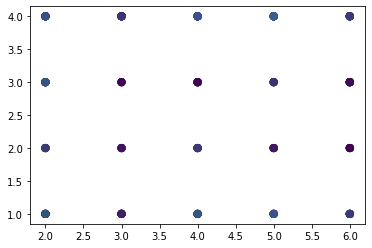

Day of the week vs Transportation expense


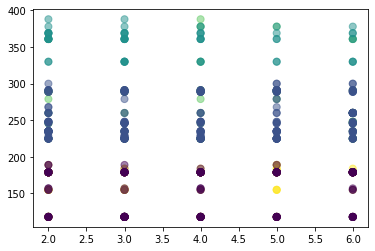

Day of the week vs Distance from Residence to Work


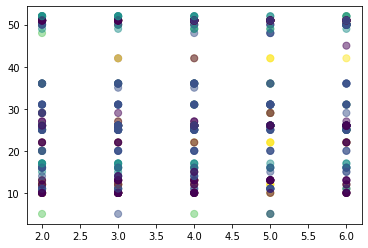

Day of the week vs Service time


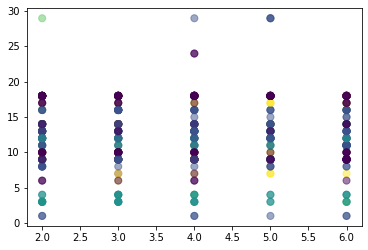

Day of the week vs Age


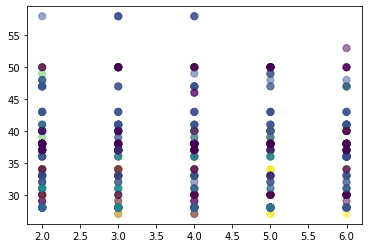

Day of the week vs Work load Average/day 


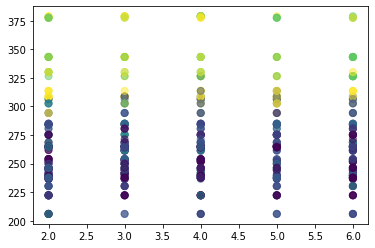

Day of the week vs Hit target


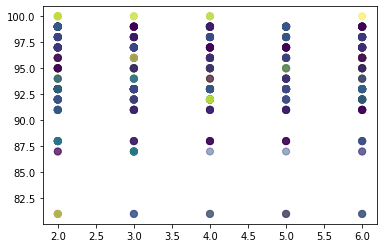

Day of the week vs Disciplinary failure


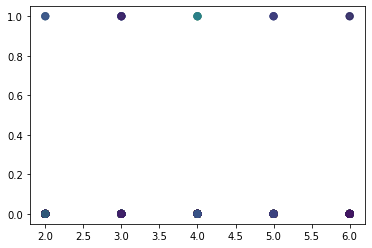

Day of the week vs Education


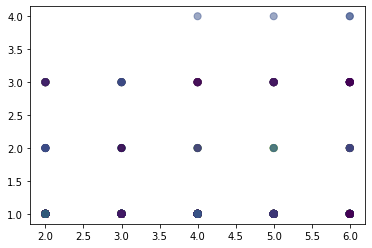

Day of the week vs Son


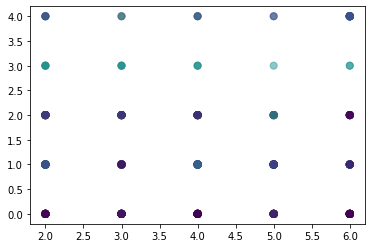

Day of the week vs Social drinker


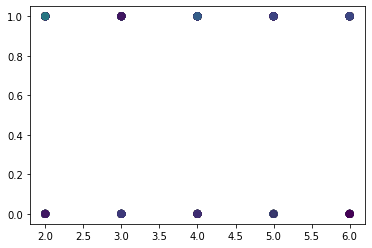

Day of the week vs Social smoker


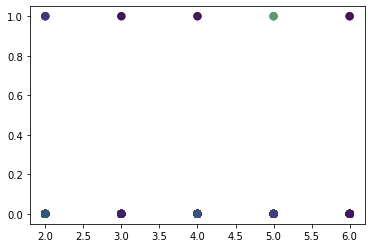

Day of the week vs Pet


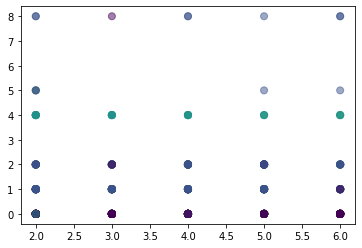

Day of the week vs Weight


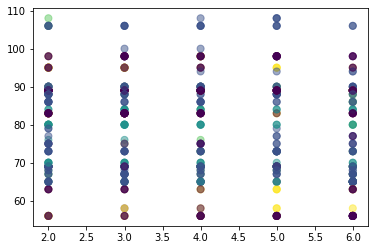

Day of the week vs Height


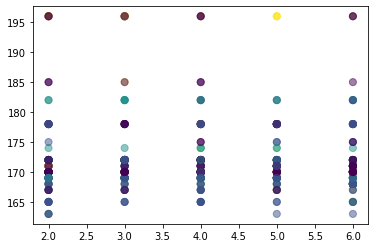

Day of the week vs Body mass index


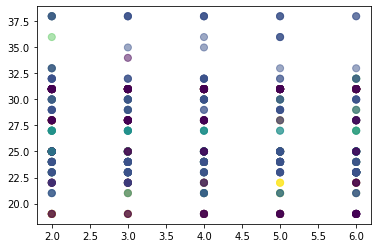

Day of the week vs Absenteeism time in hours


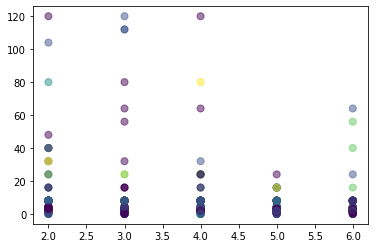

Seasons vs Reason for absence


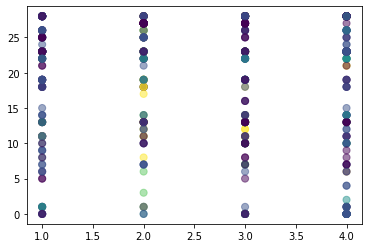

Seasons vs Month of absence


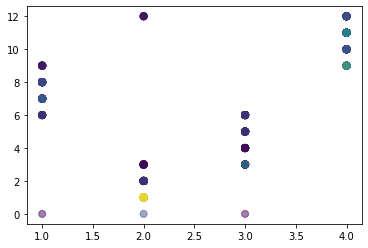

Seasons vs Day of the week


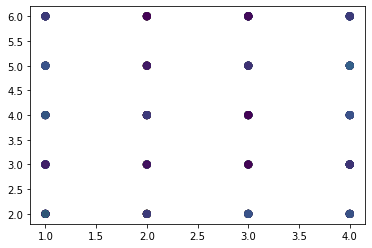

Seasons vs Transportation expense


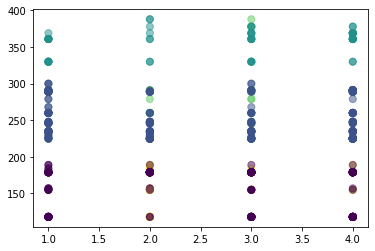

Seasons vs Distance from Residence to Work


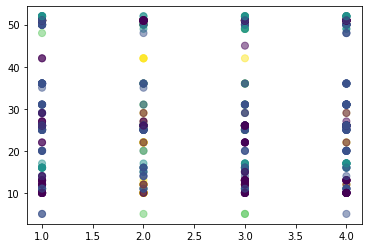

Seasons vs Service time


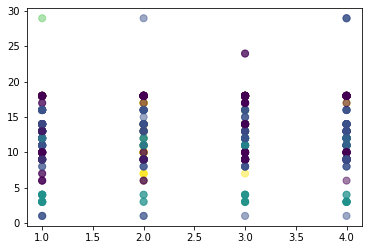

Seasons vs Age


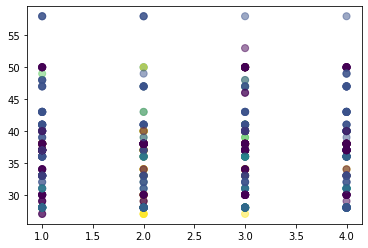

Seasons vs Work load Average/day 


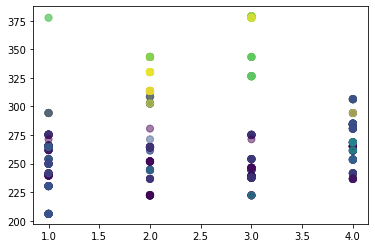

Seasons vs Hit target


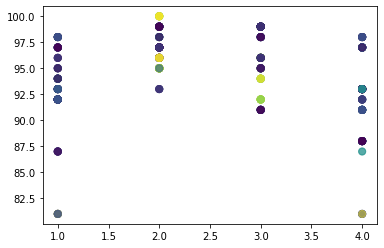

Seasons vs Disciplinary failure


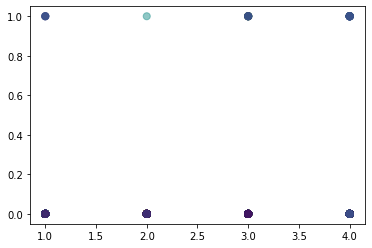

Seasons vs Education


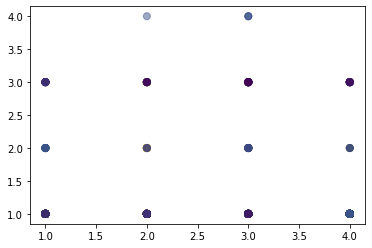

Seasons vs Son


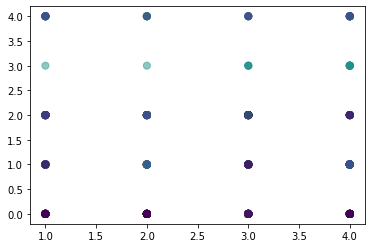

Seasons vs Social drinker


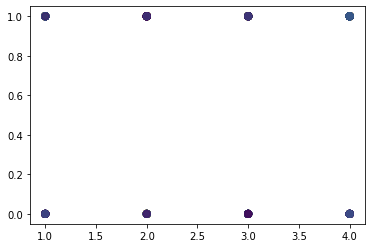

Seasons vs Social smoker


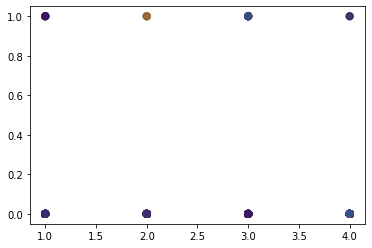

Seasons vs Pet


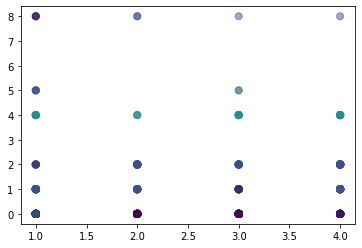

Seasons vs Weight


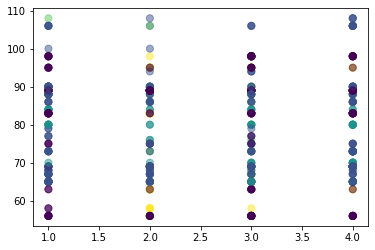

Seasons vs Height


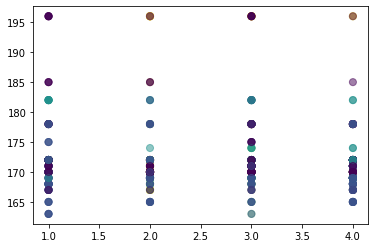

Seasons vs Body mass index


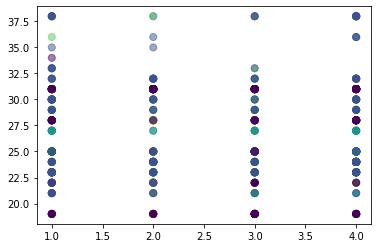

Seasons vs Absenteeism time in hours


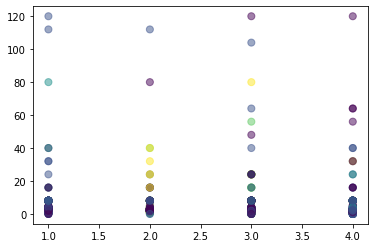

Transportation expense vs Reason for absence


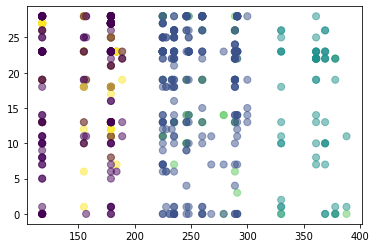

Transportation expense vs Month of absence


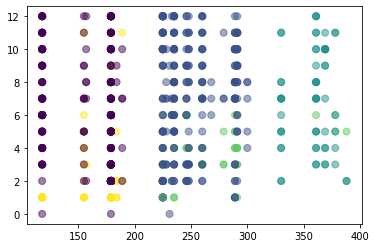

Transportation expense vs Day of the week


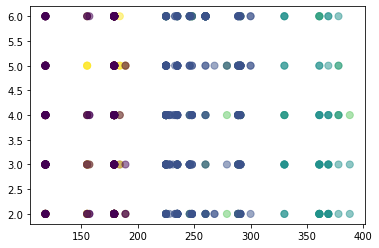

Transportation expense vs Seasons


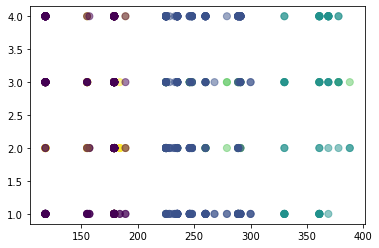

Transportation expense vs Distance from Residence to Work


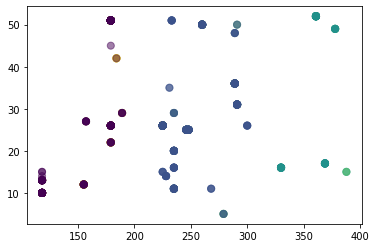

Transportation expense vs Service time


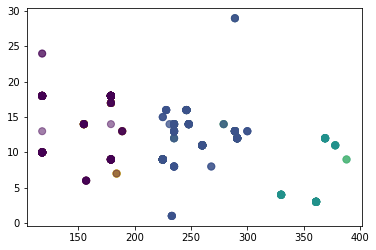

Transportation expense vs Age


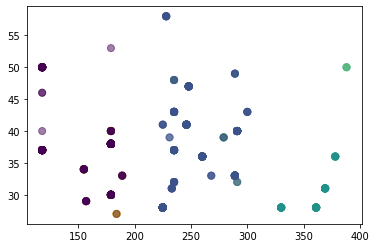

Transportation expense vs Work load Average/day 


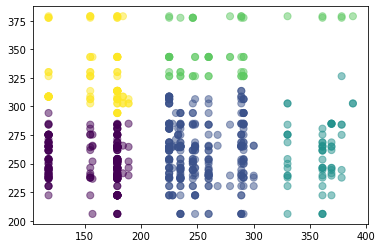

Transportation expense vs Hit target


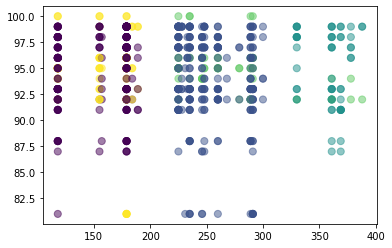

Transportation expense vs Disciplinary failure


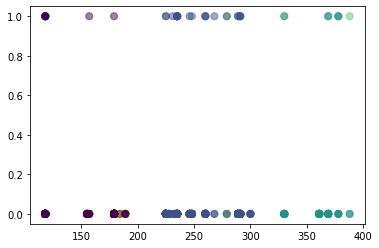

Transportation expense vs Education


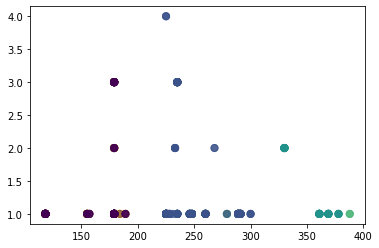

Transportation expense vs Son


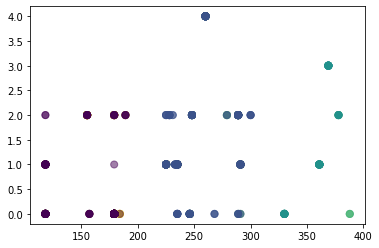

Transportation expense vs Social drinker


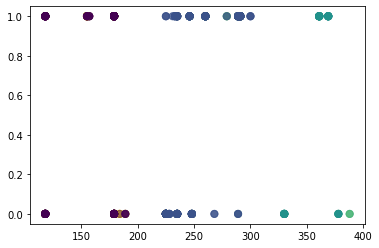

Transportation expense vs Social smoker


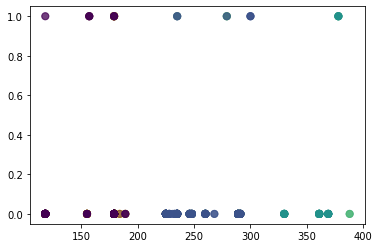

Transportation expense vs Pet


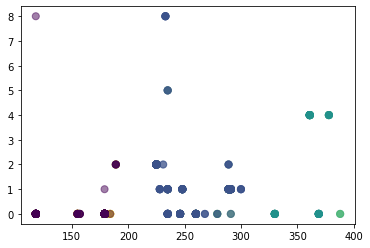

Transportation expense vs Weight


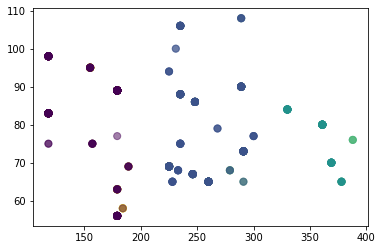

Transportation expense vs Height


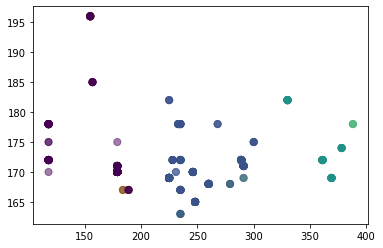

Transportation expense vs Body mass index


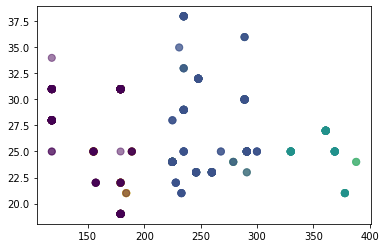

Transportation expense vs Absenteeism time in hours


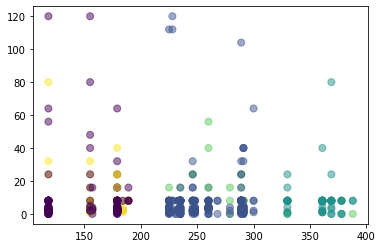

Distance from Residence to Work vs Reason for absence


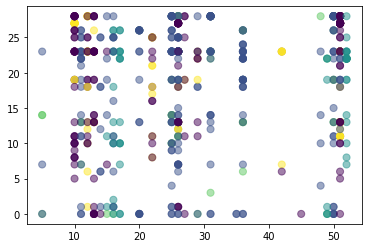

Distance from Residence to Work vs Month of absence


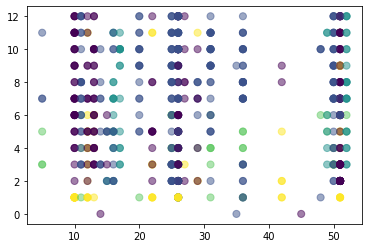

Distance from Residence to Work vs Day of the week


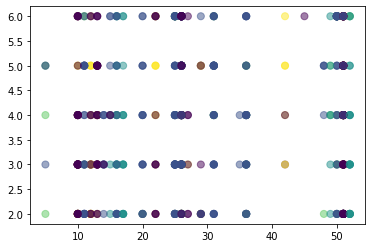

Distance from Residence to Work vs Seasons


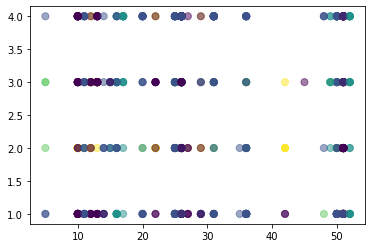

Distance from Residence to Work vs Transportation expense


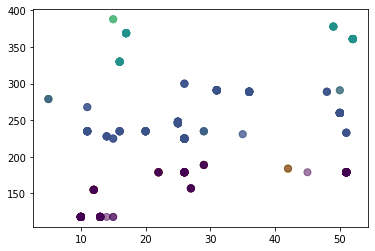

Distance from Residence to Work vs Service time


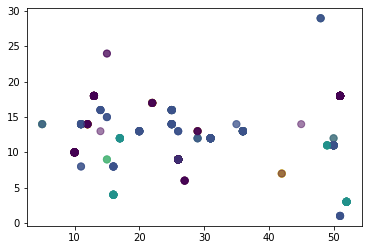

Distance from Residence to Work vs Age


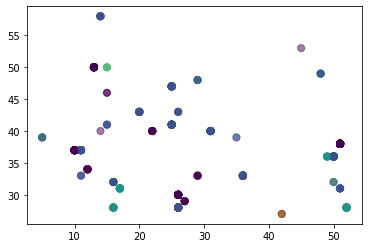

Distance from Residence to Work vs Work load Average/day 


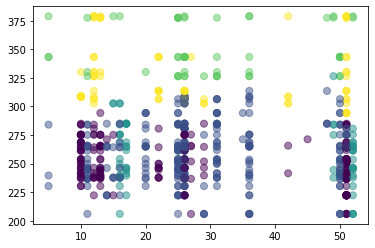

Distance from Residence to Work vs Hit target


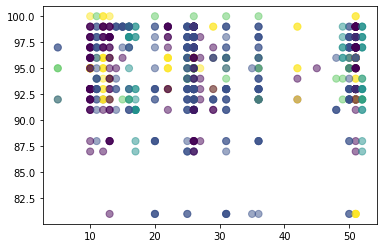

Distance from Residence to Work vs Disciplinary failure


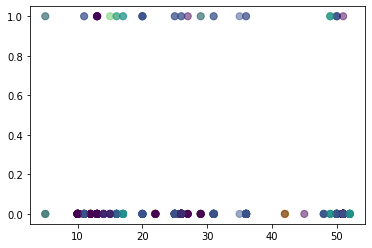

Distance from Residence to Work vs Education


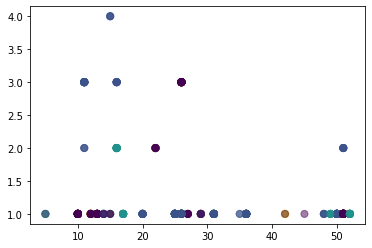

Distance from Residence to Work vs Son


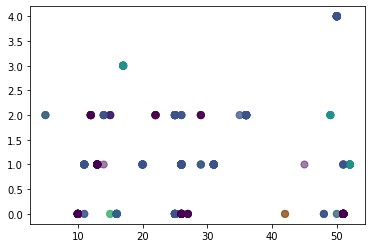

Distance from Residence to Work vs Social drinker


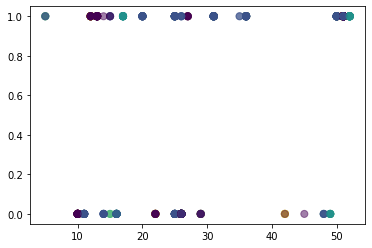

Distance from Residence to Work vs Social smoker


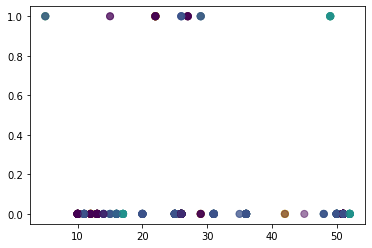

Distance from Residence to Work vs Pet


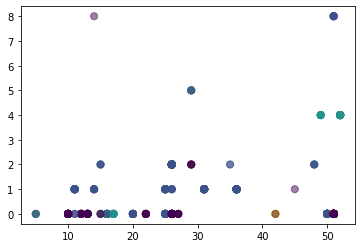

Distance from Residence to Work vs Weight


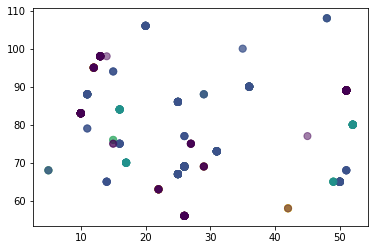

Distance from Residence to Work vs Height


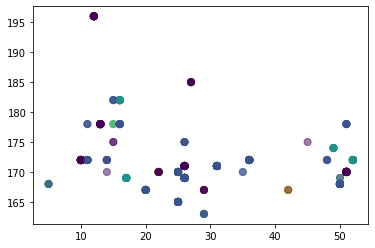

Distance from Residence to Work vs Body mass index


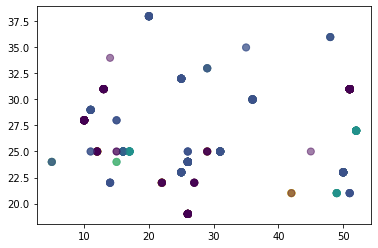

Distance from Residence to Work vs Absenteeism time in hours


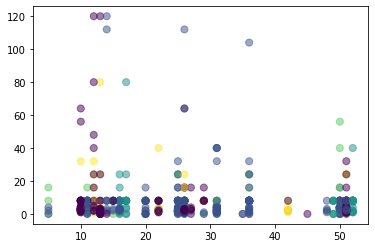

Service time vs Reason for absence


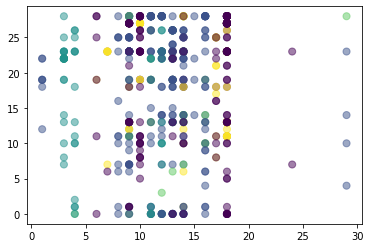

Service time vs Month of absence


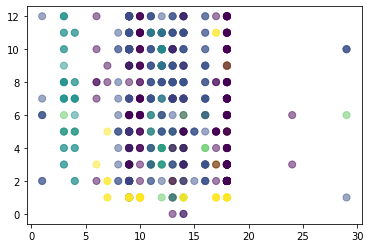

Service time vs Day of the week


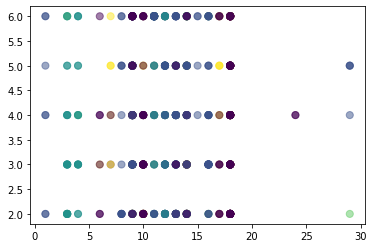

Service time vs Seasons


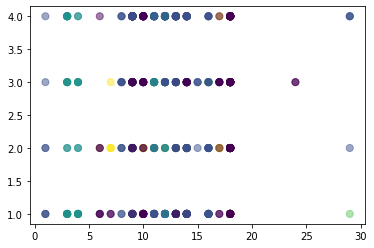

Service time vs Transportation expense


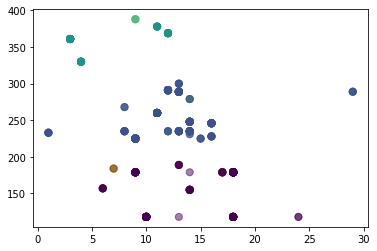

Service time vs Distance from Residence to Work


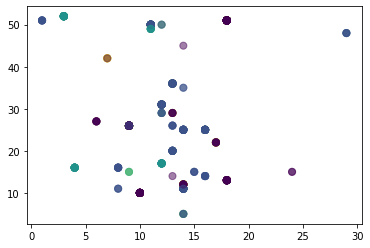

Service time vs Age


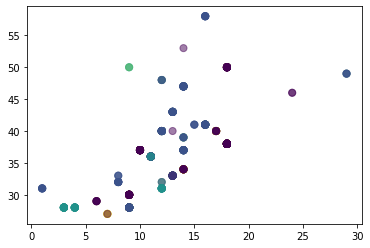

Service time vs Work load Average/day 


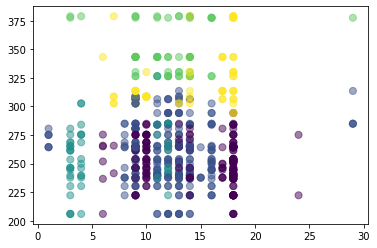

Service time vs Hit target


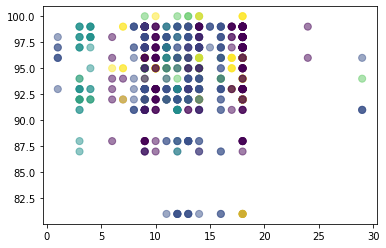

Service time vs Disciplinary failure


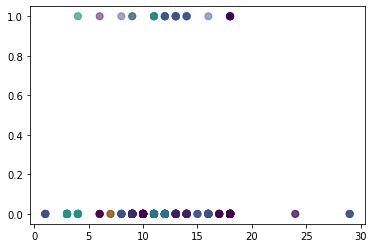

Service time vs Education


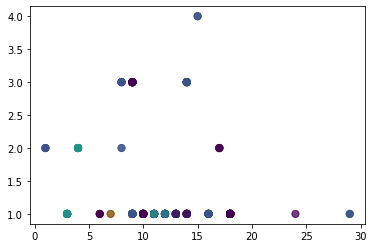

Service time vs Son


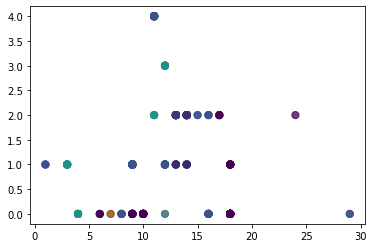

Service time vs Social drinker


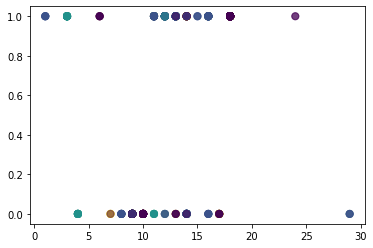

Service time vs Social smoker


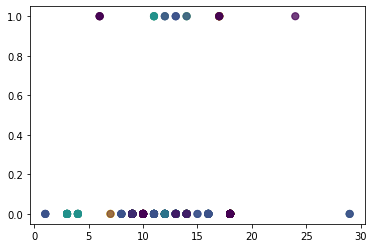

Service time vs Pet


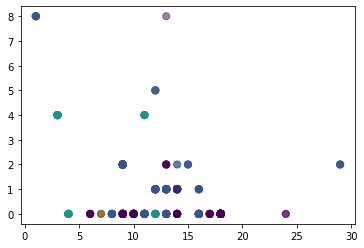

Service time vs Weight


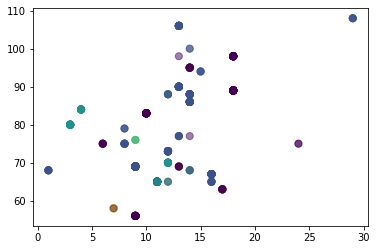

Service time vs Height


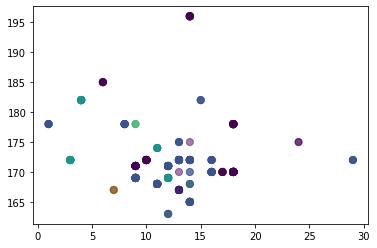

Service time vs Body mass index


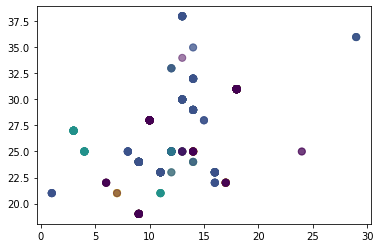

Service time vs Absenteeism time in hours


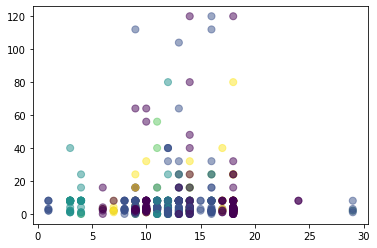

Age vs Reason for absence


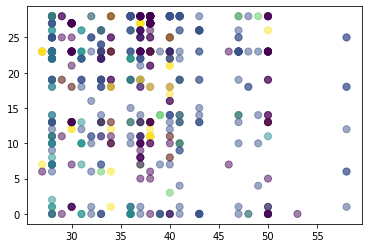

Age vs Month of absence


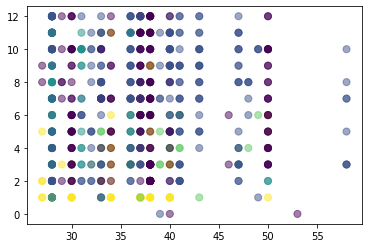

Age vs Day of the week


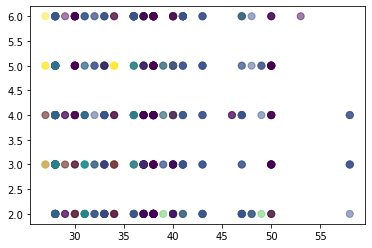

Age vs Seasons


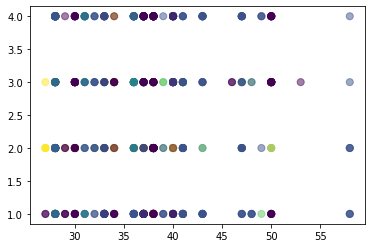

Age vs Transportation expense


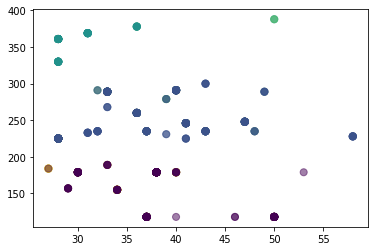

Age vs Distance from Residence to Work


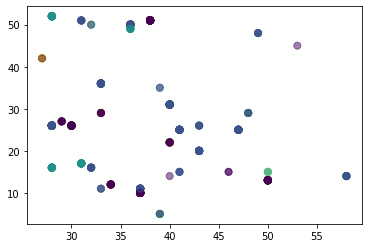

Age vs Service time


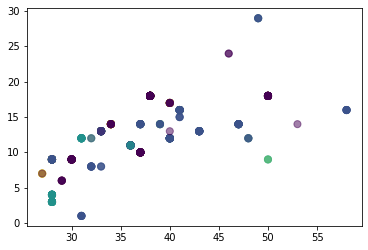

Age vs Work load Average/day 


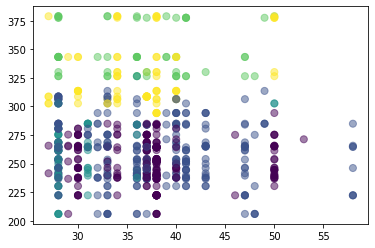

Age vs Hit target


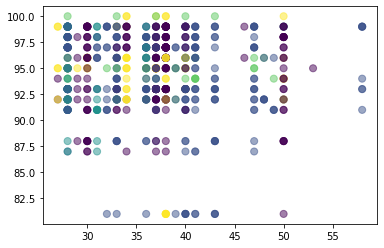

Age vs Disciplinary failure


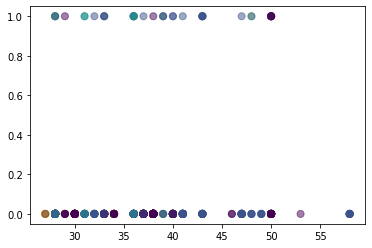

Age vs Education


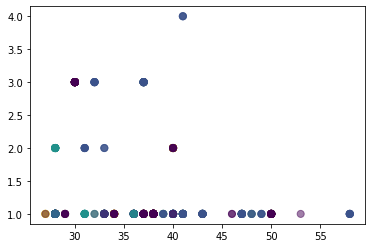

Age vs Son


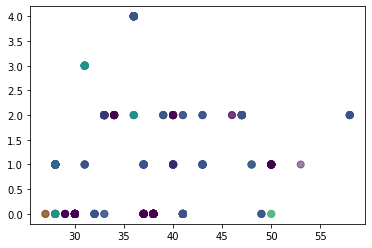

Age vs Social drinker


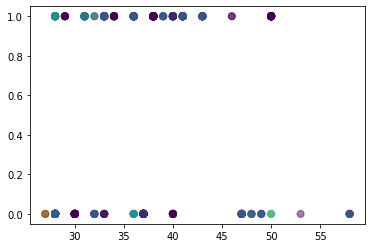

Age vs Social smoker


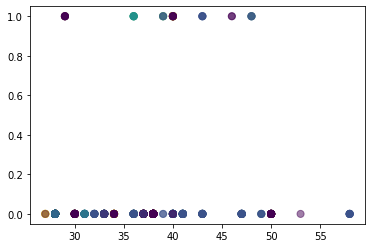

Age vs Pet


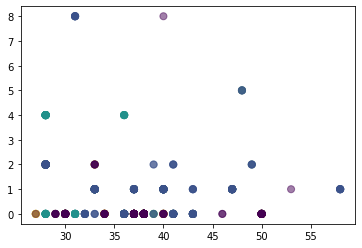

Age vs Weight


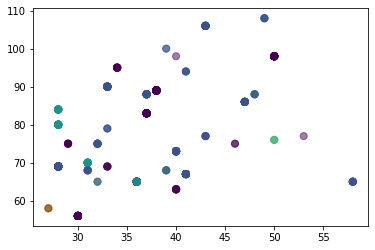

Age vs Height


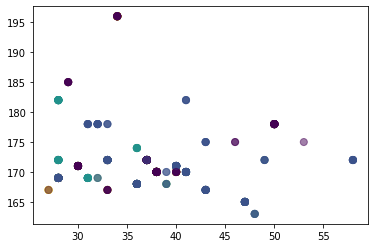

Age vs Body mass index


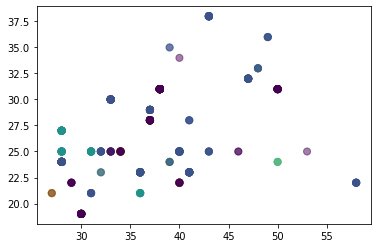

Age vs Absenteeism time in hours


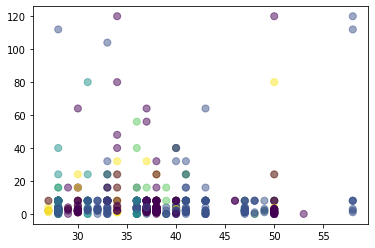

Work load Average/day  vs Reason for absence


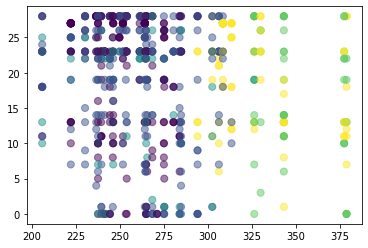

Work load Average/day  vs Month of absence


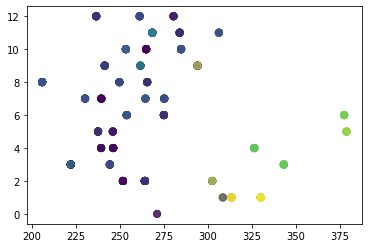

Work load Average/day  vs Day of the week


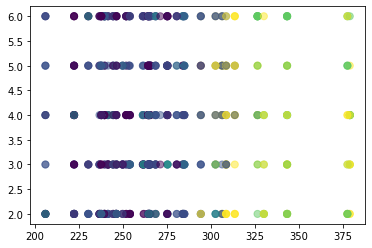

Work load Average/day  vs Seasons


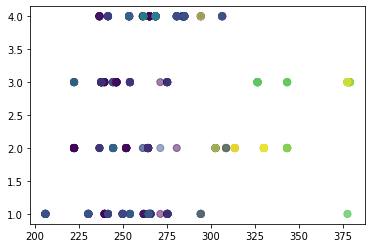

Work load Average/day  vs Transportation expense


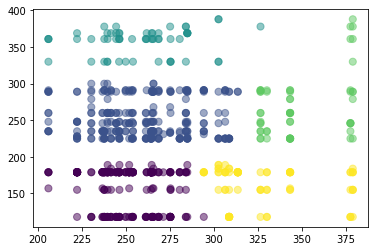

Work load Average/day  vs Distance from Residence to Work


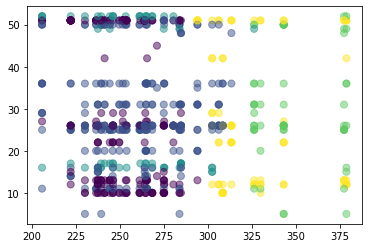

Work load Average/day  vs Service time


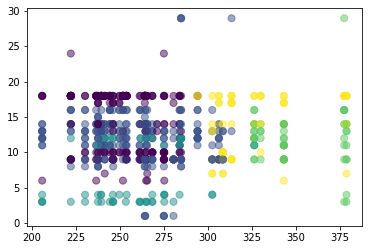

Work load Average/day  vs Age


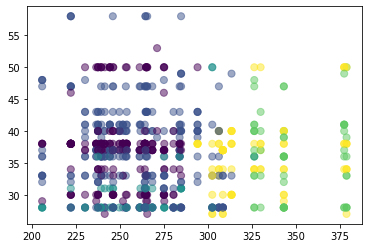

Work load Average/day  vs Hit target


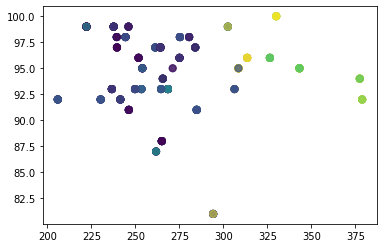

Work load Average/day  vs Disciplinary failure


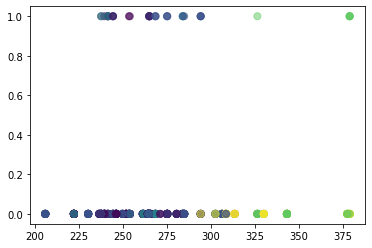

Work load Average/day  vs Education


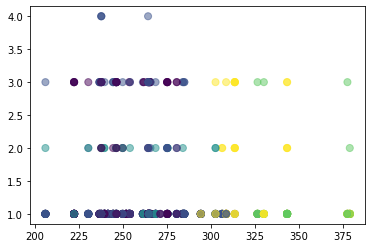

Work load Average/day  vs Son


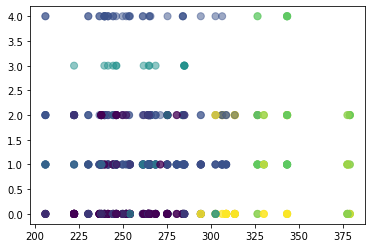

Work load Average/day  vs Social drinker


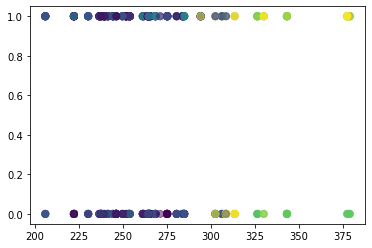

Work load Average/day  vs Social smoker


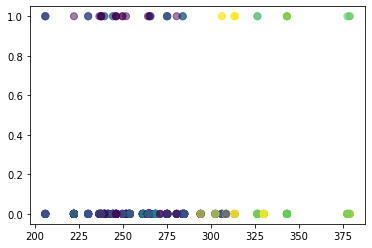

Work load Average/day  vs Pet


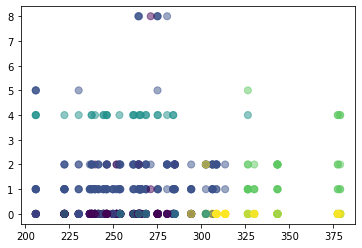

Work load Average/day  vs Weight


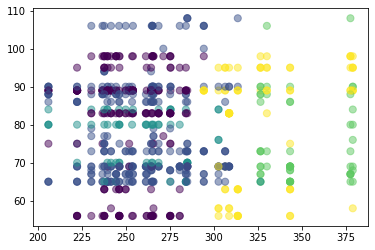

Work load Average/day  vs Height


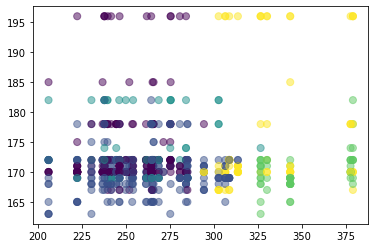

Work load Average/day  vs Body mass index


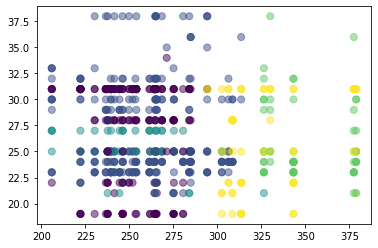

Work load Average/day  vs Absenteeism time in hours


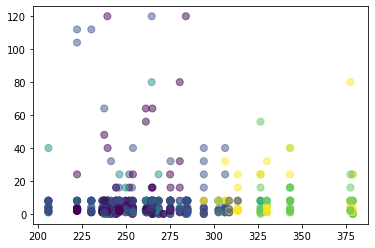

Hit target vs Reason for absence


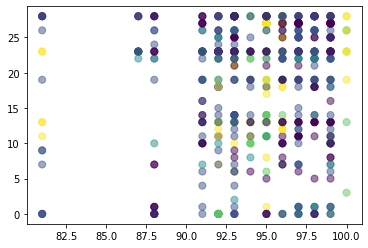

Hit target vs Month of absence


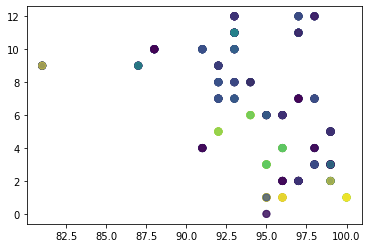

Hit target vs Day of the week


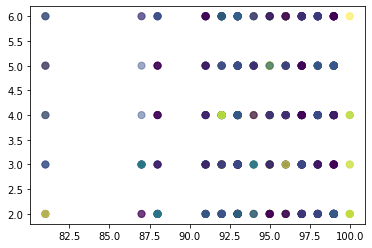

Hit target vs Seasons


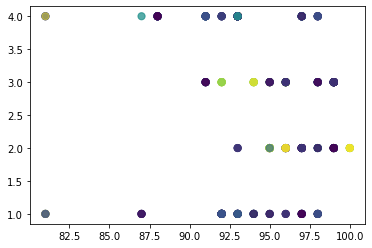

Hit target vs Transportation expense


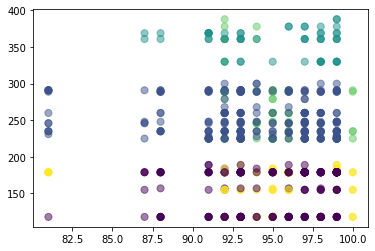

Hit target vs Distance from Residence to Work


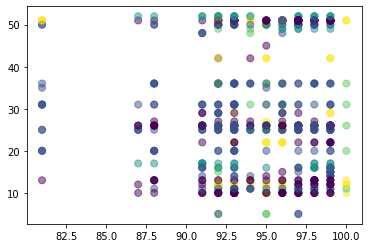

Hit target vs Service time


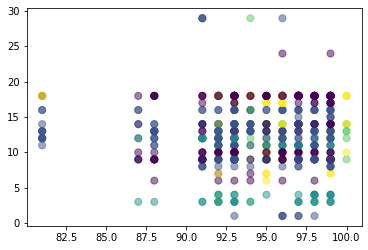

Hit target vs Age


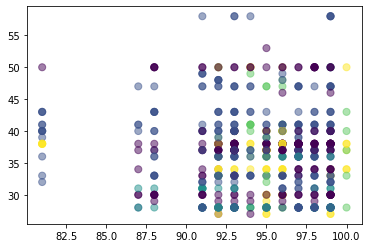

Hit target vs Work load Average/day 


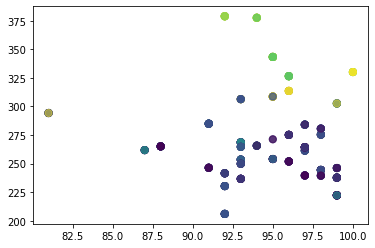

Hit target vs Disciplinary failure


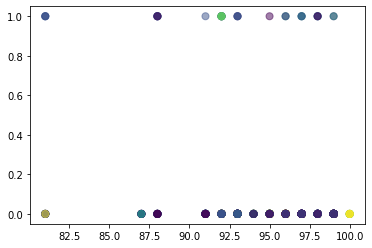

Hit target vs Education


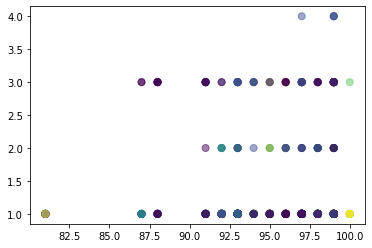

Hit target vs Son


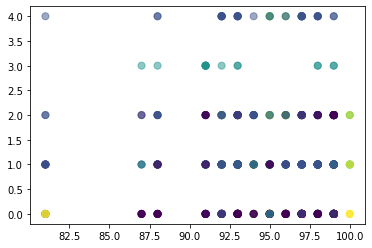

Hit target vs Social drinker


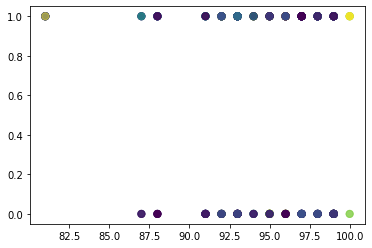

Hit target vs Social smoker


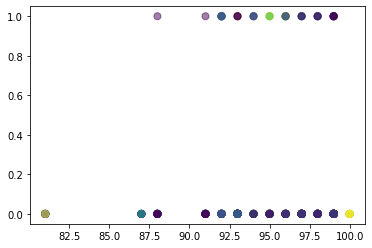

Hit target vs Pet


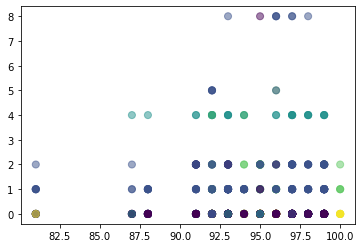

Hit target vs Weight


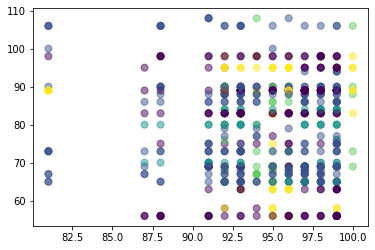

Hit target vs Height


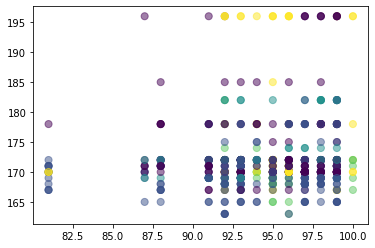

Hit target vs Body mass index


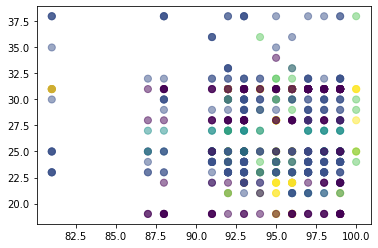

Hit target vs Absenteeism time in hours


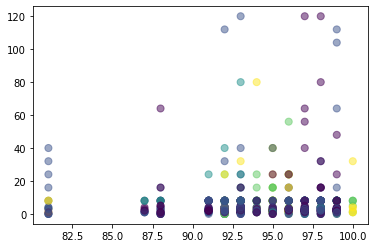

Disciplinary failure vs Reason for absence


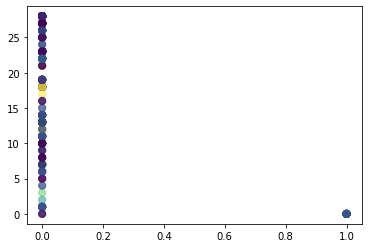

Disciplinary failure vs Month of absence


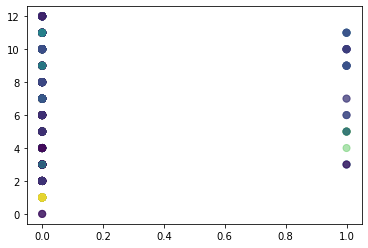

Disciplinary failure vs Day of the week


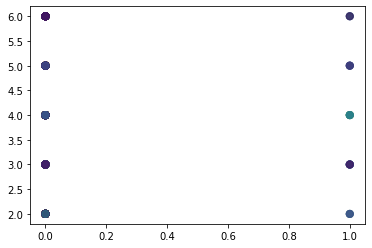

Disciplinary failure vs Seasons


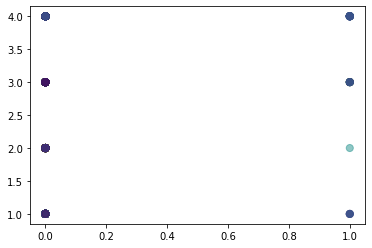

Disciplinary failure vs Transportation expense


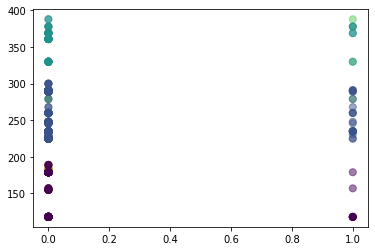

Disciplinary failure vs Distance from Residence to Work


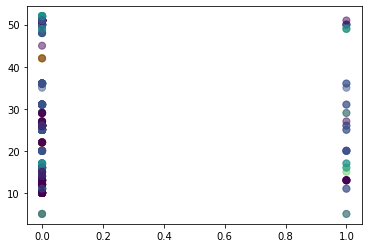

Disciplinary failure vs Service time


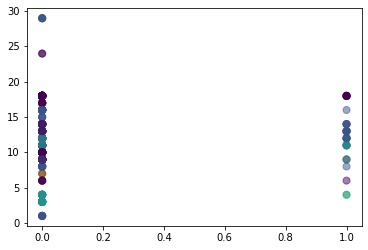

Disciplinary failure vs Age


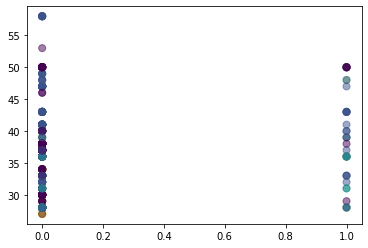

Disciplinary failure vs Work load Average/day 


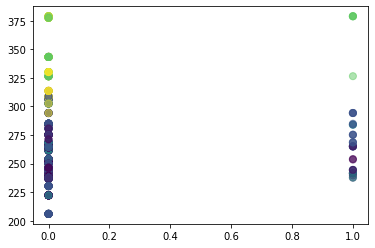

Disciplinary failure vs Hit target


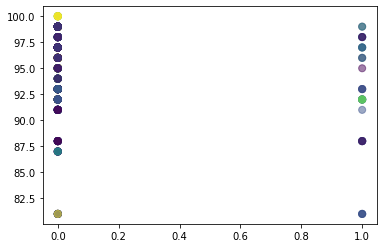

Disciplinary failure vs Education


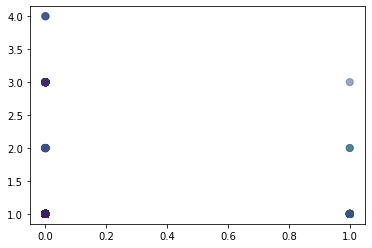

Disciplinary failure vs Son


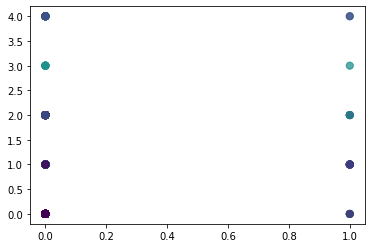

Disciplinary failure vs Social drinker


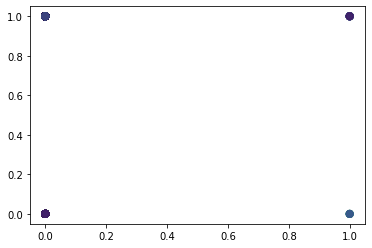

Disciplinary failure vs Social smoker


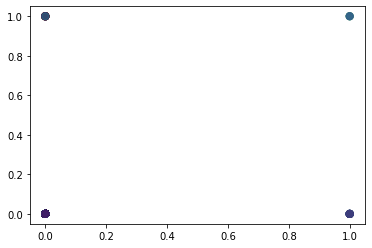

Disciplinary failure vs Pet


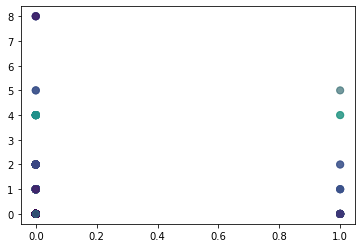

Disciplinary failure vs Weight


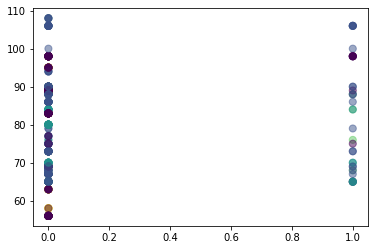

Disciplinary failure vs Height


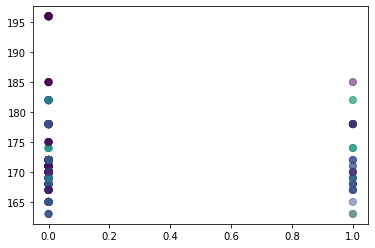

Disciplinary failure vs Body mass index


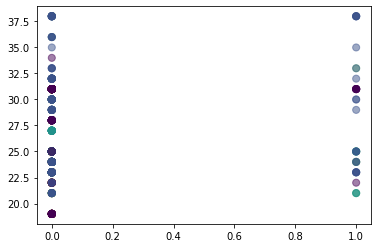

Disciplinary failure vs Absenteeism time in hours


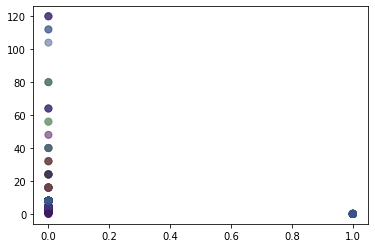

Education vs Reason for absence


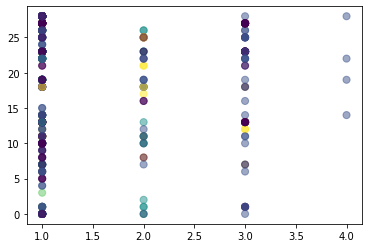

Education vs Month of absence


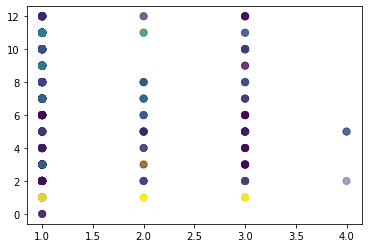

Education vs Day of the week


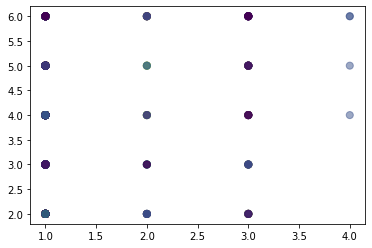

Education vs Seasons


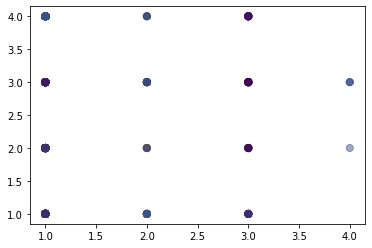

Education vs Transportation expense


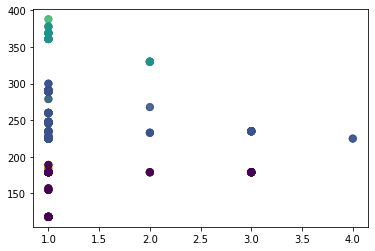

Education vs Distance from Residence to Work


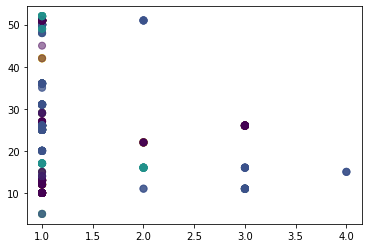

Education vs Service time


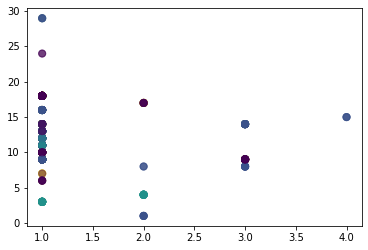

Education vs Age


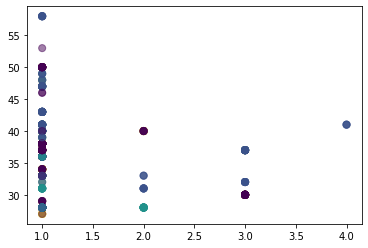

Education vs Work load Average/day 


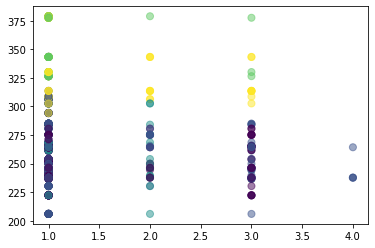

Education vs Hit target


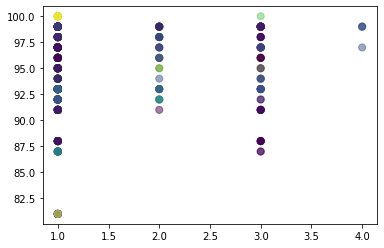

Education vs Disciplinary failure


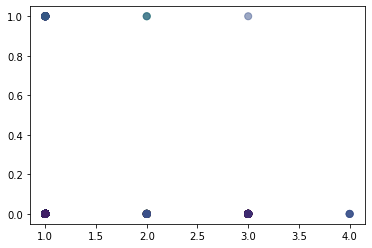

Education vs Son


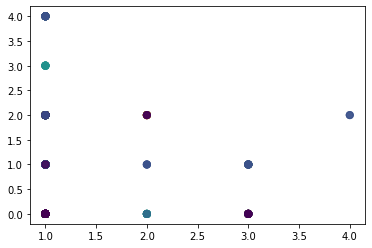

Education vs Social drinker


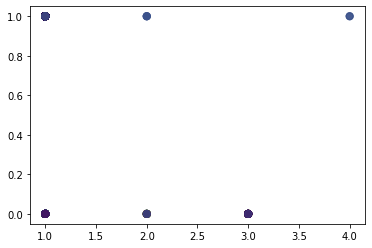

Education vs Social smoker


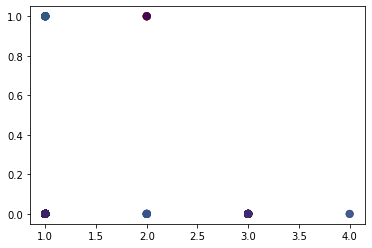

Education vs Pet


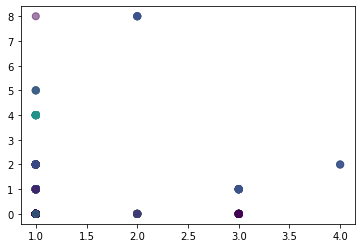

Education vs Weight


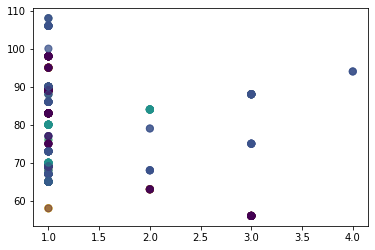

Education vs Height


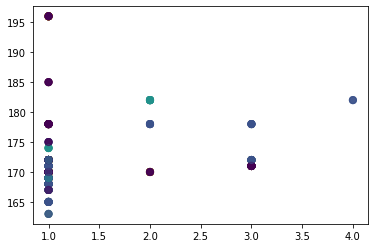

Education vs Body mass index


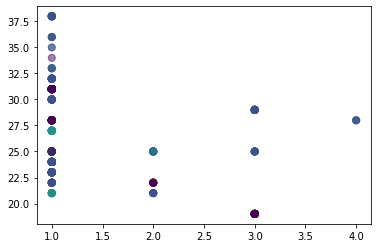

Education vs Absenteeism time in hours


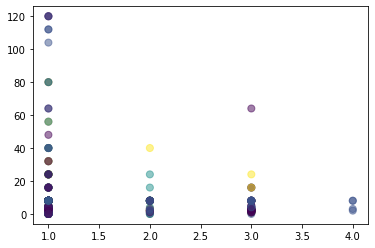

Son vs Reason for absence


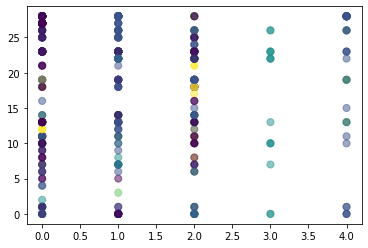

Son vs Month of absence


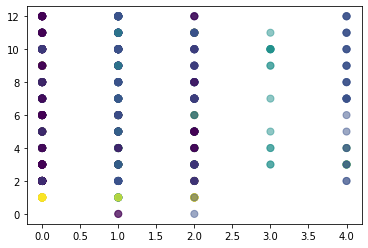

Son vs Day of the week


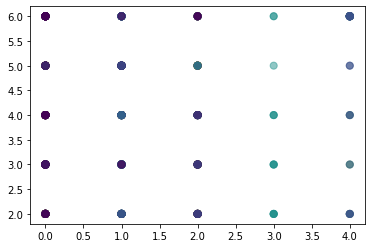

Son vs Seasons


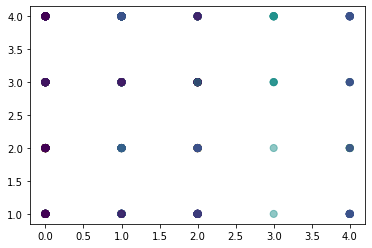

Son vs Transportation expense


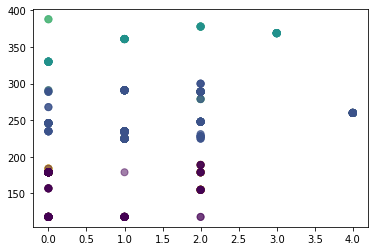

Son vs Distance from Residence to Work


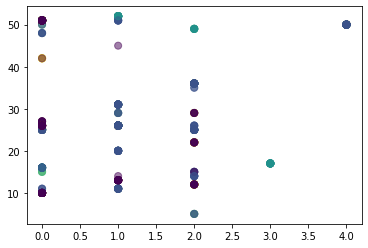

Son vs Service time


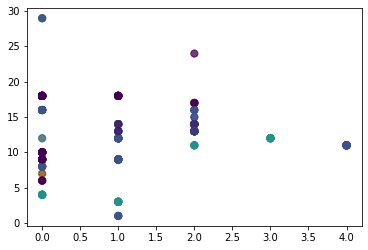

Son vs Age


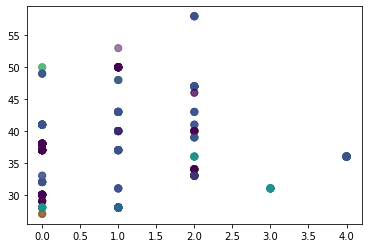

Son vs Work load Average/day 


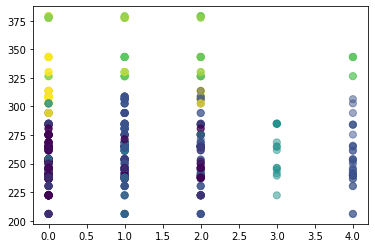

Son vs Hit target


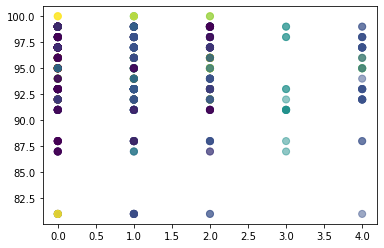

Son vs Disciplinary failure


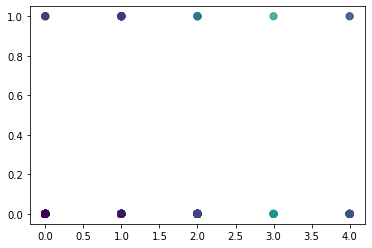

Son vs Education


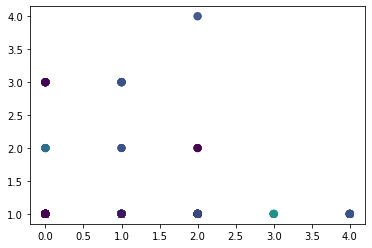

Son vs Social drinker


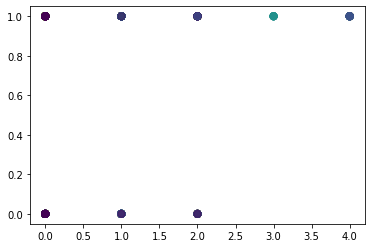

Son vs Social smoker


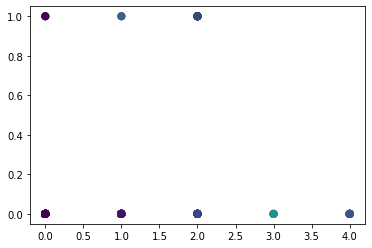

Son vs Pet


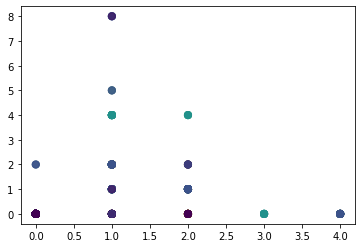

Son vs Weight


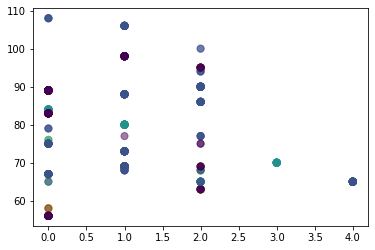

Son vs Height


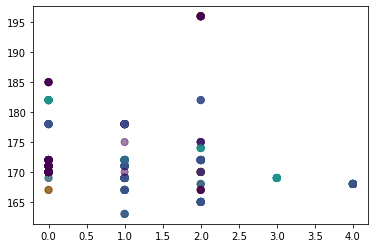

Son vs Body mass index


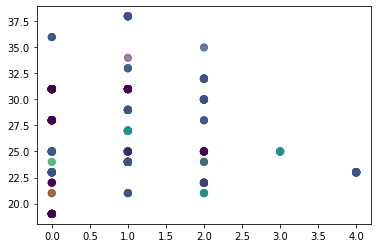

Son vs Absenteeism time in hours


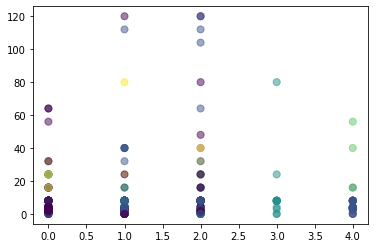

Social drinker vs Reason for absence


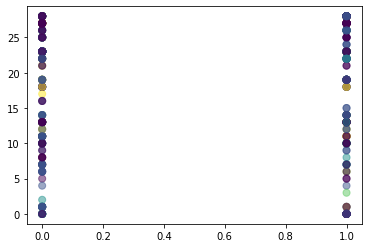

Social drinker vs Month of absence


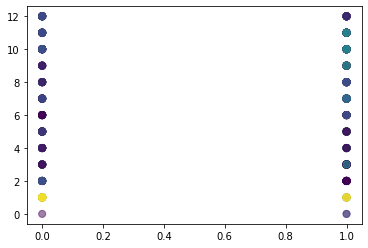

Social drinker vs Day of the week


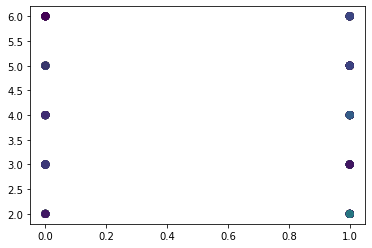

Social drinker vs Seasons


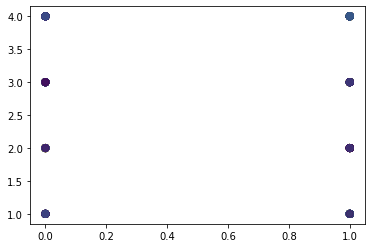

Social drinker vs Transportation expense


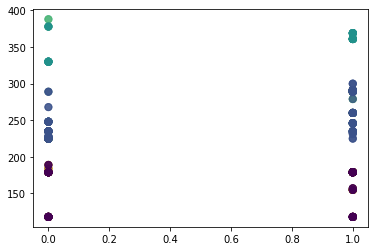

Social drinker vs Distance from Residence to Work


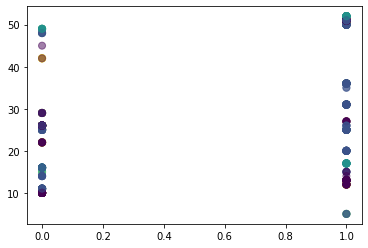

Social drinker vs Service time


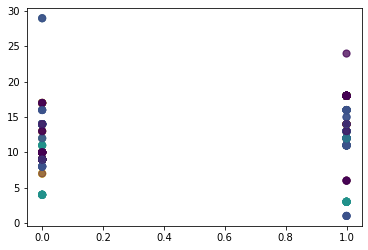

Social drinker vs Age


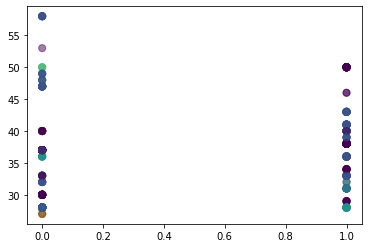

Social drinker vs Work load Average/day 


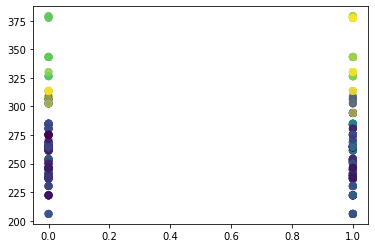

Social drinker vs Hit target


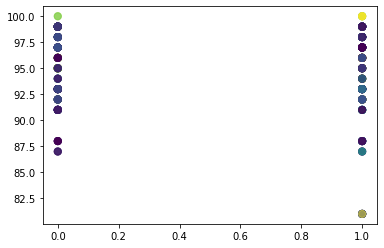

Social drinker vs Disciplinary failure


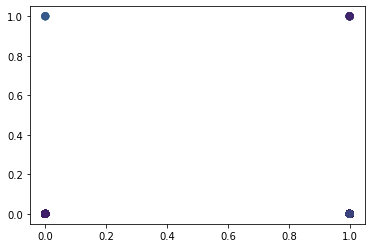

Social drinker vs Education


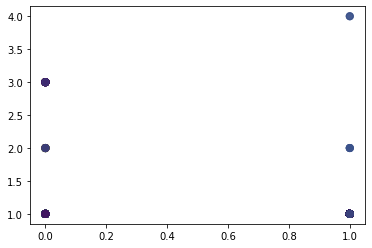

Social drinker vs Son


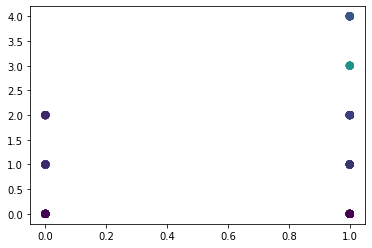

Social drinker vs Social smoker


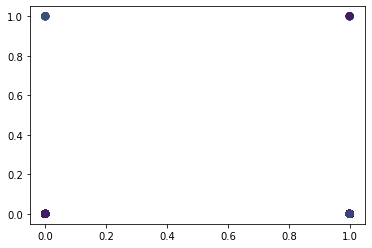

Social drinker vs Pet


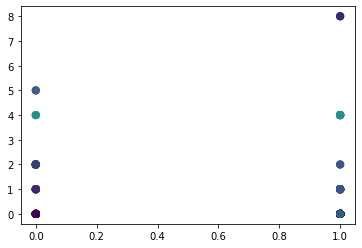

Social drinker vs Weight


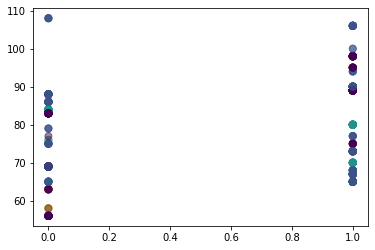

Social drinker vs Height


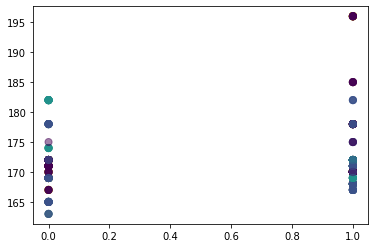

Social drinker vs Body mass index


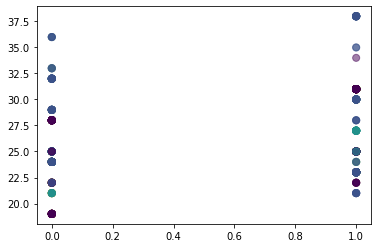

Social drinker vs Absenteeism time in hours


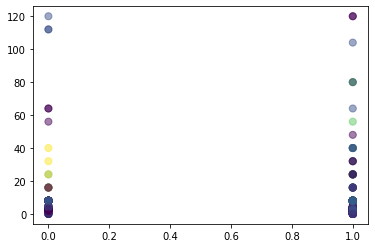

Social smoker vs Reason for absence


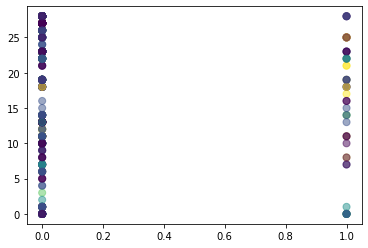

Social smoker vs Month of absence


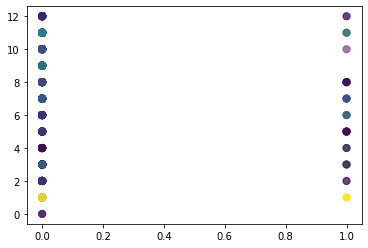

Social smoker vs Day of the week


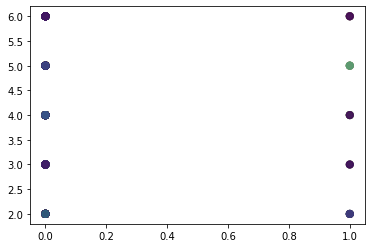

Social smoker vs Seasons


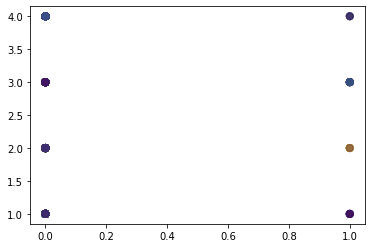

Social smoker vs Transportation expense


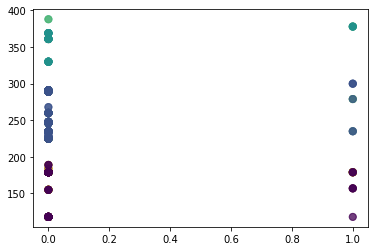

Social smoker vs Distance from Residence to Work


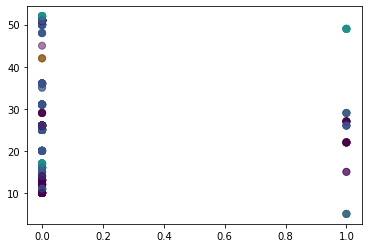

Social smoker vs Service time


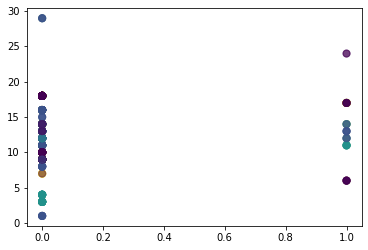

Social smoker vs Age


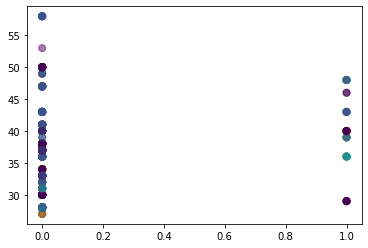

Social smoker vs Work load Average/day 


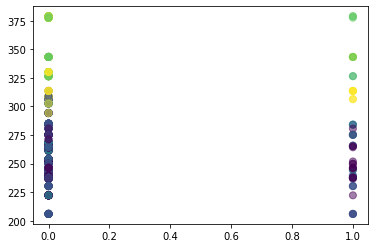

Social smoker vs Hit target


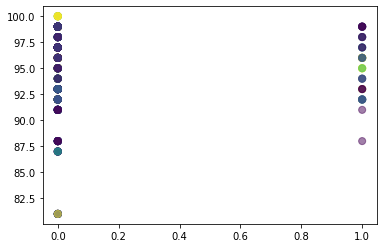

Social smoker vs Disciplinary failure


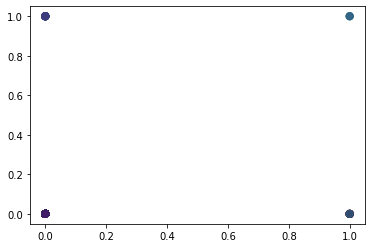

Social smoker vs Education


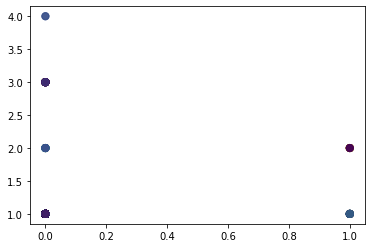

Social smoker vs Son


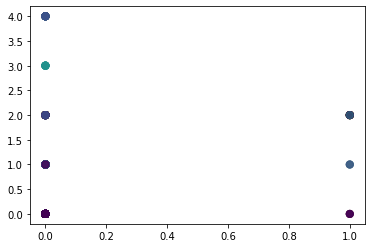

Social smoker vs Social drinker


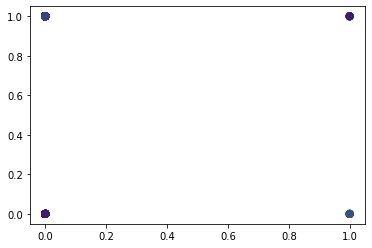

Social smoker vs Pet


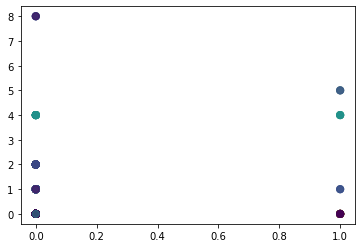

Social smoker vs Weight


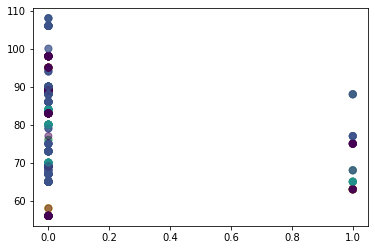

Social smoker vs Height


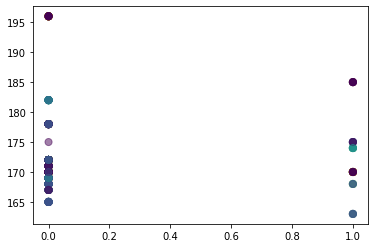

Social smoker vs Body mass index


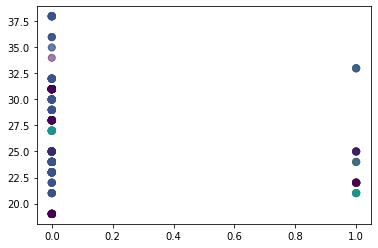

Social smoker vs Absenteeism time in hours


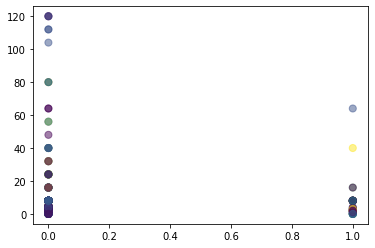

Pet vs Reason for absence


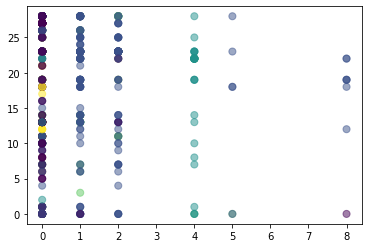

Pet vs Month of absence


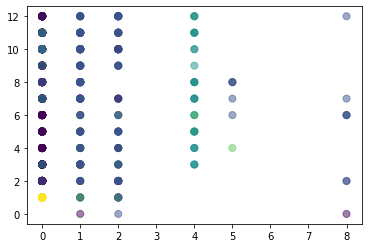

Pet vs Day of the week


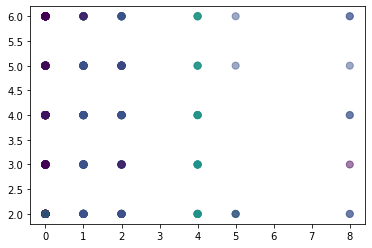

Pet vs Seasons


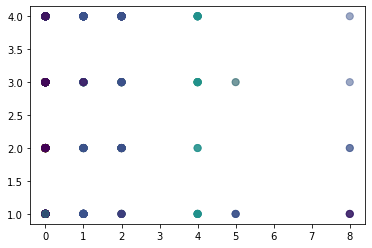

Pet vs Transportation expense


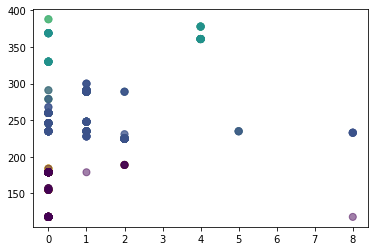

Pet vs Distance from Residence to Work


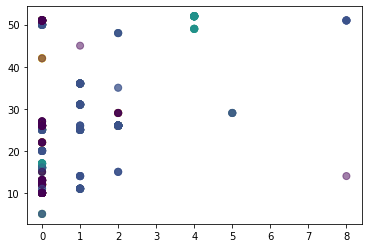

Pet vs Service time


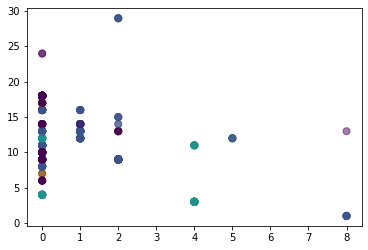

Pet vs Age


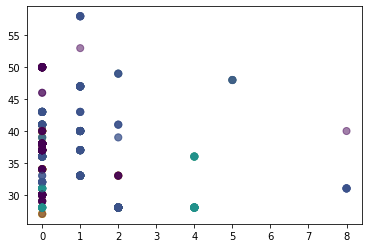

Pet vs Work load Average/day 


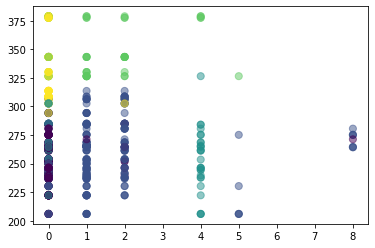

Pet vs Hit target


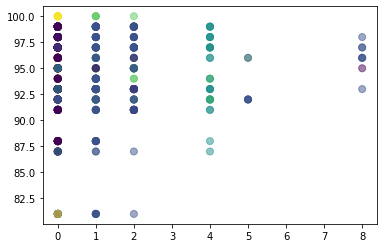

Pet vs Disciplinary failure


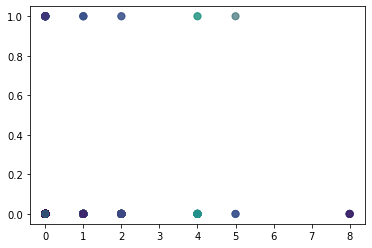

Pet vs Education


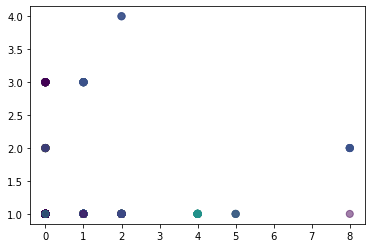

Pet vs Son


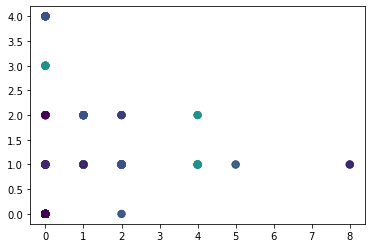

Pet vs Social drinker


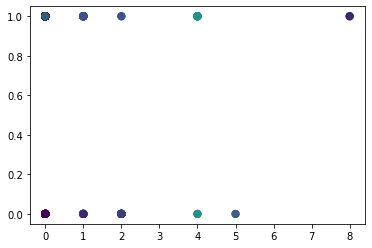

Pet vs Social smoker


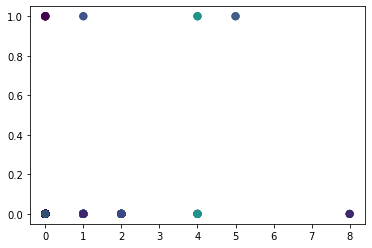

Pet vs Weight


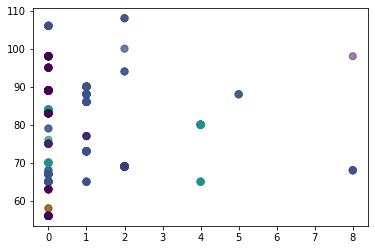

Pet vs Height


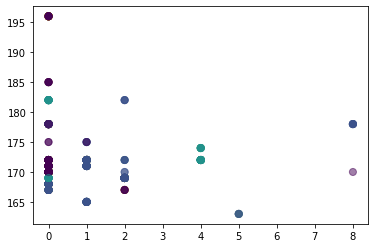

Pet vs Body mass index


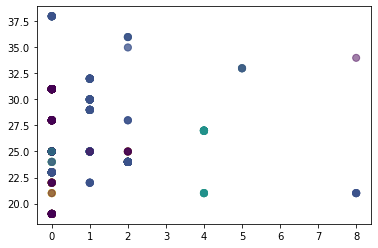

Pet vs Absenteeism time in hours


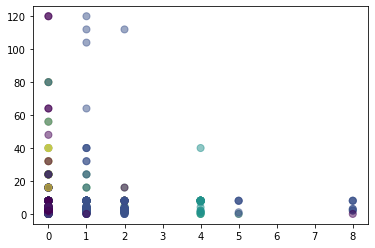

Weight vs Reason for absence


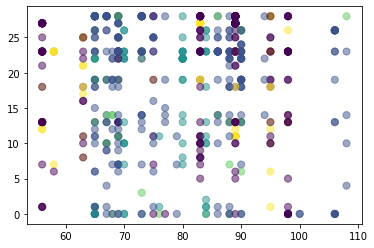

Weight vs Month of absence


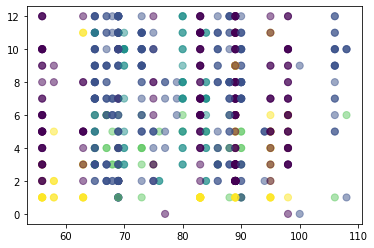

Weight vs Day of the week


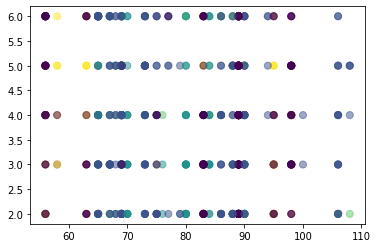

Weight vs Seasons


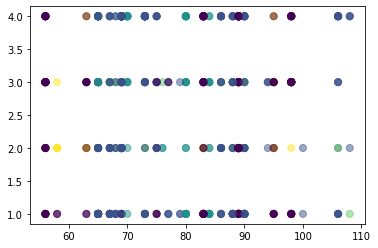

Weight vs Transportation expense


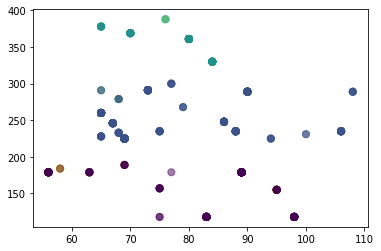

Weight vs Distance from Residence to Work


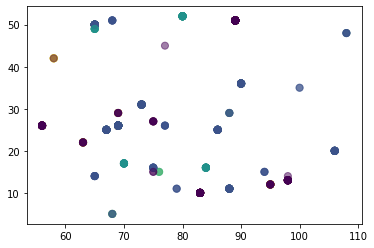

Weight vs Service time


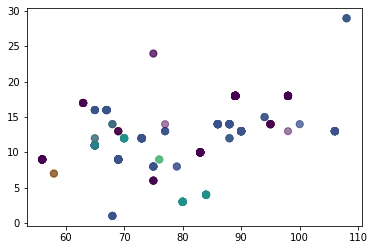

Weight vs Age


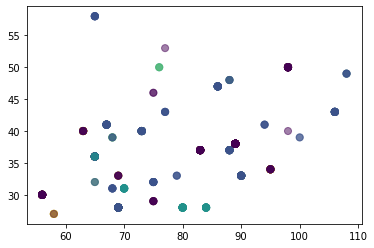

Weight vs Work load Average/day 


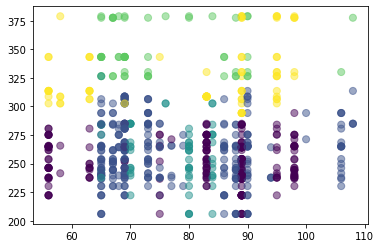

Weight vs Hit target


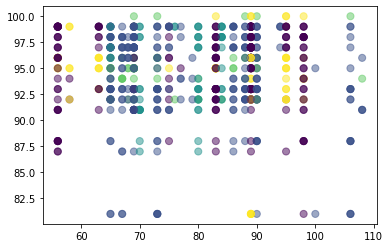

Weight vs Disciplinary failure


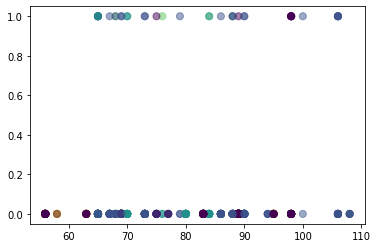

Weight vs Education


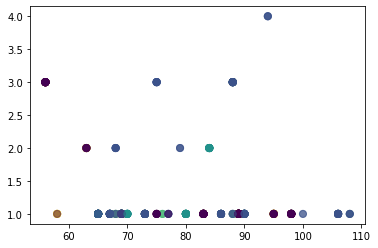

Weight vs Son


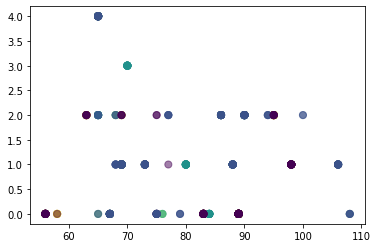

Weight vs Social drinker


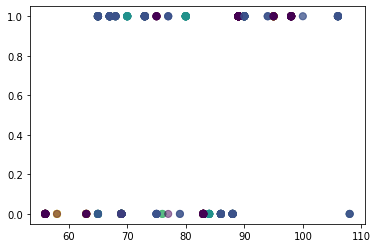

Weight vs Social smoker


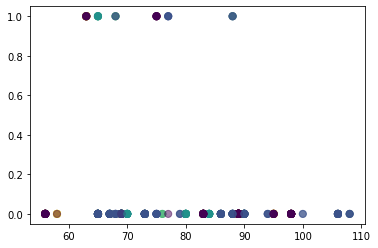

Weight vs Pet


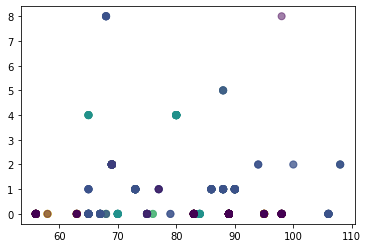

Weight vs Height


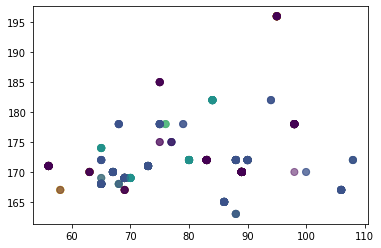

Weight vs Body mass index


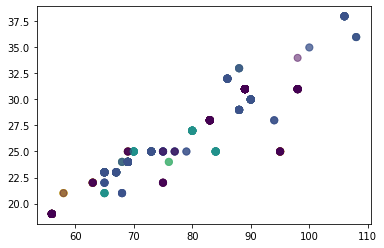

Weight vs Absenteeism time in hours


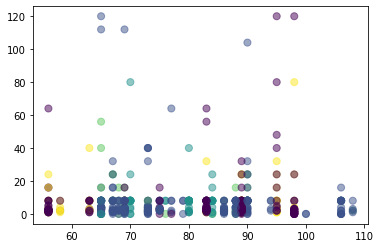

Height vs Reason for absence


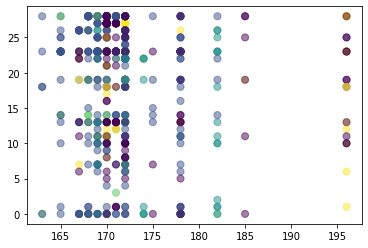

Height vs Month of absence


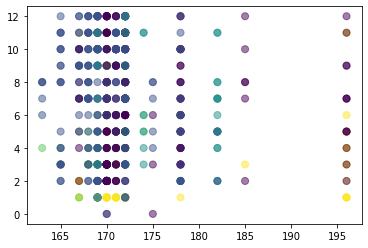

Height vs Day of the week


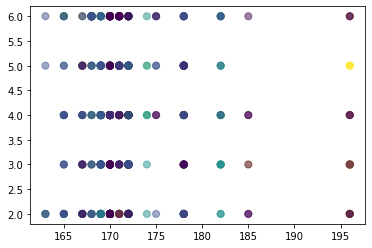

Height vs Seasons


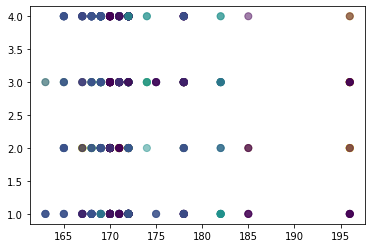

Height vs Transportation expense


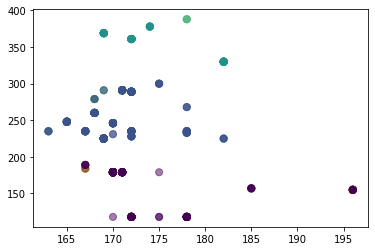

Height vs Distance from Residence to Work


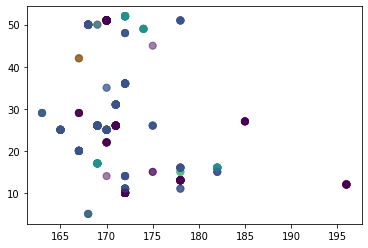

Height vs Service time


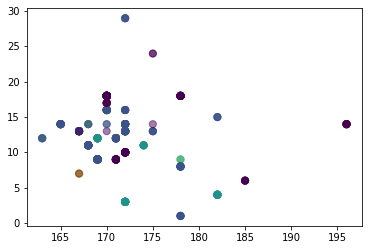

Height vs Age


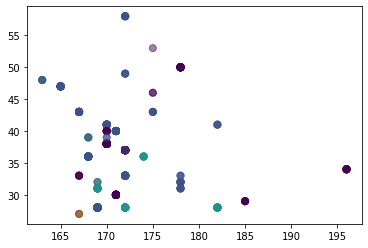

Height vs Work load Average/day 


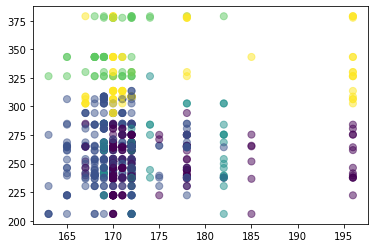

Height vs Hit target


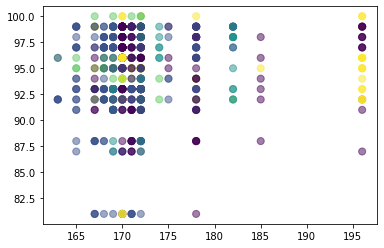

Height vs Disciplinary failure


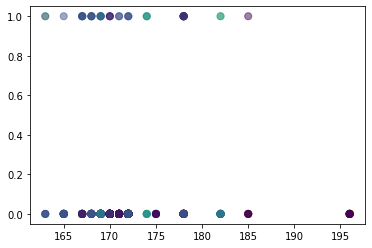

Height vs Education


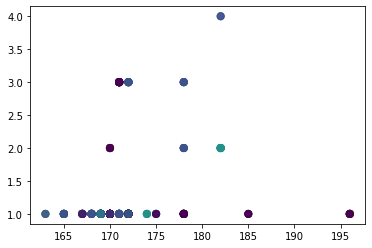

Height vs Son


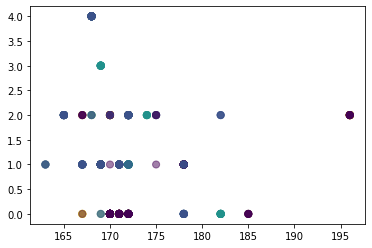

Height vs Social drinker


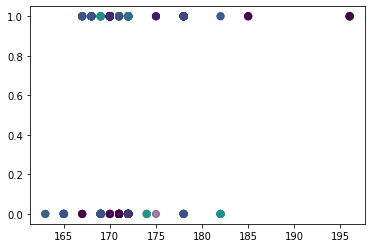

Height vs Social smoker


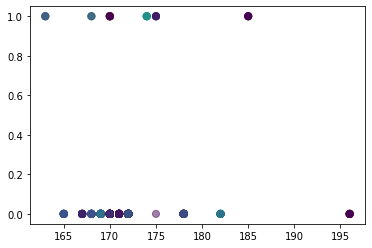

Height vs Pet


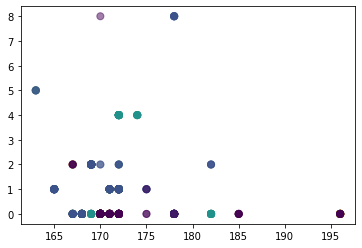

Height vs Weight


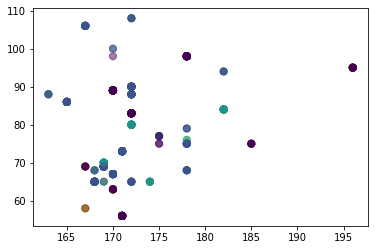

Height vs Body mass index


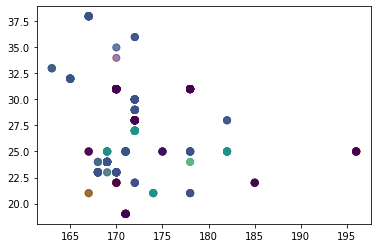

Height vs Absenteeism time in hours


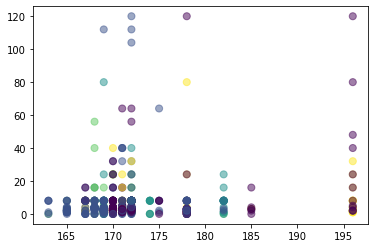

Body mass index vs Reason for absence


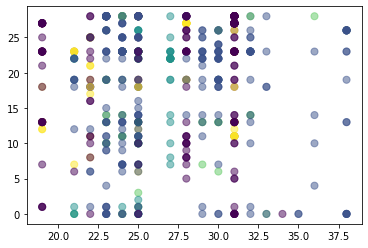

Body mass index vs Month of absence


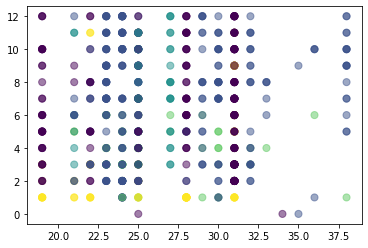

Body mass index vs Day of the week


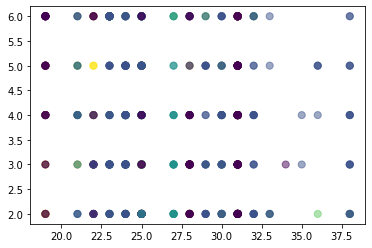

Body mass index vs Seasons


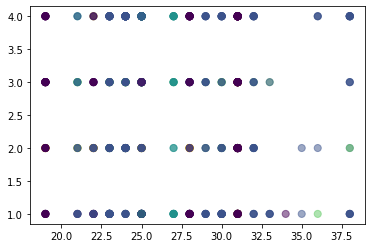

Body mass index vs Transportation expense


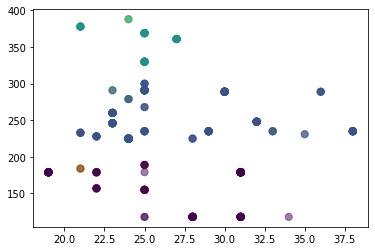

Body mass index vs Distance from Residence to Work


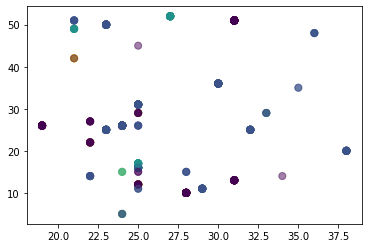

Body mass index vs Service time


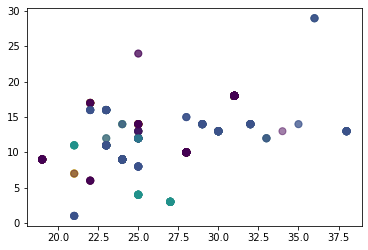

Body mass index vs Age


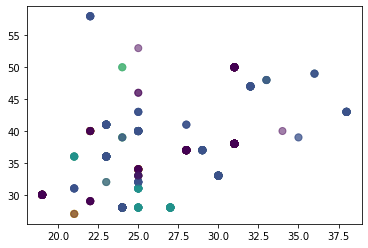

Body mass index vs Work load Average/day 


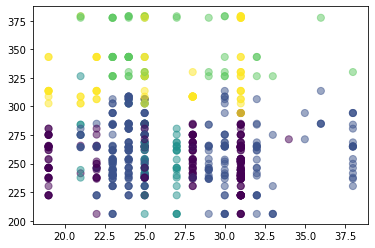

Body mass index vs Hit target


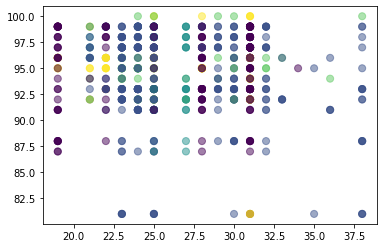

Body mass index vs Disciplinary failure


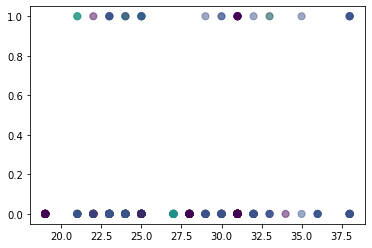

Body mass index vs Education


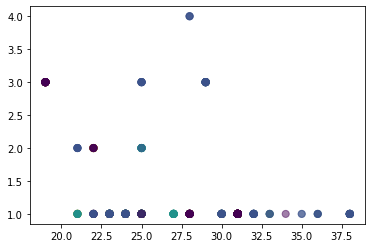

Body mass index vs Son


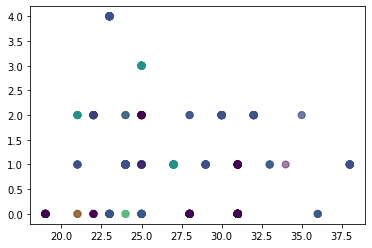

Body mass index vs Social drinker


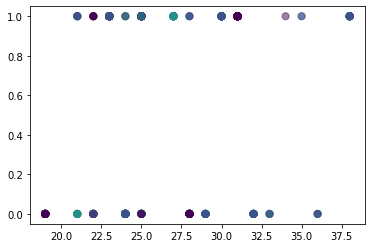

Body mass index vs Social smoker


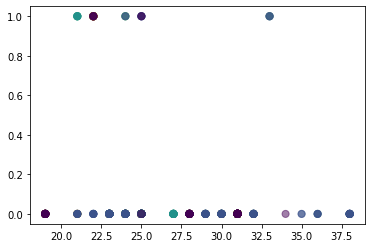

Body mass index vs Pet


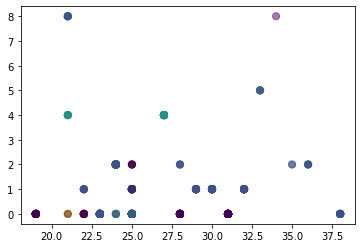

Body mass index vs Weight


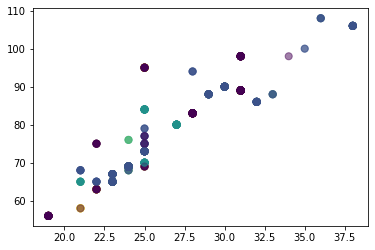

Body mass index vs Height


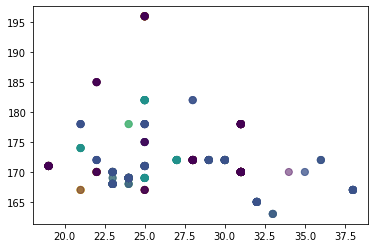

Body mass index vs Absenteeism time in hours


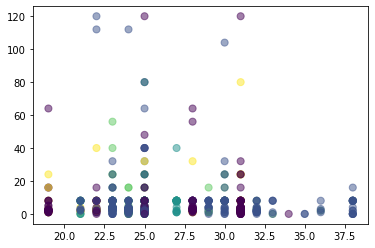

Absenteeism time in hours vs Reason for absence


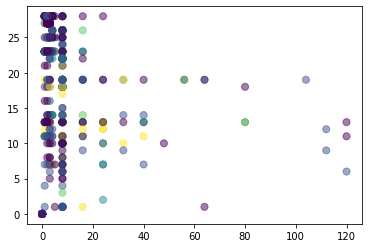

Absenteeism time in hours vs Month of absence


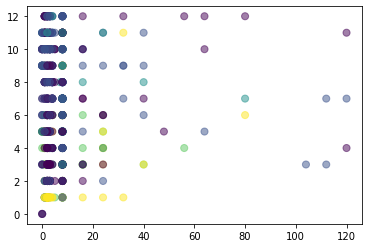

Absenteeism time in hours vs Day of the week


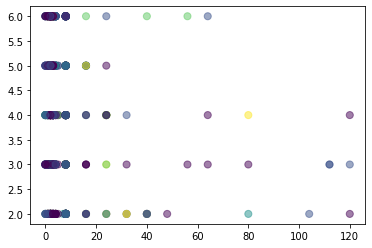

Absenteeism time in hours vs Seasons


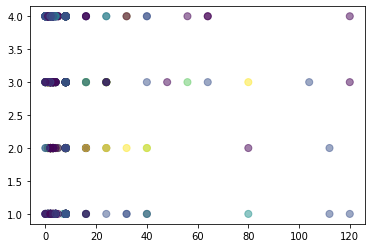

Absenteeism time in hours vs Transportation expense


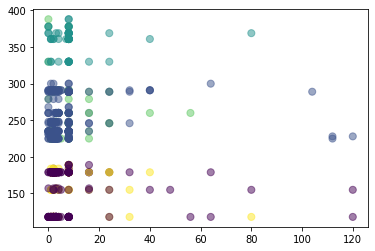

Absenteeism time in hours vs Distance from Residence to Work


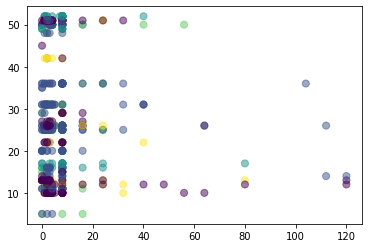

Absenteeism time in hours vs Service time


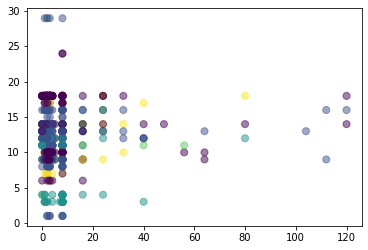

Absenteeism time in hours vs Age


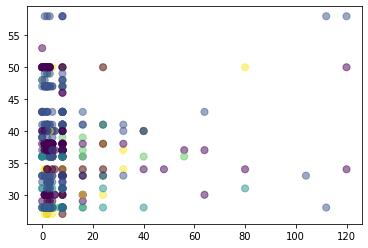

Absenteeism time in hours vs Work load Average/day 


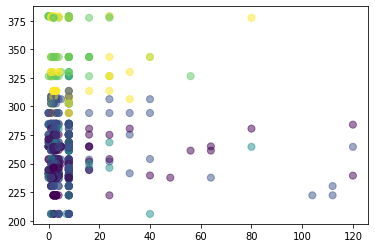

Absenteeism time in hours vs Hit target


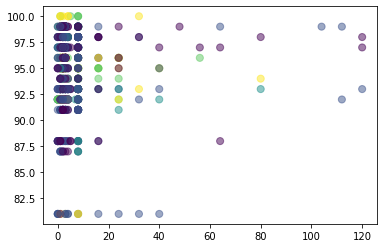

Absenteeism time in hours vs Disciplinary failure


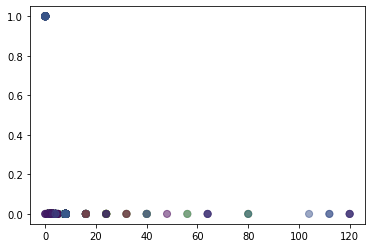

Absenteeism time in hours vs Education


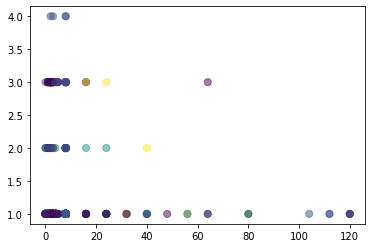

Absenteeism time in hours vs Son


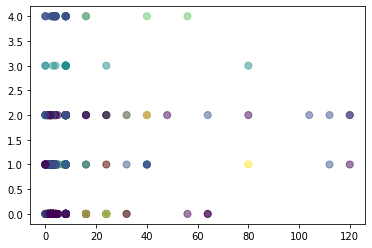

Absenteeism time in hours vs Social drinker


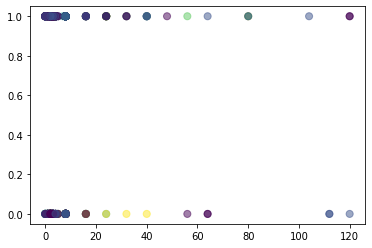

Absenteeism time in hours vs Social smoker


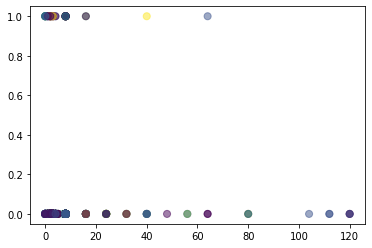

Absenteeism time in hours vs Pet


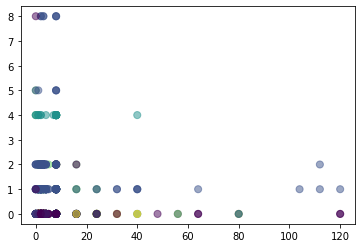

Absenteeism time in hours vs Weight


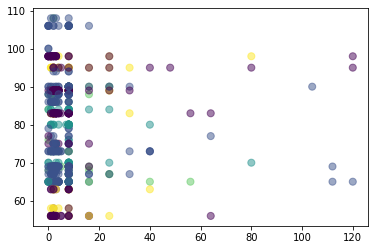

Absenteeism time in hours vs Height


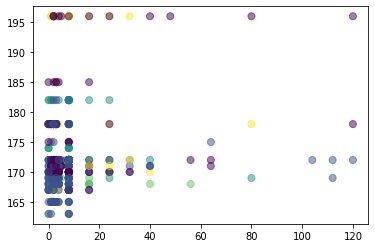

Absenteeism time in hours vs Body mass index


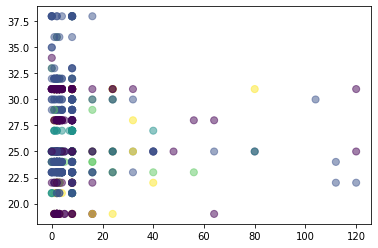

In [ ]:
for i in df.columns:
  for j in df.columns:
    if i!=j:
      print(i ,'vs' ,j)
      plt.scatter(df[i], df[j], c= df_plot1['cluster'], s=50, alpha=0.5)
      plt.show()

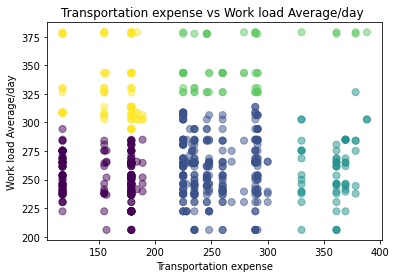

In [ ]:
plt.scatter(df['Transportation expense'],df['Work load Average/day '], c= df_plot1['cluster'], s=50, alpha=0.5)
plt.ylabel('Work load Average/day')
plt.xlabel('Transportation expense')
plt.title('Transportation expense vs Work load Average/day ')
plt.show()

In [ ]:
df_plot1['cluster'].value_counts()

1    301
0    240
4     83
2     60
3     56
Name: cluster, dtype: int64

##INFERENCE

The employee who are top contributors are from cluster 3 of hierarchical clustering

In [ ]:
df['Clusters']=df_plot1['cluster']
df.head(2)

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,...,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours,Clusters
0,26,7,3,1,289,36,13,33,239.554,97,...,1,2,1,0,1,90,172,30,4,1
1,0,7,3,1,118,13,18,50,239.554,97,...,1,1,1,0,0,98,178,31,0,0


In [ ]:
df['Clusters'].value_counts()

1    301
0    240
4     83
2     60
3     56
Name: Clusters, dtype: int64

In [ ]:
ind=df[df['Clusters']==3].index

In [ ]:
id=DDF.iloc[ind]['ID']
id=np.array(id)

In [ ]:
print('The top contributors are of ID',id)

The top contributors are of ID [19 20 15 20 33 20 20 11 20 28  7 28 28 28 28  7 28 33 28 15 28 24 28 20
 15 24 15 33 20 11 11  1  2 11 28 11  7 18 23 31 10 24 10 24 15 24 24  1
 23 32 28 28  1 11 15  5]
